In [127]:
import re
def extract_number(item):
    return int(re.search(r'\d+', item).group())

print(extract_number('adf-sample-agent-java10'))

10


In [128]:
from datetime import datetime
import os
import pandas as pd

repos_path = os.path.join('data', 'repos', 'simulation')
analyzed_repos_path = os.path.join('data', 'analyzed_repos', 'simulation')
all_analyzed_commits_path = os.path.join('data', 'analyzed_repos_commits')
dj_file_path = os.path.join('apps', 'DJ', 'DesigniteJava.jar')

imp_agg = pd.DataFrame(columns=['Project','Package', 'Type','Method', 'Smell', 'start', 'end', 'removed'])
des_agg = pd.DataFrame(columns=['Project','Package', 'Type', 'Smell', 'start', 'end', 'removed'])
arch_agg = pd.DataFrame(columns=['Project', 'Package', 'Smell', 'start', 'end', 'removed'])

for folder in os.listdir(all_analyzed_commits_path):
    print("Analyzing ", folder)
    folder_path = os.path.join(all_analyzed_commits_path, folder)

    res_path = os.path.join(folder_path, "commits.csv")
    
#     continue
    df = pd.read_csv(res_path)
    df = df.sort_values('date', ascending=False)
    df_commits = df['commit'].tolist()
    
    analyzed_repo_commits_path = os.path.join(all_analyzed_commits_path, folder)
    
    commit_folders = os.listdir(analyzed_repo_commits_path)
    
    commit_folders = [item for item in commit_folders if folder in item]
    commit_folders = sorted(commit_folders, key=extract_number, reverse=True)
    
    if len(commit_folders) < 4:
        print("Not enough commits")
        continue
    
    sub_imp_agg = pd.DataFrame(columns=['Project','Package', 'Type','Method', 'Smell', 'start', 'end', 'removed'])
    sub_des_agg = pd.DataFrame(columns=['Project','Package', 'Type', 'Smell', 'start', 'end', 'removed'])
    sub_arch_agg = pd.DataFrame(columns=['Project', 'Package', 'Smell', 'start', 'end', 'removed'])
    for analyzed_commit in commit_folders:
        print("Analyzing commit ", analyzed_commit)
        
        analyzed_commits_path = os.path.join(analyzed_repo_commits_path, analyzed_commit)
        metrics_path = os.path.join(analyzed_commits_path, 'MethodMetrics.csv')
        implementaion_path = os.path.join(analyzed_commits_path, 'ImplementationSmells.csv')
        design_path = os.path.join(analyzed_commits_path, 'DesignSmells.csv')
        arch_path = os.path.join(analyzed_commits_path, 'ArchitectureSmells.csv')
        
        time_file = os.path.join(analyzed_commits_path, 'commit_date.txt')
        
        if os.path.exists(metrics_path):
            
            time = datetime.now()
            with open(time_file, 'r') as time:
                time = datetime.strptime(time.read(), "%Y-%m-%d %H:%M:%S%z")
            
            
            #Implementaion             
            implementation = pd.read_csv(implementaion_path, on_bad_lines='warn')
#             implementation = implementation.drop_duplicates()
#             print(implementation.columns)
            
            implementation = implementation.rename(columns={
            'Project Name': 'Project',
            'Package Name': 'Package',
            'Type Name': 'Type',
            'Method Name': 'Method',
            'Implementation Smell': 'Smell'
            })
               
            merged = pd.merge(implementation, sub_imp_agg, on=['Project', 'Package','Type','Method', 'Smell'], how='outer', indicator=True)
            
            new_rows =  merged[(merged['_merge'] == 'left_only')]
            new_rows.loc[:, 'start'] = time
            new_rows.loc[:, 'end'] = time
            new_rows.loc[:, 'removed'] = 0
            
            if sub_imp_agg.empty:
                sub_imp_agg = new_rows.copy()
            elif not new_rows.empty:
                sub_imp_agg = pd.concat([sub_imp_agg, new_rows])
            
            common_rows = merged[merged['_merge'] == 'both']
            common_df = sub_imp_agg[sub_imp_agg.index.isin(common_rows.index)]
            
            common_df_removed = common_df[common_df['removed'] == 1]
            common_df_removed.loc[:, 'removed'] = 0
            common_df_removed.loc[:, 'start'] = time
            common_df_removed.loc[:, 'end'] = time

        
            if not common_df_removed.empty:
                sub_imp_agg = pd.concat([sub_imp_agg, common_df_removed])
            
            common_df_not_removed = common_df[common_df['removed'] == 0]
            if not common_df_not_removed.empty:
                sub_imp_agg.loc[sub_imp_agg.index.isin(common_df_not_removed.index), 'end'] = time

#             if not common_rows.empty:
#                 sub_imp_agg.loc[sub_imp_agg.index.isin(common_rows.index), 'end'] = time
#                 sub_imp_agg.loc[sub_imp_agg.index.isin(common_rows.index), 'removed'] = 0

            
            removed_rows =  merged[(merged['_merge'] == 'right_only')]
            if not removed_rows.empty:
                sub_imp_agg.loc[sub_imp_agg.index.isin(removed_rows.index), 'removed'] = 1
                sub_imp_agg.loc[sub_imp_agg.index.isin(removed_rows.index), 'end'] = time

            cols_to_drop = set(sub_imp_agg.columns) - set(['Project','Package', 'Smell','Type','Method', 'start', 'end', 'removed'])
            sub_imp_agg = sub_imp_agg.drop(cols_to_drop, axis=1)
            
            #Design             
            design = pd.read_csv(design_path, on_bad_lines='warn')
#             design = design.drop_duplicates()
            
            design = design.rename(columns={
            'Project Name': 'Project',
            'Package Name': 'Package',
            'Type Name': 'Type',
            'Design Smell': 'Smell'
            })
            
            
            merged = pd.merge(design, sub_des_agg, on=['Project', 'Package','Type', 'Smell'], how='outer', indicator=True)
            
            new_rows =  merged[(merged['_merge'] == 'left_only')]
            new_rows.loc[:, 'start'] = time
            new_rows.loc[:, 'end'] = time
            new_rows.loc[:, 'removed'] = 0
            
            if sub_des_agg.empty:
                sub_des_agg = new_rows.copy()
            elif not new_rows.empty:
                sub_des_agg = pd.concat([sub_des_agg, new_rows])
            
            common_rows = merged[merged['_merge'] == 'both']
            common_df = sub_des_agg[sub_des_agg.index.isin(common_rows.index)]
            
            common_df_removed = common_df[common_df['removed'] == 1]
            common_df_removed.loc[:, 'removed'] = 0
            common_df_removed.loc[:, 'start'] = time
            common_df_removed.loc[:, 'end'] = time
            
            if not common_df_removed.empty:
                sub_des_agg = pd.concat([sub_des_agg, common_df_removed])
            
            common_df_not_removed = common_df[common_df['removed'] == 0]
            if not common_df_removed.empty:
                sub_des_agg.loc[sub_des_agg.index.isin(common_df_not_removed.index), 'end'] = time
                
#             if not common_rows.empty:
#                 sub_des_agg.loc[sub_des_agg.index.isin(common_rows.index), 'end'] = time
#                 sub_des_agg.loc[sub_des_agg.index.isin(common_rows.index), 'removed'] = 0

            
            removed_rows =  merged[(merged['_merge'] == 'right_only')]
            
            if not removed_rows.empty:
                sub_des_agg.loc[sub_des_agg.index.isin(removed_rows.index), 'removed'] = 1
                sub_des_agg.loc[sub_des_agg.index.isin(removed_rows.index), 'end'] = time

            cols_to_drop = set(sub_des_agg.columns) - set(['Project','Package','Type', 'Smell', 'start', 'end', 'removed'])
            sub_des_agg = sub_des_agg.drop(cols_to_drop, axis=1)
            
            #Architecture             
            architecure = pd.read_csv(arch_path, on_bad_lines='warn')
#             architecture = architecture.drop_duplicates()
            
            architecure = architecure.rename(columns={
            'Project Name': 'Project',
            'Package Name': 'Package',
            'Architecture Smell': 'Smell'
            })
            
            
            merged = pd.merge(architecure, sub_arch_agg, on=['Project', 'Package', 'Smell'], how='outer', indicator=True)

            new_rows =  merged[(merged['_merge'] == 'left_only')]
            new_rows.loc[:, 'start'] = time
            new_rows.loc[:, 'end'] = time
            new_rows.loc[:, 'removed'] = 0
            
            if sub_arch_agg.empty:
                sub_arch_agg = new_rows.copy()
            elif not new_rows.empty:
                sub_arch_agg = pd.concat([sub_arch_agg, new_rows])
            
            common_rows = merged[merged['_merge'] == 'both']
            common_df = sub_arch_agg[sub_arch_agg.index.isin(common_rows.index)]
            
            common_df_removed = common_df[common_df['removed'] == 1]
            common_df_removed.loc[:, 'removed'] = 0
            common_df_removed.loc[:, 'start'] = time
            common_df_removed.loc[:, 'end'] = time
            
            if not common_df_removed.empty:
                sub_arch_agg = pd.concat([sub_arch_agg, common_df_removed])
            
            common_df_not_removed = common_df[common_df['removed'] == 0]
            if not common_df_removed.empty:
                sub_arch_agg.loc[sub_arch_agg.index.isin(common_df_not_removed.index), 'end'] = time
                
#             if not common_rows.empty:
#                 sub_arch_agg.loc[sub_arch_agg.index.isin(common_rows.index), 'removed'] = 0
#                 sub_arch_agg.loc[sub_arch_agg.index.isin(common_rows.index), 'end'] = time
            
            cols_to_drop = set(sub_arch_agg.columns) - set(['Project','Package', 'Smell', 'start', 'end', 'removed'])
            sub_arch_agg = sub_arch_agg.drop(cols_to_drop, axis=1)
            
            removed_rows =  merged[(merged['_merge'] == 'right_only')]
            if not removed_rows.empty:
                sub_arch_agg.loc[sub_arch_agg.index.isin(removed_rows.index), 'removed'] = 1
                sub_arch_agg.loc[sub_arch_agg.index.isin(removed_rows.index), 'end'] = time
        
        
            sub_imp_agg = sub_imp_agg.drop_duplicates()
            sub_des_agg = sub_des_agg.drop_duplicates()
            sub_arch_agg = sub_arch_agg.drop_duplicates()
        
        imp_agg = pd.concat([imp_agg, sub_imp_agg])
        des_agg = pd.concat([des_agg, sub_des_agg])
        arch_agg = pd.concat([arch_agg, sub_arch_agg])


Analyzing  adf-sample-agent-java
Analyzing commit  adf-sample-agent-java33
Analyzing commit  adf-sample-agent-java32
Analyzing commit  adf-sample-agent-java31
Analyzing commit  adf-sample-agent-java30
Analyzing commit  adf-sample-agent-java29
Analyzing commit  adf-sample-agent-java28
Analyzing commit  adf-sample-agent-java27


Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27

Analyzing commit  adf-sample-agent-java26
Analyzing commit  adf-sample-agent-java25
Analyzing commit  adf-sample-agent-java24
Analyzing commit  adf-sample-agent-java23
Analyzing commit  adf-sample-agent-java22
Analyzing commit  adf-sample-agent-java21


Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6

Skipping line 14: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping l

Analyzing commit  adf-sample-agent-java20
Analyzing commit  adf-sample-agent-java19
Analyzing commit  adf-sample-agent-java18
Analyzing commit  adf-sample-agent-java17
Analyzing commit  adf-sample-agent-java16
Analyzing commit  adf-sample-agent-java15
Analyzing commit  adf-sample-agent-java14
Analyzing commit  adf-sample-agent-java13
Analyzing commit  adf-sample-agent-java12
Analyzing commit  adf-sample-agent-java11
Analyzing commit  adf-sample-agent-java10
Analyzing commit  adf-sample-agent-java9


Skipping line 14: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6

Skipping line 14: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping l

Analyzing commit  adf-sample-agent-java8
Analyzing commit  adf-sample-agent-java7
Analyzing commit  adf-sample-agent-java6
Analyzing commit  adf-sample-agent-java5
Analyzing commit  adf-sample-agent-java4
Analyzing commit  adf-sample-agent-java3
Analyzing commit  adf-sample-agent-java2


Skipping line 14: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6

Skipping line 14: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping l

Analyzing commit  adf-sample-agent-java1
Analyzing commit  adf-sample-agent-java0
Analyzing  amod
Analyzing commit  amod26
Analyzing commit  amod25
Analyzing commit  amod24
Analyzing commit  amod23
Analyzing commit  amod22
Analyzing commit  amod21
Analyzing commit  amod20
Analyzing commit  amod19
Analyzing commit  amod18
Analyzing commit  amod17
Analyzing commit  amod16
Analyzing commit  amod15
Analyzing commit  amod14
Analyzing commit  amod13
Analyzing commit  amod12
Analyzing commit  amod11
Analyzing commit  amod10
Analyzing commit  amod9
Analyzing commit  amod8
Analyzing commit  amod7
Analyzing commit  amod6
Analyzing commit  amod5
Analyzing commit  amod4
Analyzing commit  amod3
Analyzing commit  amod2
Analyzing commit  amod1
Analyzing commit  amod0
Analyzing  amodeus
Analyzing commit  amodeus34
Analyzing commit  amodeus33
Analyzing commit  amodeus32
Analyzing commit  amodeus31
Analyzing commit  amodeus30
Analyzing commit  amodeus29


Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping lin

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 

Analyzing commit  amodeus28
Analyzing commit  amodeus27
Analyzing commit  amodeus26
Analyzing commit  amodeus25
Analyzing commit  amodeus24
Analyzing commit  amodeus23
Analyzing commit  amodeus22
Analyzing commit  amodeus21
Analyzing commit  amodeus20
Analyzing commit  amodeus19
Analyzing commit  amodeus18
Analyzing commit  amodeus17
Analyzing commit  amodeus16
Analyzing commit  amodeus15
Analyzing commit  amodeus14
Analyzing commit  amodeus13
Analyzing commit  amodeus12
Analyzing commit  amodeus11
Analyzing commit  amodeus10
Analyzing commit  amodeus9
Analyzing commit  amodeus8
Analyzing commit  amodeus7


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48

Analyzing commit  amodeus6
Analyzing commit  amodeus5
Analyzing commit  amodeus4
Analyzing commit  amodeus3


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48

Analyzing commit  amodeus2
Analyzing commit  amodeus1
Analyzing commit  amodeus0
Analyzing  Black-Scholes-Option-Pricing-Model
Not enough commits
Analyzing  BoomChess-Android
Not enough commits
Analyzing  cas
Analyzing commit  cas14
Analyzing commit  cas13
Analyzing commit  cas12
Analyzing commit  cas11
Analyzing commit  cas10
Analyzing commit  cas9


Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  cas8
Analyzing commit  cas7
Analyzing commit  cas6
Analyzing commit  cas5
Analyzing commit  cas4
Analyzing commit  cas3
Analyzing commit  cas2
Analyzing commit  cas1
Analyzing commit  cas0
Analyzing  cloudsimplus
Analyzing commit  cloudsimplus10
Analyzing commit  cloudsimplus9
Analyzing commit  cloudsimplus8


Skipping line 44: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 317: expected 5 fields, saw 6
Skipping line 321: expected 5 fields, saw 6
Skipping line 322: expected 5 fields, saw 6
Skipping line 323: expected 5 fields, saw 6
Skipping line 326: expected 5 fields, saw 6
Skipping line 327: expected 5 fields, saw 6

Skipping line 44: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 317: expected 5 fields, s

Analyzing commit  cloudsimplus7
Analyzing commit  cloudsimplus6
Analyzing commit  cloudsimplus5
Analyzing commit  cloudsimplus4
Analyzing commit  cloudsimplus3


Skipping line 82: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 272: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 6
Skipping line 275: expected 5 fields, saw 6
Skipping line 276: expected 5 fields, saw 6
Skipping line 279: expected 5 fields, saw 6
Skipping line 280: expected 5 fields, saw 6
Skipping line 291: expected 5 fields, saw 6
Skipping line 299: expected 5 fields, saw 6

Skipping line 83: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skipping line 281: expected 5 fields, saw 6
Skipping line 283: expected 5 fie

Analyzing commit  cloudsimplus2
Analyzing commit  cloudsimplus1
Analyzing commit  cloudsimplus0
Analyzing  cloudsimplus-automation
Analyzing commit  cloudsimplus-automation19
Analyzing commit  cloudsimplus-automation18
Analyzing commit  cloudsimplus-automation17


Skipping line 23: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6

Skipping line 23: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6

Skipping line 23: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6



Analyzing commit  cloudsimplus-automation16
Analyzing commit  cloudsimplus-automation15
Analyzing commit  cloudsimplus-automation14
Analyzing commit  cloudsimplus-automation13
Analyzing commit  cloudsimplus-automation12
Analyzing commit  cloudsimplus-automation11
Analyzing commit  cloudsimplus-automation10
Analyzing commit  cloudsimplus-automation9
Analyzing commit  cloudsimplus-automation8
Analyzing commit  cloudsimplus-automation7
Analyzing commit  cloudsimplus-automation6
Analyzing commit  cloudsimplus-automation5
Analyzing commit  cloudsimplus-automation4
Analyzing commit  cloudsimplus-automation3
Analyzing commit  cloudsimplus-automation2
Analyzing commit  cloudsimplus-automation1
Analyzing commit  cloudsimplus-automation0
Analyzing  cloudsimplus-examples
Analyzing commit  cloudsimplus-examples10
Analyzing commit  cloudsimplus-examples9
Analyzing commit  cloudsimplus-examples8
Analyzing commit  cloudsimplus-examples7
Analyzing commit  cloudsimplus-examples6
Analyzing commit  cloud

Skipping line 24: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6

Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6

Skipping line 21: expected 5 fields, saw 6
Skipping 

Analyzing commit  cloudsimsdn9
Analyzing commit  cloudsimsdn8
Analyzing commit  cloudsimsdn7
Analyzing commit  cloudsimsdn6
Analyzing commit  cloudsimsdn5


Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6

Skipping line 15: expected 5 fields, saw 6
Skippin

Analyzing commit  cloudsimsdn4
Analyzing commit  cloudsimsdn3
Analyzing commit  cloudsimsdn2
Analyzing commit  cloudsimsdn1
Analyzing commit  cloudsimsdn0


Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6

Skipping line 18: expected 5 fields, saw 6
Skippin

Analyzing  computer_kurzweil
Analyzing commit  computer_kurzweil12
Analyzing commit  computer_kurzweil11
Analyzing commit  computer_kurzweil10
Analyzing commit  computer_kurzweil9
Analyzing commit  computer_kurzweil8


Skipping line 8: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping

Analyzing commit  computer_kurzweil7
Analyzing commit  computer_kurzweil6
Analyzing commit  computer_kurzweil5
Analyzing commit  computer_kurzweil4
Analyzing commit  computer_kurzweil3


Skipping line 8: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping

Analyzing commit  computer_kurzweil2
Analyzing commit  computer_kurzweil1
Analyzing commit  computer_kurzweil0
Analyzing  DesSim
Analyzing commit  DesSim10
Analyzing commit  DesSim9


Skipping line 13: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Ski

Analyzing commit  DesSim8
Analyzing commit  DesSim7
Analyzing commit  DesSim6
Analyzing commit  DesSim5
Analyzing commit  DesSim4
Analyzing commit  DesSim3


Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6

Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6

Skipping line 12: expected 5 fields, saw 6
Skipping 

Analyzing commit  DesSim2
Analyzing commit  DesSim1
Analyzing commit  DesSim0
Analyzing  ecosim
Analyzing commit  ecosim37
Analyzing commit  ecosim36
Analyzing commit  ecosim35
Analyzing commit  ecosim34


Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6

Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping l

Analyzing commit  ecosim33
Analyzing commit  ecosim32
Analyzing commit  ecosim31
Analyzing commit  ecosim30
Analyzing commit  ecosim29
Analyzing commit  ecosim28


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  ecosim27
Analyzing commit  ecosim26
Analyzing commit  ecosim25
Analyzing commit  ecosim24
Analyzing commit  ecosim23
Analyzing commit  ecosim22


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8:

Analyzing commit  ecosim21
Analyzing commit  ecosim20
Analyzing commit  ecosim19
Analyzing commit  ecosim18
Analyzing commit  ecosim17


Skipping line 4: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ecosim16
Analyzing commit  ecosim15
Analyzing commit  ecosim14
Analyzing commit  ecosim13
Analyzing commit  ecosim12
Analyzing commit  ecosim11


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16:

Analyzing commit  ecosim10
Analyzing commit  ecosim9
Analyzing commit  ecosim8
Analyzing commit  ecosim7
Analyzing commit  ecosim6
Analyzing commit  ecosim5


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16:

Analyzing commit  ecosim4
Analyzing commit  ecosim3
Analyzing commit  ecosim2
Analyzing commit  ecosim1
Analyzing commit  ecosim0
Analyzing  eqasim-java
Analyzing commit  eqasim-java40


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  eqasim-java39
Analyzing commit  eqasim-java38
Analyzing commit  eqasim-java37
Analyzing commit  eqasim-java36
Analyzing commit  eqasim-java35


Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
S

Analyzing commit  eqasim-java34
Analyzing commit  eqasim-java33
Analyzing commit  eqasim-java32
Analyzing commit  eqasim-java31
Analyzing commit  eqasim-java30


Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
S

Analyzing commit  eqasim-java29
Analyzing commit  eqasim-java28
Analyzing commit  eqasim-java27
Analyzing commit  eqasim-java26
Analyzing commit  eqasim-java25


Skipping line 17: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
S

Analyzing commit  eqasim-java24
Analyzing commit  eqasim-java23
Analyzing commit  eqasim-java22
Analyzing commit  eqasim-java21
Analyzing commit  eqasim-java20
Analyzing commit  eqasim-java19
Analyzing commit  eqasim-java18
Analyzing commit  eqasim-java17
Analyzing commit  eqasim-java16
Analyzing commit  eqasim-java15
Analyzing commit  eqasim-java14
Analyzing commit  eqasim-java13
Analyzing commit  eqasim-java12
Analyzing commit  eqasim-java11
Analyzing commit  eqasim-java10
Analyzing commit  eqasim-java9
Analyzing commit  eqasim-java8
Analyzing commit  eqasim-java7
Analyzing commit  eqasim-java6
Analyzing commit  eqasim-java5
Analyzing commit  eqasim-java4
Analyzing commit  eqasim-java3
Analyzing commit  eqasim-java2
Analyzing commit  eqasim-java1
Analyzing commit  eqasim-java0
Analyzing  EVLib
Analyzing commit  EVLib11
Analyzing commit  EVLib10
Analyzing commit  EVLib9


Skipping line 5: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6

Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6



Analyzing commit  EVLib8
Analyzing commit  EVLib7
Analyzing commit  EVLib6
Analyzing commit  EVLib5
Analyzing commit  EVLib4
Analyzing commit  EVLib3
Analyzing commit  EVLib2
Analyzing commit  EVLib1
Analyzing commit  EVLib0


Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6



Analyzing  Evolving-Protozoa
Analyzing commit  Evolving-Protozoa10
Analyzing commit  Evolving-Protozoa9
Analyzing commit  Evolving-Protozoa8
Analyzing commit  Evolving-Protozoa7
Analyzing commit  Evolving-Protozoa6
Analyzing commit  Evolving-Protozoa5
Analyzing commit  Evolving-Protozoa4
Analyzing commit  Evolving-Protozoa3
Analyzing commit  Evolving-Protozoa2
Analyzing commit  Evolving-Protozoa1
Analyzing commit  Evolving-Protozoa0


Skipping line 12: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line

Analyzing  farmsim
Not enough commits
Analyzing  FlockingSimulation
Not enough commits
Analyzing  gips
Analyzing commit  gips21
Analyzing commit  gips20
Analyzing commit  gips19
Analyzing commit  gips18
Analyzing commit  gips17


Skipping line 104: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, sa

Analyzing commit  gips16
Analyzing commit  gips15
Analyzing commit  gips14
Analyzing commit  gips13


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping lin

Analyzing commit  gips12
Analyzing commit  gips11
Analyzing commit  gips10
Analyzing commit  gips9


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping lin

Analyzing commit  gips8
Analyzing commit  gips7
Analyzing commit  gips6
Analyzing commit  gips5


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping lin

Analyzing commit  gips4
Analyzing commit  gips3
Analyzing commit  gips2
Analyzing commit  gips1
Analyzing commit  gips0


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping lin

Analyzing  iflye
Analyzing commit  iflye24
Analyzing commit  iflye23
Analyzing commit  iflye22
Analyzing commit  iflye21
Analyzing commit  iflye20


Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6

Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6

Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skip

Analyzing commit  iflye19
Analyzing commit  iflye18
Analyzing commit  iflye17
Analyzing commit  iflye16
Analyzing commit  iflye15
Analyzing commit  iflye14
Analyzing commit  iflye13
Analyzing commit  iflye12
Analyzing commit  iflye11


Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6

Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 

Analyzing commit  iflye10
Analyzing commit  iflye9
Analyzing commit  iflye8
Analyzing commit  iflye7
Analyzing commit  iflye6
Analyzing commit  iflye5
Analyzing commit  iflye4
Analyzing commit  iflye3
Analyzing commit  iflye2


Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6

Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 

Analyzing commit  iflye1
Analyzing commit  iflye0
Analyzing  imp_city
Analyzing commit  imp_city4
Analyzing commit  imp_city3


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipp

Analyzing commit  imp_city2
Analyzing commit  imp_city1
Analyzing commit  imp_city0
Analyzing  JSimpleSim
Analyzing commit  JSimpleSim16
Analyzing commit  JSimpleSim15


Skipping line 7: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line

Analyzing commit  JSimpleSim14
Analyzing commit  JSimpleSim13
Analyzing commit  JSimpleSim12
Analyzing commit  JSimpleSim11
Analyzing commit  JSimpleSim10
Analyzing commit  JSimpleSim9
Analyzing commit  JSimpleSim8
Analyzing commit  JSimpleSim7
Analyzing commit  JSimpleSim6
Analyzing commit  JSimpleSim5
Analyzing commit  JSimpleSim4
Analyzing commit  JSimpleSim3
Analyzing commit  JSimpleSim2
Analyzing commit  JSimpleSim1
Analyzing commit  JSimpleSim0


Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping lin

Analyzing  MATSim-UAM
Analyzing commit  MATSim-UAM20
Analyzing commit  MATSim-UAM19
Analyzing commit  MATSim-UAM18
Analyzing commit  MATSim-UAM17
Analyzing commit  MATSim-UAM16


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipp

Analyzing commit  MATSim-UAM15
Analyzing commit  MATSim-UAM14
Analyzing commit  MATSim-UAM13
Analyzing commit  MATSim-UAM12
Analyzing commit  MATSim-UAM11


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping lin

Analyzing commit  MATSim-UAM10
Analyzing commit  MATSim-UAM9
Analyzing commit  MATSim-UAM8
Analyzing commit  MATSim-UAM7


Skipping line 11: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping l

Analyzing commit  MATSim-UAM6
Analyzing commit  MATSim-UAM5
Analyzing commit  MATSim-UAM4
Analyzing commit  MATSim-UAM3


Skipping line 11: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping l

Analyzing commit  MATSim-UAM2
Analyzing commit  MATSim-UAM1
Analyzing commit  MATSim-UAM0
Analyzing  microtrafficsim
Analyzing commit  microtrafficsim20


Skipping line 11: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping 

Analyzing commit  microtrafficsim19
Analyzing commit  microtrafficsim18
Analyzing commit  microtrafficsim17
Analyzing commit  microtrafficsim16


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping

Analyzing commit  microtrafficsim15
Analyzing commit  microtrafficsim14
Analyzing commit  microtrafficsim13
Analyzing commit  microtrafficsim12


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skippi

Analyzing commit  microtrafficsim11
Analyzing commit  microtrafficsim10
Analyzing commit  microtrafficsim9
Analyzing commit  microtrafficsim8


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
S

Analyzing commit  microtrafficsim7
Analyzing commit  microtrafficsim6
Analyzing commit  microtrafficsim5


Skipping line 11: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skip

Analyzing commit  microtrafficsim4
Analyzing commit  microtrafficsim3
Analyzing commit  microtrafficsim2
Analyzing commit  microtrafficsim1


Skipping line 11: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skip

Analyzing commit  microtrafficsim0
Analyzing  Mirage
Analyzing commit  Mirage40
Analyzing commit  Mirage39
Analyzing commit  Mirage38


Skipping line 11: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skip

Analyzing commit  Mirage37
Analyzing commit  Mirage36
Analyzing commit  Mirage35
Analyzing commit  Mirage34


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping li

Analyzing commit  Mirage33
Analyzing commit  Mirage32
Analyzing commit  Mirage31
Analyzing commit  Mirage30


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping lin

Analyzing commit  Mirage29
Analyzing commit  Mirage28
Analyzing commit  Mirage27
Analyzing commit  Mirage26


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping li

Analyzing commit  Mirage25
Analyzing commit  Mirage24
Analyzing commit  Mirage23
Analyzing commit  Mirage22


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Mirage21
Analyzing commit  Mirage20
Analyzing commit  Mirage19
Analyzing commit  Mirage18


Skipping line 6: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping lin

Analyzing commit  Mirage17
Analyzing commit  Mirage16
Analyzing commit  Mirage15
Analyzing commit  Mirage14


Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping lin

Analyzing commit  Mirage13
Analyzing commit  Mirage12
Analyzing commit  Mirage11
Analyzing commit  Mirage10


Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping lin

Analyzing commit  Mirage9
Analyzing commit  Mirage8
Analyzing commit  Mirage7
Analyzing commit  Mirage6


Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping li

Analyzing commit  Mirage5
Analyzing commit  Mirage4
Analyzing commit  Mirage3
Analyzing commit  Mirage2


Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping li

Analyzing commit  Mirage1
Analyzing commit  Mirage0
Analyzing  MiSim
Analyzing commit  MiSim30
Analyzing commit  MiSim29


Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping li

Analyzing commit  MiSim28
Analyzing commit  MiSim27
Analyzing commit  MiSim26
Analyzing commit  MiSim25
Analyzing commit  MiSim24


Skipping line 11: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6

Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6

Skipping line 46: expected 4 fields, saw 5



Analyzing commit  MiSim23
Analyzing commit  MiSim22
Analyzing commit  MiSim21
Analyzing commit  MiSim20


Skipping line 52: expected 4 fields, saw 5

Skipping line 52: expected 4 fields, saw 5

Skipping line 52: expected 4 fields, saw 5

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6

Skipping line 45: expected 4 fields, saw 5



Analyzing commit  MiSim19
Analyzing commit  MiSim18
Analyzing commit  MiSim17
Analyzing commit  MiSim16


Skipping line 52: expected 4 fields, saw 5

Skipping line 52: expected 4 fields, saw 5

Skipping line 52: expected 4 fields, saw 5

Skipping line 56: expected 4 fields, saw 5



Analyzing commit  MiSim15
Analyzing commit  MiSim14
Analyzing commit  MiSim13
Analyzing commit  MiSim12


Skipping line 66: expected 4 fields, saw 5

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6

Skipping line 67: expected 4 fields, saw 5

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping lin

Analyzing commit  MiSim11
Analyzing commit  MiSim10
Analyzing commit  MiSim9
Analyzing commit  MiSim8


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6

Skipping line 69: expected 4 fields, saw 5

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping lin

Analyzing commit  MiSim7
Analyzing commit  MiSim6
Analyzing commit  MiSim5
Analyzing commit  MiSim4


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 

Analyzing commit  MiSim3
Analyzing commit  MiSim2
Analyzing commit  MiSim1
Analyzing commit  MiSim0
Analyzing  multiphysics
Analyzing commit  multiphysics16
Analyzing commit  multiphysics15
Analyzing commit  multiphysics14


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6

Skipping line 16: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
S

Analyzing commit  multiphysics13
Analyzing commit  multiphysics12
Analyzing commit  multiphysics11
Analyzing commit  multiphysics10


Skipping line 16: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fie

Analyzing commit  multiphysics9
Analyzing commit  multiphysics8
Analyzing commit  multiphysics7
Analyzing commit  multiphysics6


Skipping line 16: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fie

Analyzing commit  multiphysics5
Analyzing commit  multiphysics4
Analyzing commit  multiphysics3
Analyzing commit  multiphysics2


Skipping line 16: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fie

Analyzing commit  multiphysics1
Analyzing commit  multiphysics0
Analyzing  NeuGen
Analyzing commit  NeuGen5
Analyzing commit  NeuGen4


Skipping line 16: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fie

Analyzing commit  NeuGen3
Analyzing commit  NeuGen2
Analyzing commit  NeuGen1
Analyzing commit  NeuGen0


Skipping line 15: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping 

Analyzing  ORBrake
Analyzing commit  ORBrake3
Analyzing commit  ORBrake2
Analyzing commit  ORBrake1
Analyzing commit  ORBrake0
Analyzing  Pandemic-Simulator
Not enough commits
Analyzing  pedroEngine
Analyzing commit  pedroEngine37


Skipping line 6: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6



Analyzing commit  pedroEngine36
Analyzing commit  pedroEngine35
Analyzing commit  pedroEngine34
Analyzing commit  pedroEngine33


Skipping line 6: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping lin

Analyzing commit  pedroEngine32
Analyzing commit  pedroEngine31
Analyzing commit  pedroEngine30
Analyzing commit  pedroEngine29


Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping l

Analyzing commit  pedroEngine28
Analyzing commit  pedroEngine27
Analyzing commit  pedroEngine26
Analyzing commit  pedroEngine25


Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Sk

Analyzing commit  pedroEngine24
Analyzing commit  pedroEngine23
Analyzing commit  pedroEngine22
Analyzing commit  pedroEngine21


Skipping line 7: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Sk

Analyzing commit  pedroEngine20
Analyzing commit  pedroEngine19
Analyzing commit  pedroEngine18
Analyzing commit  pedroEngine17


Skipping line 7: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Ski

Analyzing commit  pedroEngine16
Analyzing commit  pedroEngine15
Analyzing commit  pedroEngine14
Analyzing commit  pedroEngine13


Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Ski

Analyzing commit  pedroEngine12
Analyzing commit  pedroEngine11
Analyzing commit  pedroEngine10
Analyzing commit  pedroEngine9
Analyzing commit  pedroEngine8
Analyzing commit  pedroEngine7
Analyzing commit  pedroEngine6


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping l

Analyzing commit  pedroEngine5
Analyzing commit  pedroEngine4
Analyzing commit  pedroEngine3
Analyzing commit  pedroEngine2


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping l

Analyzing commit  pedroEngine1
Analyzing commit  pedroEngine0
Analyzing  plg
Analyzing commit  plg27
Analyzing commit  plg26


Skipping line 7: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping l

Analyzing commit  plg25
Analyzing commit  plg24
Analyzing commit  plg23
Analyzing commit  plg22


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6

Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping

Analyzing commit  plg21
Analyzing commit  plg20
Analyzing commit  plg19
Analyzing commit  plg18


Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping 

Analyzing commit  plg17
Analyzing commit  plg16
Analyzing commit  plg15
Analyzing commit  plg14


Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skippin

Analyzing commit  plg13
Analyzing commit  plg12
Analyzing commit  plg11
Analyzing commit  plg10


Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skippin

Analyzing commit  plg9
Analyzing commit  plg8
Analyzing commit  plg7
Analyzing commit  plg6


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 6
Skipping line 254: expected 5 fields, 

Analyzing commit  plg5
Analyzing commit  plg4
Analyzing commit  plg3
Analyzing commit  plg2
Analyzing commit  plg1
Analyzing commit  plg0
Analyzing  PowerSystemDataModel
Analyzing commit  PowerSystemDataModel52
Analyzing commit  PowerSystemDataModel51


Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6

Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6

Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, sa

Analyzing commit  PowerSystemDataModel50
Analyzing commit  PowerSystemDataModel49
Analyzing commit  PowerSystemDataModel48
Analyzing commit  PowerSystemDataModel47


Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6

Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 field

Analyzing commit  PowerSystemDataModel46
Analyzing commit  PowerSystemDataModel45
Analyzing commit  PowerSystemDataModel44
Analyzing commit  PowerSystemDataModel43


Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fiel

Analyzing commit  PowerSystemDataModel42
Analyzing commit  PowerSystemDataModel41
Analyzing commit  PowerSystemDataModel40
Analyzing commit  PowerSystemDataModel39


Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 196: expected 5 fields

Analyzing commit  PowerSystemDataModel38
Analyzing commit  PowerSystemDataModel37
Analyzing commit  PowerSystemDataModel36


Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields,

Analyzing commit  PowerSystemDataModel35
Analyzing commit  PowerSystemDataModel34
Analyzing commit  PowerSystemDataModel33


Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 205: expected 5 fiel

Analyzing commit  PowerSystemDataModel32
Analyzing commit  PowerSystemDataModel31
Analyzing commit  PowerSystemDataModel30
Analyzing commit  PowerSystemDataModel29


Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 206: expected 5 fiel

Analyzing commit  PowerSystemDataModel28
Analyzing commit  PowerSystemDataModel27
Analyzing commit  PowerSystemDataModel26
Analyzing commit  PowerSystemDataModel25


Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 211: expected 5 fiel

Analyzing commit  PowerSystemDataModel24
Analyzing commit  PowerSystemDataModel23
Analyzing commit  PowerSystemDataModel22


Skipping line 21: expected 4 fields, saw 5

Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 212: expected 5 fiel

Analyzing commit  PowerSystemDataModel21
Analyzing commit  PowerSystemDataModel20
Analyzing commit  PowerSystemDataModel19


Skipping line 20: expected 4 fields, saw 5

Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 215: expected 5 fiel

Analyzing commit  PowerSystemDataModel18
Analyzing commit  PowerSystemDataModel17
Analyzing commit  PowerSystemDataModel16
Analyzing commit  PowerSystemDataModel15


Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fiel

Analyzing commit  PowerSystemDataModel14
Analyzing commit  PowerSystemDataModel13
Analyzing commit  PowerSystemDataModel12


Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 218: expected 5 fi

Analyzing commit  PowerSystemDataModel11
Analyzing commit  PowerSystemDataModel10
Analyzing commit  PowerSystemDataModel9


Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 211: expected 5 fi

Analyzing commit  PowerSystemDataModel8
Analyzing commit  PowerSystemDataModel7
Analyzing commit  PowerSystemDataModel6


Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 210: expected 5 fi

Analyzing commit  PowerSystemDataModel5
Analyzing commit  PowerSystemDataModel4
Analyzing commit  PowerSystemDataModel3


Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fi

Analyzing commit  PowerSystemDataModel2
Analyzing commit  PowerSystemDataModel1
Analyzing commit  PowerSystemDataModel0


Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 210: expected 5 fi

Analyzing  PureEdgeSim
Analyzing commit  PureEdgeSim18
Analyzing commit  PureEdgeSim17
Analyzing commit  PureEdgeSim16
Analyzing commit  PureEdgeSim15


Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6

Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  PureEdgeSim14
Analyzing commit  PureEdgeSim13
Analyzing commit  PureEdgeSim12
Analyzing commit  PureEdgeSim11


Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing commit  PureEdgeSim10
Analyzing commit  PureEdgeSim9
Analyzing commit  PureEdgeSim8
Analyzing commit  PureEdgeSim7


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  PureEdgeSim6
Analyzing commit  PureEdgeSim5
Analyzing commit  PureEdgeSim4
Analyzing commit  PureEdgeSim3


Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6

Skipping line 66: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6

Skipping line 26: expected 5 fields, saw 

Analyzing commit  PureEdgeSim2
Analyzing commit  PureEdgeSim1
Analyzing commit  PureEdgeSim0
Analyzing  QSPcc
Analyzing commit  QSPcc8
Analyzing commit  QSPcc7
Analyzing commit  QSPcc6
Analyzing commit  QSPcc5
Analyzing commit  QSPcc4
Analyzing commit  QSPcc3
Analyzing commit  QSPcc2
Analyzing commit  QSPcc1
Analyzing commit  QSPcc0
Analyzing  react-native-ble-peripheral
Analyzing commit  react-native-ble-peripheral8
Analyzing commit  react-native-ble-peripheral7
Analyzing commit  react-native-ble-peripheral6
Analyzing commit  react-native-ble-peripheral5
Analyzing commit  react-native-ble-peripheral4
Analyzing commit  react-native-ble-peripheral3
Analyzing commit  react-native-ble-peripheral2
Analyzing commit  react-native-ble-peripheral1
Analyzing commit  react-native-ble-peripheral0
Analyzing  riscj-computer-mod
Analyzing commit  riscj-computer-mod3
Analyzing commit  riscj-computer-mod2


Skipping line 4: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 

Analyzing commit  riscj-computer-mod1
Analyzing commit  riscj-computer-mod0
Analyzing  Robot-Overlord-App
Analyzing commit  Robot-Overlord-App67
Analyzing commit  Robot-Overlord-App66


Skipping line 13: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6

Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6



Analyzing commit  Robot-Overlord-App65
Analyzing commit  Robot-Overlord-App64
Analyzing commit  Robot-Overlord-App63
Analyzing commit  Robot-Overlord-App62


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6

Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6

Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skip

Analyzing commit  Robot-Overlord-App61
Analyzing commit  Robot-Overlord-App60
Analyzing commit  Robot-Overlord-App59


Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6


Analyzing commit  Robot-Overlord-App58
Analyzing commit  Robot-Overlord-App57
Analyzing commit  Robot-Overlord-App56


Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 231: expected 5 fields, saw 6
Skipping line 236: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw 6
Skipping line 249: expected 5 fields, saw 6

Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, sa

Analyzing commit  Robot-Overlord-App55
Analyzing commit  Robot-Overlord-App54
Analyzing commit  Robot-Overlord-App53
Analyzing commit  Robot-Overlord-App52


Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, saw 6
Skipping line 278: expected 5 fields, saw 6

Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, s

Analyzing commit  Robot-Overlord-App51
Analyzing commit  Robot-Overlord-App50
Analyzing commit  Robot-Overlord-App49


Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 257: expected 5 fields, saw 6
Skipping line 280: expected 5 fields, saw 6
Skipping line 291: expected 5 fields, saw 6

Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, s

Analyzing commit  Robot-Overlord-App48
Analyzing commit  Robot-Overlord-App47
Analyzing commit  Robot-Overlord-App46


Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 284: expected 5 fields, saw 6
Skipping line 295: expected 5 fields, saw 6

Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw

Analyzing commit  Robot-Overlord-App45
Analyzing commit  Robot-Overlord-App44
Analyzing commit  Robot-Overlord-App43


Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 290: expected 5 fields, saw 6
Skipping line 301: expected 5 fields, saw 6

Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, s

Analyzing commit  Robot-Overlord-App42
Analyzing commit  Robot-Overlord-App41
Analyzing commit  Robot-Overlord-App40


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6

Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6

Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6


Analyzing commit  Robot-Overlord-App39
Analyzing commit  Robot-Overlord-App38
Analyzing commit  Robot-Overlord-App37


Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
S

Analyzing commit  Robot-Overlord-App36
Analyzing commit  Robot-Overlord-App35
Analyzing commit  Robot-Overlord-App34


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Sk

Analyzing commit  Robot-Overlord-App33
Analyzing commit  Robot-Overlord-App32
Analyzing commit  Robot-Overlord-App31


Skipping line 8: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 231: expected 5 fields, saw 6
S

Analyzing commit  Robot-Overlord-App30
Analyzing commit  Robot-Overlord-App29
Analyzing commit  Robot-Overlord-App28


Skipping line 7: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 6
Skipping line 250: expected 5 fields, saw 6
Skipping line 283: expected 5 fields, saw 

Analyzing commit  Robot-Overlord-App27
Analyzing commit  Robot-Overlord-App26
Analyzing commit  Robot-Overlord-App25


Skipping line 8: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw 6
Skipping line 248: expected 5 fields, saw 6
Skipping line 252: expected 5 fields, saw 6
Skipping line 284: expected 5 fields, saw 6
Skipping line 289: expected 5 fields, saw

Analyzing commit  Robot-Overlord-App24
Analyzing commit  Robot-Overlord-App23
Analyzing commit  Robot-Overlord-App22


Skipping line 9: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, saw 6
Skipping line 297: expected 5 fields, s

Analyzing commit  Robot-Overlord-App21
Analyzing commit  Robot-Overlord-App20
Analyzing commit  Robot-Overlord-App19


Skipping line 10: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 272: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 6
Skipping line 279: expected 5 fields, saw 6
Skipping line 287: expected 5 fields, saw 6
Skipping line 318: expected 5 fields, 

Analyzing commit  Robot-Overlord-App18
Analyzing commit  Robot-Overlord-App17
Analyzing commit  Robot-Overlord-App16
Analyzing commit  Robot-Overlord-App15
Analyzing commit  Robot-Overlord-App14


Skipping line 10: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 6
Skipping line 276: expected 5 fields, saw 6
Skipping line 278: expected 5 fields, saw 6
Skipping line 284: expected 5 fields, saw 6
Skipping line 292: expected 5 fields, saw 6
Skipping line 323: expected 5 fields, saw 6
Skipping line 333: expected 5 fields, saw 6
Skipping line 340: expected 5 fields, 

Analyzing commit  Robot-Overlord-App13
Analyzing commit  Robot-Overlord-App12
Analyzing commit  Robot-Overlord-App11


Skipping line 9: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 270: expected 5 fields, saw 6
Skipping line 281: expected 5 fields, saw 6
Skipping line 284: expected 5 fields, saw 6
Skipping line 288: expected 5 fields, saw 6
Skipping line 290: expected 5 fields, saw 6
Skipping line 292: expected 5 fields, saw 6
Skipping line 295: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, sa

Analyzing commit  Robot-Overlord-App10
Analyzing commit  Robot-Overlord-App9
Analyzing commit  Robot-Overlord-App8


Skipping line 11: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 251: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
S

Analyzing commit  Robot-Overlord-App7
Analyzing commit  Robot-Overlord-App6


Skipping line 11: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6
Skipping line 299: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Ski

Analyzing commit  Robot-Overlord-App5
Analyzing commit  Robot-Overlord-App4


Skipping line 11: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 290: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Sk

Analyzing commit  Robot-Overlord-App3
Analyzing commit  Robot-Overlord-App2


Skipping line 11: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 313: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6

Analyzing commit  Robot-Overlord-App1
Analyzing commit  Robot-Overlord-App0


Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6

Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Ski

Analyzing  SASS
Analyzing commit  SASS12
Analyzing commit  SASS11
Analyzing commit  SASS10


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6

Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  SASS9
Analyzing commit  SASS8
Analyzing commit  SASS7


Skipping line 25: expected 5 fields, saw 6

Skipping line 25: expected 5 fields, saw 6

Skipping line 25: expected 5 fields, saw 6



Analyzing commit  SASS6
Analyzing commit  SASS5
Analyzing commit  SASS4


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6

Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6

Skipping line 12: expected 5 fields, saw 6
Skipping l

Analyzing commit  SASS3
Analyzing commit  SASS2
Analyzing commit  SASS1
Analyzing commit  SASS0
Analyzing  ShapeOfThingsThatWere
Analyzing commit  ShapeOfThingsThatWere18
Analyzing commit  ShapeOfThingsThatWere17


Skipping line 4: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ShapeOfThingsThatWere16
Analyzing commit  ShapeOfThingsThatWere15
Analyzing commit  ShapeOfThingsThatWere14


Skipping line 4: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6

Skipping

Analyzing commit  ShapeOfThingsThatWere13
Analyzing commit  ShapeOfThingsThatWere12
Analyzing commit  ShapeOfThingsThatWere11


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping l

Analyzing commit  ShapeOfThingsThatWere10
Analyzing commit  ShapeOfThingsThatWere9
Analyzing commit  ShapeOfThingsThatWere8


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping l

Analyzing commit  ShapeOfThingsThatWere7
Analyzing commit  ShapeOfThingsThatWere6
Analyzing commit  ShapeOfThingsThatWere5


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping l

Analyzing commit  ShapeOfThingsThatWere4
Analyzing commit  ShapeOfThingsThatWere3
Analyzing commit  ShapeOfThingsThatWere2


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping li

Analyzing commit  ShapeOfThingsThatWere1
Analyzing commit  ShapeOfThingsThatWere0
Analyzing  simulated-evolution
Analyzing commit  simulated-evolution13


Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping lin

Analyzing commit  simulated-evolution12
Analyzing commit  simulated-evolution11
Analyzing commit  simulated-evolution10


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6



Analyzing commit  simulated-evolution9
Analyzing commit  simulated-evolution8
Analyzing commit  simulated-evolution7


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  simulated-evolution6
Analyzing commit  simulated-evolution5
Analyzing commit  simulated-evolution4


Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping

Analyzing commit  simulated-evolution3
Analyzing commit  simulated-evolution2
Analyzing commit  simulated-evolution1


Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping

Analyzing commit  simulated-evolution0
Analyzing  sinalgo
Analyzing commit  sinalgo5
Analyzing commit  sinalgo4
Analyzing commit  sinalgo3
Analyzing commit  sinalgo2
Analyzing commit  sinalgo1
Analyzing commit  sinalgo0
Analyzing  skiverse
Not enough commits
Analyzing  smockin
Analyzing commit  smockin45
Analyzing commit  smockin44


Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6

Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping l

Analyzing commit  smockin43
Analyzing commit  smockin42
Analyzing commit  smockin41


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6

Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping l

Analyzing commit  smockin40
Analyzing commit  smockin39
Analyzing commit  smockin38


Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6

Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping l

Analyzing commit  smockin37
Analyzing commit  smockin36
Analyzing commit  smockin35


Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6

Skipping

Analyzing commit  smockin34
Analyzing commit  smockin33
Analyzing commit  smockin32


Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping 

Analyzing commit  smockin31
Analyzing commit  smockin30
Analyzing commit  smockin29


Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skippin

Analyzing commit  smockin28
Analyzing commit  smockin27
Analyzing commit  smockin26


Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping

Analyzing commit  smockin25
Analyzing commit  smockin24
Analyzing commit  smockin23


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skippin

Analyzing commit  smockin22
Analyzing commit  smockin21
Analyzing commit  smockin20


Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6

Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skippi

Analyzing commit  smockin19
Analyzing commit  smockin18
Analyzing commit  smockin17


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Sk

Analyzing commit  smockin16
Analyzing commit  smockin15
Analyzing commit  smockin14


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Ski

Analyzing commit  smockin13
Analyzing commit  smockin12
Analyzing commit  smockin11


Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping

Analyzing commit  smockin10
Analyzing commit  smockin9
Analyzing commit  smockin8


Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin7
Analyzing commit  smockin6
Analyzing commit  smockin5


Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin4
Analyzing commit  smockin3
Analyzing commit  smockin2


Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin1
Analyzing commit  smockin0
Analyzing  supermarket-simulator


Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping li

Analyzing commit  supermarket-simulator5
Analyzing commit  supermarket-simulator4
Analyzing commit  supermarket-simulator3
Analyzing commit  supermarket-simulator2
Analyzing commit  supermarket-simulator1
Analyzing commit  supermarket-simulator0
Analyzing  synthea
Analyzing commit  synthea82
Analyzing commit  synthea81
Analyzing commit  synthea80


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6

Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea79
Analyzing commit  synthea78
Analyzing commit  synthea77


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping lin

Analyzing commit  synthea76
Analyzing commit  synthea75
Analyzing commit  synthea74


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping lin

Analyzing commit  synthea73
Analyzing commit  synthea72
Analyzing commit  synthea71


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line

Analyzing commit  synthea70
Analyzing commit  synthea69
Analyzing commit  synthea68


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line

Analyzing commit  synthea67
Analyzing commit  synthea66
Analyzing commit  synthea65


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping lin

Analyzing commit  synthea64
Analyzing commit  synthea63
Analyzing commit  synthea62


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping lin

Analyzing commit  synthea61
Analyzing commit  synthea60
Analyzing commit  synthea59


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping lin

Analyzing commit  synthea58
Analyzing commit  synthea57
Analyzing commit  synthea56


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping lin

Analyzing commit  synthea55
Analyzing commit  synthea54
Analyzing commit  synthea53


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping lin

Analyzing commit  synthea52
Analyzing commit  synthea51
Analyzing commit  synthea50


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping lin

Analyzing commit  synthea49
Analyzing commit  synthea48
Analyzing commit  synthea47


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea46
Analyzing commit  synthea45
Analyzing commit  synthea44


Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea43
Analyzing commit  synthea42
Analyzing commit  synthea41


Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea40
Analyzing commit  synthea39
Analyzing commit  synthea38


Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea37
Analyzing commit  synthea36
Analyzing commit  synthea35


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea34
Analyzing commit  synthea33
Analyzing commit  synthea32


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea31
Analyzing commit  synthea30
Analyzing commit  synthea29


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea28
Analyzing commit  synthea27
Analyzing commit  synthea26


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea25
Analyzing commit  synthea24
Analyzing commit  synthea23
Analyzing commit  synthea22
Analyzing commit  synthea21


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea20
Analyzing commit  synthea19
Analyzing commit  synthea18


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea17
Analyzing commit  synthea16
Analyzing commit  synthea15


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea14
Analyzing commit  synthea13


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea12
Analyzing commit  synthea11
Analyzing commit  synthea10
Analyzing commit  synthea9
Analyzing commit  synthea8


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea7
Analyzing commit  synthea6
Analyzing commit  synthea5


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea4
Analyzing commit  synthea3
Analyzing commit  synthea2


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Analyzing commit  synthea1
Analyzing commit  synthea0


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Analyzing  tko-electronics-sim
Analyzing commit  tko-electronics-sim9
Analyzing commit  tko-electronics-sim8
Analyzing commit  tko-electronics-sim7


Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6

Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6

Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6



Analyzing commit  tko-electronics-sim6
Analyzing commit  tko-electronics-sim5
Analyzing commit  tko-electronics-sim4


Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6

Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6

Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6



Analyzing commit  tko-electronics-sim3
Analyzing commit  tko-electronics-sim2
Analyzing commit  tko-electronics-sim1


Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6

Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6

Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6



Analyzing commit  tko-electronics-sim0
Analyzing  TraficCERN
Analyzing commit  TraficCERN10
Analyzing commit  TraficCERN9


Skipping line 6: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6



Analyzing commit  TraficCERN8
Analyzing commit  TraficCERN7
Analyzing commit  TraficCERN6


Skipping line 8: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6



Analyzing commit  TraficCERN5
Analyzing commit  TraficCERN4
Analyzing commit  TraficCERN3


Skipping line 8: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6



Analyzing commit  TraficCERN2
Analyzing commit  TraficCERN1
Analyzing commit  TraficCERN0
Analyzing  TraJ
Analyzing commit  TraJ8
Analyzing commit  TraJ7
Analyzing commit  TraJ6


Skipping line 3: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  TraJ5
Analyzing commit  TraJ4
Analyzing commit  TraJ3


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6



Analyzing commit  TraJ2
Analyzing commit  TraJ1
Analyzing commit  TraJ0


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing  universe-maker-app
Not enough commits
Analyzing  varsim
Analyzing commit  varsim51
Analyzing commit  varsim50
Analyzing commit  varsim49


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8

Analyzing commit  varsim48
Analyzing commit  varsim47
Analyzing commit  varsim46


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8

Analyzing commit  varsim45
Analyzing commit  varsim44
Analyzing commit  varsim43


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6

Skipping line

Analyzing commit  varsim42
Analyzing commit  varsim41
Analyzing commit  varsim40


Skipping line 5: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping lin

Analyzing commit  varsim39
Analyzing commit  varsim38
Analyzing commit  varsim37


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping lin

Analyzing commit  varsim36
Analyzing commit  varsim35
Analyzing commit  varsim34


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping lin

Analyzing commit  varsim33
Analyzing commit  varsim32
Analyzing commit  varsim31


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6

Skipping

Analyzing commit  varsim30
Analyzing commit  varsim29
Analyzing commit  varsim28


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping 

Analyzing commit  varsim27
Analyzing commit  varsim26
Analyzing commit  varsim25


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping 

Analyzing commit  varsim24
Analyzing commit  varsim23
Analyzing commit  varsim22


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping

Analyzing commit  varsim21
Analyzing commit  varsim20
Analyzing commit  varsim19


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping

Analyzing commit  varsim18
Analyzing commit  varsim17
Analyzing commit  varsim16


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skippin

Analyzing commit  varsim15
Analyzing commit  varsim14
Analyzing commit  varsim13


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skippin

Analyzing commit  varsim12
Analyzing commit  varsim11
Analyzing commit  varsim10


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skippin

Analyzing commit  varsim9
Analyzing commit  varsim8
Analyzing commit  varsim7


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skippin

Analyzing commit  varsim6
Analyzing commit  varsim5
Analyzing commit  varsim4


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping

Analyzing commit  varsim3
Analyzing commit  varsim2
Analyzing commit  varsim1
Analyzing commit  varsim0


Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skippin

In [129]:
from datetime import datetime
import os
import pandas as pd

repos_path = os.path.join('data', 'repos', 'simulation')
analyzed_repos_path = os.path.join('data', 'analyzed_repos', 'extended-simulation')
all_analyzed_commits_path = os.path.join('data', 'analyzed_repos-simulation')
dj_file_path = os.path.join('apps', 'DJ', 'DesigniteJava.jar')

# imp_agg = pd.DataFrame(columns=['Project','Package', 'Type','Method', 'Smell', 'start', 'end', 'removed'])
# des_agg = pd.DataFrame(columns=['Project','Package', 'Type', 'Smell', 'start', 'end', 'removed'])
# arch_agg = pd.DataFrame(columns=['Project', 'Package', 'Smell', 'start', 'end', 'removed'])

for folder in os.listdir(all_analyzed_commits_path):
    print("Analyzing ", folder)
    folder_path = os.path.join(all_analyzed_commits_path, folder)

    res_path = os.path.join(folder_path, "commits.csv")
    
#     continue
    df = pd.read_csv(res_path)
    df = df.sort_values('date', ascending=False)
    df_commits = df['commit'].tolist()
    
    analyzed_repo_commits_path = os.path.join(all_analyzed_commits_path, folder)
    
    commit_folders = os.listdir(analyzed_repo_commits_path)
    
    commit_folders = [item for item in commit_folders if folder in item]
    commit_folders = sorted(commit_folders, key=extract_number, reverse=True)
    
    if len(commit_folders) < 4:
        print("Not enough commits")
        continue
    
    sub_imp_agg = pd.DataFrame(columns=['Project','Package', 'Type','Method', 'Smell', 'start', 'end', 'removed'])
    sub_des_agg = pd.DataFrame(columns=['Project','Package', 'Type', 'Smell', 'start', 'end', 'removed'])
    sub_arch_agg = pd.DataFrame(columns=['Project', 'Package', 'Smell', 'start', 'end', 'removed'])
    for analyzed_commit in commit_folders:
        print("Analyzing commit ", analyzed_commit)
        
        analyzed_commits_path = os.path.join(analyzed_repo_commits_path, analyzed_commit)
        metrics_path = os.path.join(analyzed_commits_path, 'MethodMetrics.csv')
        implementaion_path = os.path.join(analyzed_commits_path, 'ImplementationSmells.csv')
        design_path = os.path.join(analyzed_commits_path, 'DesignSmells.csv')
        arch_path = os.path.join(analyzed_commits_path, 'ArchitectureSmells.csv')
        
        time_file = os.path.join(analyzed_commits_path, 'commit_date.txt')
        
        if os.path.exists(metrics_path):
            
            time = datetime.now()
            with open(time_file, 'r') as time:
                time = datetime.strptime(time.read(), "%Y-%m-%d %H:%M:%S%z")
            
            
            #Implementaion             
            implementation = pd.read_csv(implementaion_path, on_bad_lines='warn')
            implementation = implementation.drop_duplicates()
            
            implementation = implementation.rename(columns={
            'Project Name': 'Project',
            'Package Name': 'Package',
            'Type Name': 'Type',
            'Method Name': 'Method',
            'Implementation Smell': 'Smell'
            })
               
            merged = pd.merge(implementation, sub_imp_agg, on=['Project', 'Package','Type','Method', 'Smell'], how='outer', indicator=True)
            
            new_rows =  merged[(merged['_merge'] == 'left_only')]
            new_rows.loc[:, 'start'] = time
            new_rows.loc[:, 'end'] = time
            new_rows.loc[:, 'removed'] = 0
            
            if sub_imp_agg.empty:
                sub_imp_agg = new_rows.copy()
            elif not new_rows.empty:
                sub_imp_agg = pd.concat([sub_imp_agg, new_rows])
            
            common_rows = merged[merged['_merge'] == 'both']
            common_df = sub_imp_agg[sub_imp_agg.index.isin(common_rows.index)]
            
            common_df_removed = common_df[common_df['removed'] == 1]
            common_df_removed.loc[:, 'removed'] = 0
            common_df_removed.loc[:, 'start'] = time
            common_df_removed.loc[:, 'end'] = time
            
            if not common_df_removed.empty:
                sub_imp_agg = pd.concat([sub_imp_agg, common_df_removed])
            
            common_df_not_removed = common_df[common_df['removed'] == 0]
            if not common_df_not_removed.empty:
                sub_imp_agg.loc[sub_imp_agg.index.isin(common_df_not_removed.index), 'end'] = time

#             if not common_rows.empty:
#                 sub_imp_agg.loc[sub_imp_agg.index.isin(common_rows.index), 'end'] = time
#                 sub_imp_agg.loc[sub_imp_agg.index.isin(common_rows.index), 'removed'] = 0

            
            removed_rows =  merged[(merged['_merge'] == 'right_only')]
            if not removed_rows.empty:
                sub_imp_agg.loc[sub_imp_agg.index.isin(removed_rows.index), 'removed'] = 1
                sub_imp_agg.loc[sub_imp_agg.index.isin(removed_rows.index), 'end'] = time

            cols_to_drop = set(sub_imp_agg.columns) - set(['Project','Package', 'Smell','Type','Method', 'start', 'end', 'removed'])
            sub_imp_agg = sub_imp_agg.drop(cols_to_drop, axis=1)
            
            #Design             
            design = pd.read_csv(design_path, on_bad_lines='warn')
#             design = design.drop_duplicates()
            
            design = design.rename(columns={
            'Project Name': 'Project',
            'Package Name': 'Package',
            'Type Name': 'Type',
            'Design Smell': 'Smell'
            })
            
            
            merged = pd.merge(design, sub_des_agg, on=['Project', 'Package','Type', 'Smell'], how='outer', indicator=True)
            
            new_rows =  merged[(merged['_merge'] == 'left_only')]
            new_rows.loc[:, 'start'] = time
            new_rows.loc[:, 'end'] = time
            new_rows.loc[:, 'removed'] = 0
            
            if sub_des_agg.empty:
                sub_des_agg = new_rows.copy()
            elif not new_rows.empty:
                sub_des_agg = pd.concat([sub_des_agg, new_rows])
            
            common_rows = merged[merged['_merge'] == 'both']
            common_df = sub_des_agg[sub_des_agg.index.isin(common_rows.index)]
            
            common_df_removed = common_df[common_df['removed'] == 1]
            common_df_removed.loc[:, 'removed'] = 0
            common_df_removed.loc[:, 'start'] = time
            common_df_removed.loc[:, 'end'] = time
            
            if not common_df_removed.empty:
                sub_des_agg = pd.concat([sub_des_agg, common_df_removed])
            
            common_df_not_removed = common_df[common_df['removed'] == 0]
            if not common_df_removed.empty:
                sub_des_agg.loc[sub_des_agg.index.isin(common_df_not_removed.index), 'end'] = time
                
#             if not common_rows.empty:
#                 sub_des_agg.loc[sub_des_agg.index.isin(common_rows.index), 'end'] = time
#                 sub_des_agg.loc[sub_des_agg.index.isin(common_rows.index), 'removed'] = 0

            
            removed_rows =  merged[(merged['_merge'] == 'right_only')]
            
            if not removed_rows.empty:
                sub_des_agg.loc[sub_des_agg.index.isin(removed_rows.index), 'removed'] = 1
                sub_des_agg.loc[sub_des_agg.index.isin(removed_rows.index), 'end'] = time

            cols_to_drop = set(sub_des_agg.columns) - set(['Project','Package','Type', 'Smell', 'start', 'end', 'removed'])
            sub_des_agg = sub_des_agg.drop(cols_to_drop, axis=1)
            
            #Architecture             
            architecture = pd.read_csv(arch_path, on_bad_lines='warn')
            architecture = architecture.drop_duplicates()
            
            architecure = architecure.rename(columns={
            'Project Name': 'Project',
            'Package Name': 'Package',
            'Architecture Smell': 'Smell'
            })
            
            
            merged = pd.merge(architecure, sub_arch_agg, on=['Project', 'Package', 'Smell'], how='outer', indicator=True)

            new_rows =  merged[(merged['_merge'] == 'left_only')]
            new_rows.loc[:, 'start'] = time
            new_rows.loc[:, 'end'] = time
            new_rows.loc[:, 'removed'] = 0
            
            if sub_arch_agg.empty:
                sub_arch_agg = new_rows.copy()
            elif not new_rows.empty:
                sub_arch_agg = pd.concat([sub_arch_agg, new_rows])
            
            common_rows = merged[merged['_merge'] == 'both']
            common_df = sub_arch_agg[sub_arch_agg.index.isin(common_rows.index)]
            
            common_df_removed = common_df[common_df['removed'] == 1]
            common_df_removed.loc[:, 'removed'] = 0
            common_df_removed.loc[:, 'start'] = time
            common_df_removed.loc[:, 'end'] = time
            
            if not common_df_removed.empty:
                sub_arch_agg = pd.concat([sub_arch_agg, common_df_removed])
            
            common_df_not_removed = common_df[common_df['removed'] == 0]
            if not common_df_removed.empty:
                sub_arch_agg.loc[sub_arch_agg.index.isin(common_df_not_removed.index), 'end'] = time
                
#             if not common_rows.empty:
#                 sub_arch_agg.loc[sub_arch_agg.index.isin(common_rows.index), 'removed'] = 0
#                 sub_arch_agg.loc[sub_arch_agg.index.isin(common_rows.index), 'end'] = time
            
            cols_to_drop = set(sub_arch_agg.columns) - set(['Project','Package', 'Smell', 'start', 'end', 'removed'])
            sub_arch_agg = sub_arch_agg.drop(cols_to_drop, axis=1)
            
            removed_rows =  merged[(merged['_merge'] == 'right_only')]
            if not removed_rows.empty:
                sub_arch_agg.loc[sub_arch_agg.index.isin(removed_rows.index), 'removed'] = 1
                sub_arch_agg.loc[sub_arch_agg.index.isin(removed_rows.index), 'end'] = time
        
        
            sub_imp_agg = sub_imp_agg.drop_duplicates()
            sub_des_agg = sub_des_agg.drop_duplicates()
            sub_arch_agg = sub_arch_agg.drop_duplicates()
        
        imp_agg = pd.concat([imp_agg, sub_imp_agg])
        des_agg = pd.concat([des_agg, sub_des_agg])
        arch_agg = pd.concat([arch_agg, sub_arch_agg])


Analyzing  afterburner
Analyzing commit  afterburner46
Analyzing commit  afterburner45
Analyzing commit  afterburner44
Analyzing commit  afterburner43
Analyzing commit  afterburner42
Analyzing commit  afterburner41
Analyzing commit  afterburner40
Analyzing commit  afterburner39
Analyzing commit  afterburner38
Analyzing commit  afterburner37
Analyzing commit  afterburner36
Analyzing commit  afterburner35
Analyzing commit  afterburner34
Analyzing commit  afterburner33
Analyzing commit  afterburner32


Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6



Analyzing commit  afterburner31
Analyzing commit  afterburner30
Analyzing commit  afterburner29


Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 4

Analyzing commit  afterburner28
Analyzing commit  afterburner27
Analyzing commit  afterburner26


Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6



Analyzing commit  afterburner25


Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 5

Analyzing commit  afterburner24
Analyzing commit  afterburner23
Analyzing commit  afterburner22


Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 5

Analyzing commit  afterburner21
Analyzing commit  afterburner20
Analyzing commit  afterburner19


Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping li

Analyzing commit  afterburner18
Analyzing commit  afterburner17
Analyzing commit  afterburner16


Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping 

Analyzing commit  afterburner15
Analyzing commit  afterburner14
Analyzing commit  afterburner13


Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping 

Analyzing commit  afterburner12
Analyzing commit  afterburner11
Analyzing commit  afterburner10


Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping 

Analyzing commit  afterburner9
Analyzing commit  afterburner8
Analyzing commit  afterburner7


Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping 

Analyzing commit  afterburner6
Analyzing commit  afterburner5
Analyzing commit  afterburner4


Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping 

Analyzing commit  afterburner3
Analyzing commit  afterburner2
Analyzing commit  afterburner1


Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping 

Analyzing commit  afterburner0
Analyzing  analyticalengine
Analyzing commit  analyticalengine8
Analyzing commit  analyticalengine7


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  analyticalengine6
Analyzing commit  analyticalengine5
Analyzing commit  analyticalengine4


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  analyticalengine3
Analyzing commit  analyticalengine2
Analyzing commit  analyticalengine1


Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  analyticalengine0
Analyzing  ARGON
Analyzing commit  ARGON7
Analyzing commit  ARGON6


Skipping line 5: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6



Analyzing commit  ARGON5
Analyzing commit  ARGON4


Skipping line 5: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6



Analyzing commit  ARGON3
Analyzing commit  ARGON2


Skipping line 5: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6



Analyzing commit  ARGON1
Analyzing commit  ARGON0


Skipping line 5: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6



Analyzing  Baseform-Epanet-Java-Library
Analyzing commit  Baseform-Epanet-Java-Library5
Analyzing commit  Baseform-Epanet-Java-Library4


Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  Baseform-Epanet-Java-Library3
Analyzing commit  Baseform-Epanet-Java-Library2


Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  Baseform-Epanet-Java-Library1


Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  Baseform-Epanet-Java-Library0
Analyzing  BoomParty
Analyzing commit  BoomParty6


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6



Analyzing commit  BoomParty5
Analyzing commit  BoomParty4


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  BoomParty3
Analyzing commit  BoomParty2


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6



Analyzing commit  BoomParty1
Analyzing commit  BoomParty0
Analyzing  C64Screen


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  C64Screen0
Analyzing commit  C64Screen1


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  C64Screen2


Skipping line 4: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 231: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw 6
Skipping line 250: expected 5 fields, saw 6
Skipping line 255: expected 5 fields, saw 6
Skipping line 258: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 275: expected 5 fields, saw 6
Skipping line 276: expected 5 fields, saw 6
Skipping line 281: expected 5 fields, saw 6
Skipping line 284: expected 5 fields, saw 6
Skipping line 289: expected 5 fields, saw 6



Analyzing commit  C64Screen3


Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 251: expected 5 fields, saw 6
Skipping line 255: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 253: expected 5 fields, saw 6
Skipping line 257: expected 5 fields, saw 6



Analyzing commit  C64Screen4
Analyzing commit  C64Screen5


Skipping line 4: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6
Skipping line 236: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 6
Skipping line 250: expected 5 fields, saw 6
Skipping line 255: expected 5 fields, saw 6
Skipping line 258: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 275: expected 5 fields, saw 6
Skipping line 276: expected 5 fields, saw 6
Skipping line 281: expected 5 fields, saw 6
Skipping line 284: expected 5 fields, saw 6
Skipping line 289: expected 5 fields, saw 6

Skipping line 32: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6



Analyzing commit  C64Screen6
Analyzing commit  C64Screen7


Skipping line 31: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6

Skipping line 31: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6



Analyzing commit  C64Screen8
Analyzing commit  C64Screen9


Skipping line 22: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6



Analyzing  cartoon_network
Analyzing commit  cartoon_network5
Analyzing commit  cartoon_network4
Analyzing commit  cartoon_network3
Analyzing commit  cartoon_network2
Analyzing commit  cartoon_network1
Analyzing commit  cartoon_network0
Analyzing  ChemistryLab
Not enough commits
Analyzing  citrus-db
Analyzing commit  citrus-db12
Analyzing commit  citrus-db11


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6

Skipping line 29: expected 5 fields, saw 6

Skipping line 29: expected 5 fields, saw 6



Analyzing commit  citrus-db10
Analyzing commit  citrus-db9


Skipping line 37: expected 5 fields, saw 6

Skipping line 38: expected 5 fields, saw 6



Analyzing commit  citrus-db8
Analyzing commit  citrus-db7


Skipping line 43: expected 5 fields, saw 6



Analyzing commit  citrus-db6


Skipping line 47: expected 5 fields, saw 6

Skipping line 52: expected 5 fields, saw 6



Analyzing commit  citrus-db5
Analyzing commit  citrus-db4


Skipping line 52: expected 5 fields, saw 6

Skipping line 53: expected 5 fields, saw 6



Analyzing commit  citrus-db3
Analyzing commit  citrus-db2


Skipping line 59: expected 5 fields, saw 6

Skipping line 59: expected 5 fields, saw 6



Analyzing commit  citrus-db1
Analyzing commit  citrus-db0


Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6



Analyzing  CloudReports
Analyzing commit  CloudReports6


Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping lin

Analyzing commit  CloudReports5
Analyzing commit  CloudReports4


Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping l

Analyzing commit  CloudReports3
Analyzing commit  CloudReports2


Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping l

Analyzing commit  CloudReports1
Analyzing commit  CloudReports0


Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing  cloudsim-express
Analyzing commit  cloudsim-express4
Analyzing commit  cloudsim-express3


Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6



Analyzing commit  cloudsim-express2
Analyzing commit  cloudsim-express1


Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6

Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  cloudsim-express0
Analyzing  Cloud_Simulation_Project
Not enough commits
Analyzing  common-random
Analyzing commit  common-random27


Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  common-random26
Analyzing commit  common-random25
Analyzing commit  common-random24
Analyzing commit  common-random23
Analyzing commit  common-random22
Analyzing commit  common-random21
Analyzing commit  common-random20
Analyzing commit  common-random19
Analyzing commit  common-random18
Analyzing commit  common-random17
Analyzing commit  common-random16
Analyzing commit  common-random15
Analyzing commit  common-random14
Analyzing commit  common-random13
Analyzing commit  common-random12
Analyzing commit  common-random11
Analyzing commit  common-random10
Analyzing commit  common-random9
Analyzing commit  common-random8
Analyzing commit  common-random7
Analyzing commit  common-random6
Analyzing commit  common-random5
Analyzing commit  common-random4
Analyzing commit  common-random3
Analyzing commit  common-random2
Analyzing commit  common-random1
Analyzing commit  common-random0
Analyzing  daceDS
Analyzing commit  daceDS3


Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6

Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6



Analyzing commit  daceDS2
Analyzing commit  daceDS1


Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6

Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6



Analyzing commit  daceDS0
Analyzing  data-deduplication
Not enough commits
Analyzing  dcsim
Analyzing commit  dcsim21


Skipping line 3: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6



Analyzing commit  dcsim20
Analyzing commit  dcsim19


Skipping line 3: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6



Analyzing commit  dcsim18


Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6



Analyzing commit  dcsim17
Analyzing commit  dcsim16


Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6

Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6



Analyzing commit  dcsim15
Analyzing commit  dcsim14


Skipping line 16: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6

Skipping line 17: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6



Analyzing commit  dcsim13
Analyzing commit  dcsim12


Skipping line 16: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6

Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skip

Analyzing commit  dcsim11


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6

Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipp

Analyzing commit  dcsim10
Analyzing commit  dcsim9


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6

Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skippin

Analyzing commit  dcsim8
Analyzing commit  dcsim7


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6

Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skippin

Analyzing commit  dcsim6
Analyzing commit  dcsim5


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6

Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skippin

Analyzing commit  dcsim4
Analyzing commit  dcsim3


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6



Analyzing commit  dcsim2


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6



Analyzing commit  dcsim1
Analyzing commit  dcsim0


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6

Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skippin

Analyzing  DFaaSCloud
Not enough commits
Analyzing  DiscoveryTool
Analyzing commit  DiscoveryTool6
Analyzing commit  DiscoveryTool5
Analyzing commit  DiscoveryTool4
Analyzing commit  DiscoveryTool3
Analyzing commit  DiscoveryTool2
Analyzing commit  DiscoveryTool1
Analyzing commit  DiscoveryTool0
Analyzing  DistSysJavaHelpers
Analyzing commit  DistSysJavaHelpers7
Analyzing commit  DistSysJavaHelpers6


Skipping line 5: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6



Analyzing commit  DistSysJavaHelpers5
Analyzing commit  DistSysJavaHelpers4


Skipping line 9: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6



Analyzing commit  DistSysJavaHelpers3
Analyzing commit  DistSysJavaHelpers2


Skipping line 10: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  DistSysJavaHelpers1
Analyzing commit  DistSysJavaHelpers0


Skipping line 10: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing  doip-simulation
Analyzing commit  doip-simulation7
Analyzing commit  doip-simulation6
Analyzing commit  doip-simulation5
Analyzing commit  doip-simulation4
Analyzing commit  doip-simulation3
Analyzing commit  doip-simulation2
Analyzing commit  doip-simulation1
Analyzing commit  doip-simulation0
Analyzing  eniac
Analyzing commit  eniac4
Analyzing commit  eniac3


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Sk

Analyzing commit  eniac2


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Sk

Analyzing commit  eniac1


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Sk

Analyzing commit  eniac0
Analyzing  FMU4j
Analyzing commit  FMU4j0
Analyzing commit  FMU4j1
Analyzing commit  FMU4j2
Analyzing commit  FMU4j3
Analyzing  gatling-report
Analyzing commit  gatling-report16


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  gatling-report15
Analyzing commit  gatling-report14


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  gatling-report13
Analyzing commit  gatling-report12


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  gatling-report11
Analyzing commit  gatling-report10
Analyzing commit  gatling-report9
Analyzing commit  gatling-report8
Analyzing commit  gatling-report7
Analyzing commit  gatling-report6
Analyzing commit  gatling-report5
Analyzing commit  gatling-report4
Analyzing commit  gatling-report3
Analyzing commit  gatling-report2
Analyzing commit  gatling-report1
Analyzing commit  gatling-report0
Analyzing  get-kanban-simulation
Analyzing commit  get-kanban-simulation6


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  get-kanban-simulation5
Analyzing commit  get-kanban-simulation4


Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  get-kanban-simulation3
Analyzing commit  get-kanban-simulation2
Analyzing commit  get-kanban-simulation1


Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  get-kanban-simulation0
Analyzing  Hand_Probability_Calculator
Analyzing commit  Hand_Probability_Calculator3


Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  Hand_Probability_Calculator2
Analyzing commit  Hand_Probability_Calculator1
Analyzing commit  Hand_Probability_Calculator0
Analyzing  Hostile-Neural-Networks
Analyzing commit  Hostile-Neural-Networks15


Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6

Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  Hostile-Neural-Networks14
Analyzing commit  Hostile-Neural-Networks13


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6

Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6



Analyzing commit  Hostile-Neural-Networks12
Analyzing commit  Hostile-Neural-Networks11


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6



Analyzing commit  Hostile-Neural-Networks10
Analyzing commit  Hostile-Neural-Networks9


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6



Analyzing commit  Hostile-Neural-Networks8


Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6

Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6



Analyzing commit  Hostile-Neural-Networks7
Analyzing commit  Hostile-Neural-Networks6


Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6

Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6



Analyzing commit  Hostile-Neural-Networks5
Analyzing commit  Hostile-Neural-Networks4


Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6

Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  Hostile-Neural-Networks3
Analyzing commit  Hostile-Neural-Networks2


Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6

Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  Hostile-Neural-Networks1
Analyzing commit  Hostile-Neural-Networks0
Analyzing  hyip-simulation
Analyzing commit  hyip-simulation8


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  hyip-simulation7
Analyzing commit  hyip-simulation6


Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  hyip-simulation5
Analyzing commit  hyip-simulation4


Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6



Analyzing commit  hyip-simulation3
Analyzing commit  hyip-simulation2


Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6



Analyzing commit  hyip-simulation1
Analyzing commit  hyip-simulation0


Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6

Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing  j6dof-flight-sim
Analyzing commit  j6dof-flight-sim0


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim1


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim10


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  j6dof-flight-sim11


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  j6dof-flight-sim12


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  j6dof-flight-sim13


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  j6dof-flight-sim14


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line

Analyzing commit  j6dof-flight-sim15


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line

Analyzing commit  j6dof-flight-sim16


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line

Analyzing commit  j6dof-flight-sim17


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim18


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim19


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim2


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim20


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim21


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim22


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim23


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line

Analyzing commit  j6dof-flight-sim24


Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6



Analyzing commit  j6dof-flight-sim25


Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6



Analyzing commit  j6dof-flight-sim26


Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6



Analyzing commit  j6dof-flight-sim27
Analyzing commit  j6dof-flight-sim28


Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim29


Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6



Analyzing commit  j6dof-flight-sim3


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim30


Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim31
Analyzing commit  j6dof-flight-sim32


Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  j6dof-flight-sim33


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25

Analyzing commit  j6dof-flight-sim34
Analyzing commit  j6dof-flight-sim35


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  j6dof-flight-sim36
Analyzing commit  j6dof-flight-sim4


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim5


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 

Analyzing commit  j6dof-flight-sim6


Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping lin

Analyzing commit  j6dof-flight-sim7


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  j6dof-flight-sim8


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  j6dof-flight-sim9


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing  JALSE
Analyzing commit  JALSE11
Analyzing commit  JALSE10


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JALSE9
Analyzing commit  JALSE8


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  JALSE7
Analyzing commit  JALSE6


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6



Analyzing commit  JALSE5
Analyzing commit  JALSE4


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping

Analyzing commit  JALSE3
Analyzing commit  JALSE2


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping li

Analyzing commit  JALSE1
Analyzing commit  JALSE0
Analyzing  JESL
Analyzing commit  JESL83


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping li

Analyzing commit  JESL82
Analyzing commit  JESL81


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  JESL80
Analyzing commit  JESL79


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  JESL78
Analyzing commit  JESL77


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  JESL76
Analyzing commit  JESL75


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  JESL74
Analyzing commit  JESL73


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  JESL72


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  JESL71
Analyzing commit  JESL70


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  JESL69
Analyzing commit  JESL68


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL67
Analyzing commit  JESL66


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL65
Analyzing commit  JESL64


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL63
Analyzing commit  JESL62


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL61
Analyzing commit  JESL60


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL59
Analyzing commit  JESL58


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL57
Analyzing commit  JESL56


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL55
Analyzing commit  JESL54


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL53
Analyzing commit  JESL52


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL51
Analyzing commit  JESL50
Analyzing commit  JESL49


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL48
Analyzing commit  JESL47


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL46
Analyzing commit  JESL45


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL44
Analyzing commit  JESL43


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL42
Analyzing commit  JESL41


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  JESL40
Analyzing commit  JESL39


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL38
Analyzing commit  JESL37


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL36
Analyzing commit  JESL35


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL34
Analyzing commit  JESL33


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL32


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL31
Analyzing commit  JESL30


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL29
Analyzing commit  JESL28


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL27
Analyzing commit  JESL26


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL25
Analyzing commit  JESL24


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL23
Analyzing commit  JESL22


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL21
Analyzing commit  JESL20


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL19
Analyzing commit  JESL18
Analyzing commit  JESL17


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL16
Analyzing commit  JESL15


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  JESL14
Analyzing commit  JESL13


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  JESL12
Analyzing commit  JESL11


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL10
Analyzing commit  JESL9


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL8
Analyzing commit  JESL7


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL6
Analyzing commit  JESL5


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL4
Analyzing commit  JESL3


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL2
Analyzing commit  JESL1


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  JESL0
Analyzing  jpoolrunner
Not enough commits
Analyzing  JuggleMasterPro
Analyzing commit  JuggleMasterPro4


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skippi

Analyzing commit  JuggleMasterPro3


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 250: expected 5 fields, saw 6
Ski

Analyzing commit  JuggleMasterPro2
Analyzing commit  JuggleMasterPro1
Analyzing commit  JuggleMasterPro0
Analyzing  magenta
Analyzing commit  magenta11
Analyzing commit  magenta10


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping l

Analyzing commit  magenta9


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  magenta8


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  magenta7


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6



Analyzing commit  magenta6


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line

Analyzing commit  magenta5
Analyzing commit  magenta4


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 

Analyzing commit  magenta3


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 

Analyzing commit  magenta2
Analyzing commit  magenta1


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 

Analyzing commit  magenta0
Analyzing  magmaChallenge
Analyzing commit  magmaChallenge24


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6



Analyzing commit  magmaChallenge23
Analyzing commit  magmaChallenge22


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  magmaChallenge21
Analyzing commit  magmaChallenge20


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6



Analyzing commit  magmaChallenge19
Analyzing commit  magmaChallenge18


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6



Analyzing commit  magmaChallenge17
Analyzing commit  magmaChallenge16


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6



Analyzing commit  magmaChallenge15
Analyzing commit  magmaChallenge14


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  magmaChallenge13
Analyzing commit  magmaChallenge12
Analyzing commit  magmaChallenge11
Analyzing commit  magmaChallenge10
Analyzing commit  magmaChallenge9
Analyzing commit  magmaChallenge8
Analyzing commit  magmaChallenge7
Analyzing commit  magmaChallenge6
Analyzing commit  magmaChallenge5
Analyzing commit  magmaChallenge4


Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, s

Analyzing commit  magmaChallenge3


Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, s

Analyzing commit  magmaChallenge2


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, sa

Analyzing commit  magmaChallenge1


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, sa

Analyzing commit  magmaChallenge0


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, sa

Analyzing  magmaProxy
Analyzing commit  magmaProxy16
Analyzing commit  magmaProxy15


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  magmaProxy14
Analyzing commit  magmaProxy13


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  magmaProxy12
Analyzing commit  magmaProxy11


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  magmaProxy10
Analyzing commit  magmaProxy9


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  magmaProxy8
Analyzing commit  magmaProxy7


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  magmaProxy6
Analyzing commit  magmaProxy5


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  magmaProxy4
Analyzing commit  magmaProxy3


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  magmaProxy2
Analyzing commit  magmaProxy1


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6



Analyzing commit  magmaProxy0
Analyzing  MARS
Analyzing commit  MARS4


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipp

Analyzing commit  MARS3


Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipp

Analyzing commit  MARS2


Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipp

Analyzing commit  MARS1


Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipp

Analyzing commit  MARS0


Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipp

Analyzing  matsim-episim-libs
Analyzing commit  matsim-episim-libs69


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs68
Analyzing commit  matsim-episim-libs67


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs66
Analyzing commit  matsim-episim-libs65


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs64
Analyzing commit  matsim-episim-libs63


Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs62
Analyzing commit  matsim-episim-libs61


Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs60
Analyzing commit  matsim-episim-libs59
Analyzing commit  matsim-episim-libs58


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs57
Analyzing commit  matsim-episim-libs56


Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs55
Analyzing commit  matsim-episim-libs54
Analyzing commit  matsim-episim-libs53
Analyzing commit  matsim-episim-libs52
Analyzing commit  matsim-episim-libs51
Analyzing commit  matsim-episim-libs50


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs49


Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs48
Analyzing commit  matsim-episim-libs47


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs46


Skipping line 8: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs45


Skipping line 9: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs44


Skipping line 9: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs43


Skipping line 9: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs42


Skipping line 9: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping

Analyzing commit  matsim-episim-libs41


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6



Analyzing commit  matsim-episim-libs40


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping 

Analyzing commit  matsim-episim-libs39


Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping li

Analyzing commit  matsim-episim-libs38


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping li

Analyzing commit  matsim-episim-libs37


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping lin

Analyzing commit  matsim-episim-libs36


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  matsim-episim-libs35


Skipping line 5: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping lin

Analyzing commit  matsim-episim-libs34


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping lin

Analyzing commit  matsim-episim-libs33


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs32


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs31


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs30


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs29


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs28


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs27


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs26


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs25


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs24


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs23


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs22


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs21


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs20


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs19


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs18


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs17


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs16


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs15


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs14


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs13


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs12


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs11


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs10


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs9


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs8


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs7


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs6


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs5


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs4


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs3


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs2


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs1


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  matsim-episim-libs0


Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing  matsim-sharing
Analyzing commit  matsim-sharing6
Analyzing commit  matsim-sharing5


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  matsim-sharing4
Analyzing commit  matsim-sharing3


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  matsim-sharing2
Analyzing commit  matsim-sharing1


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  matsim-sharing0


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing  measurement-simulation
Analyzing commit  measurement-simulation3


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line

Analyzing commit  measurement-simulation2


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping l

Analyzing commit  measurement-simulation1


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line

Analyzing commit  measurement-simulation0


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line

Analyzing  minimal
Analyzing commit  minimal4
Analyzing commit  minimal3


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  minimal2
Analyzing commit  minimal1


Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6



Analyzing commit  minimal0
Analyzing  MobFogSim
Analyzing commit  MobFogSim3


Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6

Skipping line 156: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 302: expected 5 fields, saw 6
Skipping line 317: expected 5 fields, saw 6
Skipping line 327: expected 5 fields, saw 6



Analyzing commit  MobFogSim2


Skipping line 156: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 302: expected 5 fields, saw 6
Skipping line 317: expected 5 fields, saw 6
Skipping line 327: expected 5 fields, saw 6



Analyzing commit  MobFogSim1


Skipping line 156: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 302: expected 5 fields, saw 6
Skipping line 317: expected 5 fields, saw 6
Skipping line 327: expected 5 fields, saw 6



Analyzing commit  MobFogSim0


Skipping line 156: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 302: expected 5 fields, saw 6
Skipping line 317: expected 5 fields, saw 6
Skipping line 327: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6



Analyzing  MonteCarloSimulations
Not enough commits
Analyzing  mr-simulation
Analyzing commit  mr-simulation3
Analyzing commit  mr-simulation2


Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  mr-simulation1
Analyzing commit  mr-simulation0


Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 24: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6



Analyzing  nortantis
Analyzing commit  nortantis47
Analyzing commit  nortantis46


Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6

Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping l

Analyzing commit  nortantis45
Analyzing commit  nortantis44


Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6

Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping l

Analyzing commit  nortantis43
Analyzing commit  nortantis42


Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6

Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping l

Analyzing commit  nortantis41
Analyzing commit  nortantis40


Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  nortantis39


Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  nortantis38


Skipping line 25: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6



Analyzing commit  nortantis37


Skipping line 25: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6



Analyzing commit  nortantis36


Skipping line 25: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6

Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping l

Analyzing commit  nortantis35
Analyzing commit  nortantis34


Skipping line 25: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6

Skipping line 25: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skippin

Analyzing commit  nortantis33
Analyzing commit  nortantis32


Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6



Analyzing commit  nortantis31


Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6



Analyzing commit  nortantis30


Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6

Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Ski

Analyzing commit  nortantis29
Analyzing commit  nortantis28


Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6



Analyzing commit  nortantis27


Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6

Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Ski

Analyzing commit  nortantis26
Analyzing commit  nortantis25


Skipping line 26: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6



Analyzing commit  nortantis24


Skipping line 26: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6



Analyzing commit  nortantis23


Skipping line 26: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6



Analyzing commit  nortantis22


Skipping line 26: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6



Analyzing commit  nortantis21


Skipping line 9: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skippi

Analyzing commit  nortantis20


Skipping line 9: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skippi

Analyzing commit  nortantis19


Skipping line 9: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping

Analyzing commit  nortantis18


Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping 

Analyzing commit  nortantis17
Analyzing commit  nortantis16


Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping l

Analyzing commit  nortantis15


Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping l

Analyzing commit  nortantis14
Analyzing commit  nortantis13


Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping li

Analyzing commit  nortantis12
Analyzing commit  nortantis11


Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping li

Analyzing commit  nortantis10


Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping li

Analyzing commit  nortantis9
Analyzing commit  nortantis8


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 9

Analyzing commit  nortantis7
Analyzing commit  nortantis6


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 10

Analyzing commit  nortantis5
Analyzing commit  nortantis4


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 9

Analyzing commit  nortantis3
Analyzing commit  nortantis2


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  nortantis1
Analyzing commit  nortantis0


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 7

Analyzing  otm-sim
Analyzing commit  otm-sim29


Skipping line 4: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, saw 6
Skipping line 270: expected 5 fields, saw 6
Skipping line 276: expected 5 fields, saw 6
Skipping line 280: expected 5 fields, s

Analyzing commit  otm-sim28
Analyzing commit  otm-sim27


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 269: expected 5 fields, saw 

Analyzing commit  otm-sim26


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 264: expected 5 fields, saw 6
Skipping line 271: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw

Analyzing commit  otm-sim25


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 268: expected 5 fields, saw 6
Skipping line 276: expected 5 fields, saw 6
Skipping line 279: expected 5 fields, saw

Analyzing commit  otm-sim24


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, saw 6
Skipping line 275: expected 5 fields, saw 6
Skipping line 278: expected 5 fields, saw

Analyzing commit  otm-sim23


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 271: expected 5 fields, saw 6
Skipping line 279: expected 5 fields, saw 6
Skipping line 282: expected 5 fields, saw

Analyzing commit  otm-sim22


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 272: expected 5 fields, saw 6
Skipping line 280: expected 5 fields, saw

Analyzing commit  otm-sim21
Analyzing commit  otm-sim20


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 6
Skipping line 282: expected 5 fields, saw

Analyzing commit  otm-sim19


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 279: expected 5 fields, saw 6
Skipping line 285: expected 5 fields, sa

Analyzing commit  otm-sim18


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 279: expected 5 fields, saw 6
Skipping line 285: expected 5 fields, sa

Analyzing commit  otm-sim17


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 281: expected 5 fields, saw 6
Skipping line 287: expected 5 fields, sa

Analyzing commit  otm-sim16


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 279: expected 5 fields, saw 6
Skipping line 285: expected 5 fields, sa

Analyzing commit  otm-sim15
Analyzing commit  otm-sim14


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 278: expected 5 fields, saw 6
Skipping line 283: expected 5 fields, sa

Analyzing commit  otm-sim13
Analyzing commit  otm-sim12


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw

Analyzing commit  otm-sim11


Skipping line 4: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 

Analyzing commit  otm-sim10


Skipping line 4: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 

Analyzing commit  otm-sim9


Skipping line 4: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 

Analyzing commit  otm-sim8


Skipping line 4: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw

Analyzing commit  otm-sim7


Skipping line 4: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw

Analyzing commit  otm-sim6


Skipping line 4: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, sa

Analyzing commit  otm-sim5


Skipping line 4: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, sa

Analyzing commit  otm-sim4


Skipping line 4: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Ski

Analyzing commit  otm-sim3


Skipping line 6: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
S

Analyzing commit  otm-sim2


Skipping line 6: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
S

Analyzing commit  otm-sim1


Skipping line 6: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
S

Analyzing commit  otm-sim0


Skipping line 6: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
S

Analyzing  PixelFlow
Analyzing commit  PixelFlow13
Analyzing commit  PixelFlow12


Skipping line 4: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping li

Analyzing commit  PixelFlow11
Analyzing commit  PixelFlow10


Skipping line 4: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping li

Analyzing commit  PixelFlow9
Analyzing commit  PixelFlow8


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line

Analyzing commit  PixelFlow7


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping lin

Analyzing commit  PixelFlow6


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping lin

Analyzing commit  PixelFlow5


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping lin

Analyzing commit  PixelFlow4


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping lin

Analyzing commit  PixelFlow3


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipp

Analyzing commit  PixelFlow2


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skip

Analyzing commit  PixelFlow1


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skip

Analyzing commit  PixelFlow0


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skip

Analyzing  populus
Not enough commits
Analyzing  powertac-server
Analyzing commit  powertac-server60


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  powertac-server59
Analyzing commit  powertac-server58


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6



Analyzing commit  powertac-server57
Analyzing commit  powertac-server56
Analyzing commit  powertac-server55


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping li

Analyzing commit  powertac-server54


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6



Analyzing commit  powertac-server53


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server52


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server51


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server50


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server49


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server48


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server47


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server46


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server45


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server44


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server43


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server42


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server41


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server40


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server39


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server38


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server37


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server36


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server35


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server34


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server33


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server32


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server31


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server30


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server29


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server28


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server27


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server26


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server25


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server24


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server23


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server22


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server21


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server20


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server19
Analyzing commit  powertac-server18


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server17


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server16


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server15


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server14


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server13


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server12


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server11


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server10


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server9


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server8


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server7


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server6


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server5


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server4


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server3


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server2


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server1


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  powertac-server0


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing  Presage2
Analyzing commit  Presage232
Analyzing commit  Presage231
Analyzing commit  Presage230
Analyzing commit  Presage229
Analyzing commit  Presage228
Analyzing commit  Presage227


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  Presage226
Analyzing commit  Presage225
Analyzing commit  Presage224
Analyzing commit  Presage223
Analyzing commit  Presage222
Analyzing commit  Presage221
Analyzing commit  Presage220
Analyzing commit  Presage219
Analyzing commit  Presage218
Analyzing commit  Presage217
Analyzing commit  Presage216
Analyzing commit  Presage215
Analyzing commit  Presage214
Analyzing commit  Presage213
Analyzing commit  Presage212


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  Presage211
Analyzing commit  Presage210
Analyzing commit  Presage29
Analyzing commit  Presage28
Analyzing commit  Presage27
Analyzing commit  Presage26
Analyzing commit  Presage25
Analyzing commit  Presage24
Analyzing commit  Presage23
Analyzing commit  Presage22
Analyzing commit  Presage21
Analyzing commit  Presage20
Analyzing  prngine
Analyzing commit  prngine16


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  prngine15


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  prngine14
Analyzing commit  prngine13


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line

Analyzing commit  prngine12
Analyzing commit  prngine11
Analyzing commit  prngine10


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 

Analyzing commit  prngine9
Analyzing commit  prngine8


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 

Analyzing commit  prngine7
Analyzing commit  prngine6


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 

Analyzing commit  prngine5


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 

Analyzing commit  prngine4
Analyzing commit  prngine3


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping lin

Analyzing commit  prngine2


Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  prngine1


Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping lin

Analyzing commit  prngine0
Analyzing  ProcessVCD
Analyzing commit  ProcessVCD3


Skipping line 5: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6



Analyzing commit  ProcessVCD2
Analyzing commit  ProcessVCD1


Skipping line 6: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6



Analyzing commit  ProcessVCD0
Analyzing  ProjektGG
Analyzing commit  ProjektGG19


Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing commit  ProjektGG18
Analyzing commit  ProjektGG17
Analyzing commit  ProjektGG16


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skippin

Analyzing commit  ProjektGG15
Analyzing commit  ProjektGG14
Analyzing commit  ProjektGG13


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping

Analyzing commit  ProjektGG12


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping l

Analyzing commit  ProjektGG11


Skipping line 9: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ProjektGG10
Analyzing commit  ProjektGG9


Skipping line 9: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ProjektGG8


Skipping line 9: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ProjektGG7
Analyzing commit  ProjektGG6
Analyzing commit  ProjektGG5


Skipping line 9: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ProjektGG4


Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ProjektGG3
Analyzing commit  ProjektGG2


Skipping line 5: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ProjektGG1


Skipping line 5: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ProjektGG0


Skipping line 5: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping lin

Analyzing  quantumVITAS
Analyzing commit  quantumVITAS3


Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping li

Analyzing commit  quantumVITAS2


Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping li

Analyzing commit  quantumVITAS1


Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping l

Analyzing commit  quantumVITAS0


Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping li

Analyzing  RADDOSE-3D
Analyzing commit  RADDOSE-3D0


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D1


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D10


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D11


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D12


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D13


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D14


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D15


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D16


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D17


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D18


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D19


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D2


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D20


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D21


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D22


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D23
Analyzing commit  RADDOSE-3D24


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D25


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D26


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D27


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D28


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D29


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D3


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D30


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D31
Analyzing commit  RADDOSE-3D32


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D33


Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skippin

Analyzing commit  RADDOSE-3D34
Analyzing commit  RADDOSE-3D35


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D36


Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skippin

Analyzing commit  RADDOSE-3D37


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D38


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D39


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D4


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D40
Analyzing commit  RADDOSE-3D41


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping l

Analyzing commit  RADDOSE-3D42


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping 

Analyzing commit  RADDOSE-3D43


Skipping line 20: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping

Analyzing commit  RADDOSE-3D44
Analyzing commit  RADDOSE-3D45


Skipping line 20: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skippin

Analyzing commit  RADDOSE-3D46


Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  RADDOSE-3D47


Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  RADDOSE-3D48


Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  RADDOSE-3D49


Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  RADDOSE-3D5


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D50


Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  RADDOSE-3D51


Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6



Analyzing commit  RADDOSE-3D6


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D7


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D8


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  RADDOSE-3D9


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing  railways
Analyzing commit  railways5


Skipping line 53: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6



Analyzing commit  railways4


Skipping line 53: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6



Analyzing commit  railways3
Analyzing commit  railways2


Skipping line 53: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6



Analyzing commit  railways1


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 250: expected 5 fields, saw 6
Skipping line 252: expected 5 fields, saw 6
Skipping line 258: expected 5 fields, saw 6
Skipping line 263: expected 5 fields, saw 6



Analyzing commit  railways0


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6



Analyzing  RoboViz
Analyzing commit  RoboViz49


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6



Analyzing commit  RoboViz48


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6



Analyzing commit  RoboViz47
Analyzing commit  RoboViz46


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping l

Analyzing commit  RoboViz45
Analyzing commit  RoboViz44


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6



Analyzing commit  RoboViz43
Analyzing commit  RoboViz42


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping 

Analyzing commit  RoboViz41


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6



Analyzing commit  RoboViz40
Analyzing commit  RoboViz39


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping l

Analyzing commit  RoboViz38


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  RoboViz37


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  RoboViz36
Analyzing commit  RoboViz35


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipp

Analyzing commit  RoboViz34


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6



Analyzing commit  RoboViz33


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6



Analyzing commit  RoboViz32


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6



Analyzing commit  RoboViz31


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6



Analyzing commit  RoboViz30


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6



Analyzing commit  RoboViz29


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6



Analyzing commit  RoboViz28


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6



Analyzing commit  RoboViz27


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6



Analyzing commit  RoboViz26
Analyzing commit  RoboViz25


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Sk

Analyzing commit  RoboViz24


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Sk

Analyzing commit  RoboViz23


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Sk

Analyzing commit  RoboViz22


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Sk

Analyzing commit  RoboViz21
Analyzing commit  RoboViz20


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Sk

Analyzing commit  RoboViz19
Analyzing commit  RoboViz18


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz17


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz16


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz15


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz14


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz13


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz12


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz11
Analyzing commit  RoboViz10


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz9
Analyzing commit  RoboViz8


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz7


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz6


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz5


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz4


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz3


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz2


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz1


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  RoboViz0


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping

Analyzing  ROPE
Analyzing commit  ROPE17


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6



Analyzing commit  ROPE16


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6



Analyzing commit  ROPE15


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 

Analyzing commit  ROPE14
Analyzing commit  ROPE13


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6



Analyzing commit  ROPE12


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  ROPE11


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  ROPE10
Analyzing commit  ROPE9


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 

Analyzing commit  ROPE8


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6



Analyzing commit  ROPE7
Analyzing commit  ROPE6


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 

Analyzing commit  ROPE5
Analyzing commit  ROPE4
Analyzing commit  ROPE3


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 

Analyzing commit  ROPE2


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  ROPE1


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  ROPE0


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing  SatEdgeSim
Not enough commits
Analyzing  SensorPlanningService
Analyzing commit  SensorPlanningService6


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skippin

Analyzing commit  SensorPlanningService5


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skippin

Analyzing commit  SensorPlanningService4


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skippin

Analyzing commit  SensorPlanningService3


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skippin

Analyzing commit  SensorPlanningService2


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping

Analyzing commit  SensorPlanningService1


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping

Analyzing commit  SensorPlanningService0


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping

Analyzing  SimAnalyzer
Analyzing commit  SimAnalyzer5


Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6



Analyzing commit  SimAnalyzer4


Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing commit  SimAnalyzer3


Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6



Analyzing commit  SimAnalyzer2


Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6

Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  SimAnalyzer1
Analyzing commit  SimAnalyzer0


Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6



Analyzing  snmpman
Analyzing commit  snmpman33
Analyzing commit  snmpman32


Skipping line 8: expected 5 fields, saw 6



Analyzing commit  snmpman31


Skipping line 8: expected 5 fields, saw 6



Analyzing commit  snmpman30
Analyzing commit  snmpman29
Analyzing commit  snmpman28
Analyzing commit  snmpman27
Analyzing commit  snmpman26
Analyzing commit  snmpman25


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6



Analyzing commit  snmpman24
Analyzing commit  snmpman23


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6



Analyzing commit  snmpman22


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  snmpman21


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  snmpman20
Analyzing commit  snmpman19


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  snmpman18
Analyzing commit  snmpman17


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  snmpman16
Analyzing commit  snmpman15


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  snmpman14
Analyzing commit  snmpman13


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  snmpman12
Analyzing commit  snmpman11


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  snmpman10
Analyzing commit  snmpman9


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  snmpman8
Analyzing commit  snmpman7


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  snmpman6
Analyzing commit  snmpman5


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  snmpman4
Analyzing commit  snmpman3


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  snmpman2
Analyzing commit  snmpman1


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  snmpman0


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing  Stock-Market-Simulation
Analyzing commit  Stock-Market-Simulation7
Analyzing commit  Stock-Market-Simulation6


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing commit  Stock-Market-Simulation5


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6



Analyzing commit  Stock-Market-Simulation4


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  Stock-Market-Simulation3


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Stock-Market-Simulation2
Analyzing commit  Stock-Market-Simulation1


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Stock-Market-Simulation0
Analyzing  sysadl
Analyzing commit  sysadl23


Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  sysadl22
Analyzing commit  sysadl21


Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  sysadl20
Analyzing commit  sysadl19
Analyzing commit  sysadl18


Skipping line 18: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6

Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  sysadl17
Analyzing commit  sysadl16


Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6

Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  sysadl15
Analyzing commit  sysadl14


Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6

Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6



Analyzing commit  sysadl13
Analyzing commit  sysadl12


Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6

Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6



Analyzing commit  sysadl11
Analyzing commit  sysadl10


Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  sysadl9
Analyzing commit  sysadl8


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  sysadl7


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  sysadl6
Analyzing commit  sysadl5


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  sysadl4
Analyzing commit  sysadl3
Analyzing commit  sysadl2
Analyzing commit  sysadl1
Analyzing commit  sysadl0
Analyzing  texas-holdem-poker-ai
Analyzing commit  texas-holdem-poker-ai3


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  texas-holdem-poker-ai2
Analyzing commit  texas-holdem-poker-ai1


Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  texas-holdem-poker-ai0


Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing  TraCI4J
Analyzing commit  TraCI4J0


Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping lin

Analyzing commit  TraCI4J1


Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping lin

Analyzing commit  TraCI4J10


Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping li

Analyzing commit  TraCI4J11
Analyzing commit  TraCI4J12


Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping li

Analyzing commit  TraCI4J13


Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping li

Analyzing commit  TraCI4J14


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping li

Analyzing commit  TraCI4J15
Analyzing commit  TraCI4J16


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping li

Analyzing commit  TraCI4J17
Analyzing commit  TraCI4J18


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping li

Analyzing commit  TraCI4J19


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping li

Analyzing commit  TraCI4J2
Analyzing commit  TraCI4J20


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping li

Analyzing commit  TraCI4J21


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line

Analyzing commit  TraCI4J22
Analyzing commit  TraCI4J23


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  TraCI4J3


Skipping line 9: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing commit  TraCI4J4


Skipping line 9: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing commit  TraCI4J5


Skipping line 9: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing commit  TraCI4J6


Skipping line 9: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing commit  TraCI4J7


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping li

Analyzing commit  TraCI4J8
Analyzing commit  TraCI4J9


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping li

Analyzing  Transport-Simulation-Core
Analyzing commit  Transport-Simulation-Core12


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6



Analyzing commit  Transport-Simulation-Core11


Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6



Analyzing commit  Transport-Simulation-Core10


Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6



Analyzing commit  Transport-Simulation-Core9
Analyzing commit  Transport-Simulation-Core8


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping 

Analyzing commit  Transport-Simulation-Core7


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6



Analyzing commit  Transport-Simulation-Core6


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Sk

Analyzing commit  Transport-Simulation-Core5
Analyzing commit  Transport-Simulation-Core4


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6



Analyzing commit  Transport-Simulation-Core3
Analyzing commit  Transport-Simulation-Core2


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
S

Analyzing commit  Transport-Simulation-Core1
Analyzing commit  Transport-Simulation-Core0


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6


Analyzing  trucksimulation
Analyzing commit  trucksimulation4
Analyzing commit  trucksimulation3


Skipping line 15: expected 5 fields, saw 6



Analyzing commit  trucksimulation2
Analyzing commit  trucksimulation1


Skipping line 5: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6



Analyzing commit  trucksimulation0
Analyzing  Ultraino


Skipping line 5: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6



Analyzing commit  Ultraino22


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw 6



Analyzing commit  Ultraino21


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 231: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6



Analyzing commit  Ultraino20


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6



Analyzing commit  Ultraino19


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 236: expected 5 fields, saw 6
Skipping line 250: expected 5 fields, saw 6
Skipping line 258: expected 5 fields, saw 6



Analyzing commit  Ultraino18


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 236: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 256: expected 5 fields, saw 6
Skipping line 263: expected 5 fields, saw 6



Analyzing commit  Ultraino17


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 258: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6



Analyzing commit  Ultraino16


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6
Skipping line 251: expected 5 fields, saw 6
Skipping line 258: expected 5 fields, saw 6



Analyzing commit  Ultraino15


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 255: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6



Analyzing commit  Ultraino14


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6



Analyzing commit  Ultraino13


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6



Analyzing commit  Ultraino12


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6



Analyzing commit  Ultraino11


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6



Analyzing commit  Ultraino10


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6



Analyzing commit  Ultraino9


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6



Analyzing commit  Ultraino8


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 231: expected 5 fields, saw 6



Analyzing commit  Ultraino7


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 231: expected 5 fields, saw 6



Analyzing commit  Ultraino6


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6



Analyzing commit  Ultraino5


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6



Analyzing commit  Ultraino4


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6



Analyzing commit  Ultraino3


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6



Analyzing commit  Ultraino2


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6



Analyzing commit  Ultraino1


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6



Analyzing commit  Ultraino0


Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6



Analyzing  Unloaded-Activity-Fabric
Analyzing commit  Unloaded-Activity-Fabric9
Analyzing commit  Unloaded-Activity-Fabric8


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  Unloaded-Activity-Fabric7


Skipping line 5: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  Unloaded-Activity-Fabric6
Analyzing commit  Unloaded-Activity-Fabric5


Skipping line 6: expected 4 fields, saw 5

Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  Unloaded-Activity-Fabric4


Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  Unloaded-Activity-Fabric3


Skipping line 4: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing commit  Unloaded-Activity-Fabric2


Skipping line 4: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6



Analyzing commit  Unloaded-Activity-Fabric1


Skipping line 4: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6



Analyzing commit  Unloaded-Activity-Fabric0
Analyzing  vatprism
Analyzing commit  vatprism10


Skipping line 4: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6

Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping li

Analyzing commit  vatprism9
Analyzing commit  vatprism8


Skipping line 5: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping lin

Analyzing commit  vatprism7


Skipping line 5: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping lin

Analyzing commit  vatprism6


Skipping line 5: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping lin

Analyzing commit  vatprism5


Skipping line 5: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping lin

Analyzing commit  vatprism4


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 

Analyzing commit  vatprism3


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 

Analyzing commit  vatprism2


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 

Analyzing commit  vatprism1


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 

Analyzing commit  vatprism0


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 

Analyzing  ViewDistanceTweaks
Analyzing commit  ViewDistanceTweaks16


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line

Analyzing commit  ViewDistanceTweaks15
Analyzing commit  ViewDistanceTweaks14


Skipping line 5: expected 4 fields, saw 5

Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6

Skipping line 5: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks13


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6

Skipping line 6: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks12


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6

Skipping line 6: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks11


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ViewDistanceTweaks10


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6

Skipping line 6: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks9


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6

Skipping line 6: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks8


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6

Skipping line 6: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks7


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6

Skipping line 4: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks6


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6

Skipping line 4: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks5


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6

Skipping line 4: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks4


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6

Skipping line 4: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks3


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6

Skipping line 4: expected 4 fields, saw 5

Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ViewDistanceTweaks2
Analyzing commit  ViewDistanceTweaks1


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6

Skipping line 4: expected 4 fields, saw 5



Analyzing commit  ViewDistanceTweaks0
Analyzing  weblabora


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6

Skipping line 4: expected 4 fields, saw 5



Analyzing commit  weblabora20
Analyzing commit  weblabora19


Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6



Analyzing commit  weblabora18


Skipping line 6: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6



Analyzing commit  weblabora17


Skipping line 6: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6



Analyzing commit  weblabora16


Skipping line 6: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6



Analyzing commit  weblabora15


Skipping line 6: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6



Analyzing commit  weblabora14


Skipping line 6: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6



Analyzing commit  weblabora13


Skipping line 6: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6



Analyzing commit  weblabora12


Skipping line 6: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6



Analyzing commit  weblabora11


Skipping line 6: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6



Analyzing commit  weblabora10


Skipping line 20: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 255: expected 5 fields, saw 6



Analyzing commit  weblabora9


Skipping line 21: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 254: expected 5 fields, saw 6


Analyzing commit  weblabora8


Skipping line 21: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 256: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, 

Analyzing commit  weblabora7


Skipping line 21: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 256: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, 

Analyzing commit  weblabora6


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6



Analyzing commit  weblabora5


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6



Analyzing commit  weblabora4


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6



Analyzing commit  weblabora3


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6



Analyzing commit  weblabora2


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6



Analyzing commit  weblabora1


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6



Analyzing commit  weblabora0


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6



In [ ]:
imp_agg.dropna(inplace=True)
des_agg.dropna(inplace=True)
arch_agg.dropna(inplace=True)

In [130]:
imp_agg.to_csv('imp-agg.csv')
des_agg.to_csv('des-agg.csv')
arch_agg.to_csv('arch-agg.csv')

In [1]:
import pandas as pd
imp_agg = pd.read_csv('imp-agg.csv')
des_agg = pd.read_csv('des-agg.csv')
arch_agg = pd.read_csv('arch-agg.csv')

In [ ]:
des_agg = des_agg[des_agg['Smell'].isin(['Unutilized Abstraction', 'Broken Hierarchy',
       'Broken Modularization', 'Feature Envy', 'Deficient Encapsulation',
       'Insufficient Modularization', 'Imperative Abstraction',
       'Multifaceted Abstraction', 'Cyclically-dependent Modularization',
       'Cyclic Hierarchy', 'Missing Hierarchy', 'Rebellious Hierarchy',
       'Wide Hierarchy', 'Unexploited Encapsulation',
       'Multipath Hierarchy'])]

arch_agg = arch_agg[arch_agg['Smell'].isin(['Feature Concentration', 'Scattered Functionality',
       'Cyclic Dependency', 'Unstable Dependency', 'Dense Structure',
       'God Component'])]

In [3]:
imp_agg.drop_duplicates(inplace=True)
des_agg.drop_duplicates(inplace=True)
arch_agg.drop_duplicates(inplace=True)

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
        4822.62 <0.005       inf

Group A vs Group B:


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
         455.32 <0.005    333.19


Group A vs Group C:


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
        3726.31 <0.005       inf


Group B vs Group C:


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
        5252.39 <0.005       inf

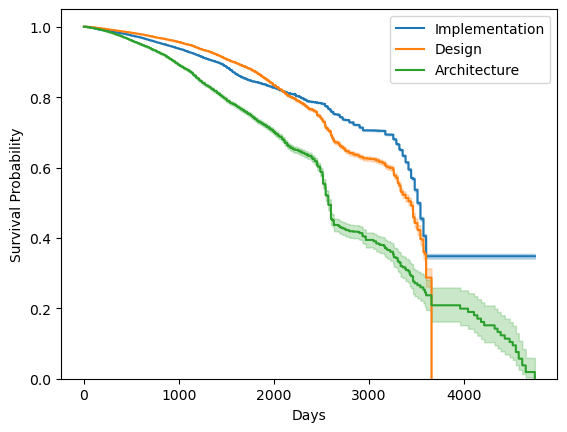

In [4]:
import pandas as pd
from lifelines import KaplanMeierFitter
from lifelines.statistics import multivariate_logrank_test, logrank_test
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

imp_agg['start'] = pd.to_datetime(imp_agg['start'], utc=True)
imp_agg['end'] = pd.to_datetime(imp_agg['end'], utc=True)

imp_agg['time_diff'] = imp_agg['end'] - imp_agg['start']
imp_agg['days'] = abs(imp_agg['time_diff'].dt.days)


des_agg['start'] = pd.to_datetime(des_agg['start'], utc=True)
des_agg['end'] = pd.to_datetime(des_agg['end'], utc=True)

des_agg['time_diff'] = des_agg['end'] - des_agg['start']
des_agg['days'] = abs(des_agg['time_diff'].dt.days)


arch_agg['start'] = pd.to_datetime(arch_agg['start'], utc=True)
arch_agg['end'] = pd.to_datetime(arch_agg['end'], utc=True)

arch_agg['time_diff'] = arch_agg['end'] - arch_agg['start']
arch_agg['days'] = abs(arch_agg['time_diff'].dt.days)

imp_agg.loc[:, 'removed'] = pd.to_numeric(imp_agg['removed'])
des_agg.loc[:, 'removed'] = pd.to_numeric(des_agg['removed'])
arch_agg.loc[:, 'removed'] = pd.to_numeric(arch_agg['removed'])

imp_agg['group'] = 'imp'
des_agg['group'] = 'des'
arch_agg['group'] = 'arch'

tot_agg = pd.concat([imp_agg, des_agg, arch_agg])



# Initialize the KaplanMeierFitter
kmf_imp = KaplanMeierFitter()
kmf_des = KaplanMeierFitter()
kmf_arch = KaplanMeierFitter()

# Fit the data into the model
kmf_imp.fit(durations=imp_agg['days'], event_observed=imp_agg['removed'], label='Implementation')
kmf_des.fit(durations=des_agg['days'], event_observed=des_agg['removed'], label='Design')
kmf_arch.fit(durations=arch_agg['days'], event_observed=arch_agg['removed'], label='Architecture')

# Plot the Kaplan-Meier estimate

kmf_imp.plot_survival_function()
kmf_des.plot_survival_function()
kmf_arch.plot_survival_function()

# Perform the log-rank test
results = multivariate_logrank_test(tot_agg['days'], tot_agg['group'], tot_agg['removed'])
results.print_summary()

results_AB = logrank_test(imp_agg['days'], des_agg['days'], event_observed_A=imp_agg['removed'], event_observed_B=des_agg['removed'])
print("Group A vs Group B:")
results_AB.print_summary()

# Group A vs Group C
results_AC = logrank_test(imp_agg['days'], arch_agg['days'], event_observed_A=imp_agg['removed'], event_observed_B=arch_agg['removed'])
print("\nGroup A vs Group C:")
results_AC.print_summary()

# Group B vs Group C
results_BC = logrank_test(des_agg['days'], arch_agg['days'], event_observed_A=des_agg['removed'], event_observed_B=arch_agg['removed'])
print("\nGroup B vs Group C:")
results_BC.print_summary()

plt.xlabel('Days')
plt.ylabel('Survival Probability')
plt.ylim([0,1.05])

plt.show()


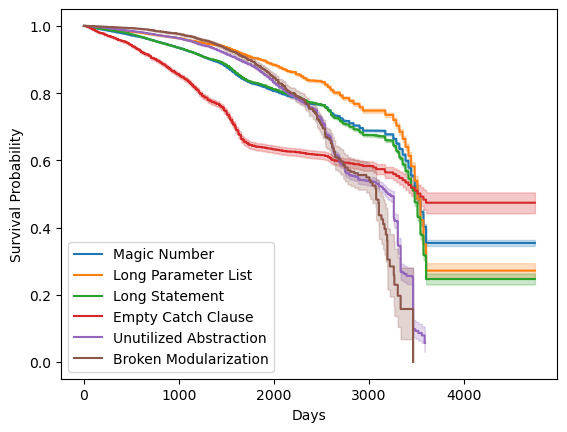

In [5]:
import pandas as pd
from lifelines import KaplanMeierFitter
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

imp_agg = pd.read_csv('imp-agg.csv')

des_agg = pd.read_csv('des-agg.csv')

arch_agg = pd.read_csv('arch-agg.csv')

imp_agg['start'] = pd.to_datetime(imp_agg['start'], utc=True)
imp_agg['end'] = pd.to_datetime(imp_agg['end'], utc=True)

imp_agg['time_diff'] = imp_agg['end'] - imp_agg['start']
imp_agg['days'] = abs(imp_agg['time_diff'].dt.days)

# imp_agg = imp_agg[imp_agg['days'] > 0]

magic = imp_agg[imp_agg['Smell'] == 'Magic Number']
long_param = imp_agg[imp_agg['Smell'] == 'Long Parameter List']
long_stat = imp_agg[imp_agg['Smell'] == 'Long Statement']
catch = imp_agg[imp_agg['Smell'] == 'Empty catch clause']

des_agg['start'] = pd.to_datetime(des_agg['start'], utc=True)
des_agg['end'] = pd.to_datetime(des_agg['end'], utc=True)

des_agg['time_diff'] = des_agg['end'] - des_agg['start']
des_agg['days'] = des_agg['time_diff'].dt.days

des_agg = des_agg[des_agg['days'] > 0]

un_abs = des_agg[des_agg['Smell'] == 'Unutilized Abstraction']
br_mod = des_agg[des_agg['Smell'] == 'Broken Modularization']


arch_agg['start'] = pd.to_datetime(arch_agg['start'], utc=True)
arch_agg['end'] = pd.to_datetime(arch_agg['end'], utc=True)

arch_agg['time_diff'] = arch_agg['end'] - arch_agg['start']
arch_agg['days'] = abs(arch_agg['time_diff'].dt.days)


arch_agg = arch_agg[arch_agg['days'] > 0]

# Initialize the KaplanMeierFitter
kmf_magic = KaplanMeierFitter()
kmf_longp = KaplanMeierFitter()
kmf_longs = KaplanMeierFitter()
kmf_catch = KaplanMeierFitter()

kmf_unabs = KaplanMeierFitter()
kmf_brmod = KaplanMeierFitter()

# Fit the data into the model
kmf_magic.fit(durations=magic['days'], event_observed=magic['removed'], label='Magic Number')
kmf_longp.fit(durations=long_param['days'], event_observed=long_param['removed'], label='Long Parameter List')
kmf_longs.fit(durations=long_stat['days'], event_observed=long_stat['removed'], label='Long Statement')
kmf_catch.fit(durations=catch['days'], event_observed=catch['removed'], label='Empty Catch Clause')

kmf_unabs.fit(durations=un_abs['days'], event_observed=un_abs['removed'], label='Unutilized Abstraction')
kmf_brmod.fit(durations=br_mod['days'], event_observed=br_mod['removed'], label='Broken Modularization')

# Plot the Kaplan-Meier estimate

kmf_magic.plot_survival_function()
kmf_longp.plot_survival_function()
kmf_longs.plot_survival_function()
kmf_catch.plot_survival_function()

kmf_unabs.plot_survival_function()
kmf_brmod.plot_survival_function()

plt.xlabel('Days')
plt.ylabel('Survival Probability')
# plt.ylim([0,1.05])

plt.show()


In [125]:
from datetime import datetime
import pandas as pd
import os
import random


repos_path = os.path.join('data', 'repos', 'traditional')
analyzed_repos_path = os.path.join('data', 'analyzed_repos', 'traditional')
all_analyzed_commits_path = os.path.join('data', 'analyzed_repos_commits_traditional')
dj_file_path = os.path.join('apps', 'DJ', 'DesigniteJava.jar')

imp_agg = pd.DataFrame(columns=['Project','Package', 'Type','Method', 'Smell', 'start', 'end', 'removed'])
des_agg = pd.DataFrame(columns=['Project','Package', 'Type', 'Smell', 'start', 'end', 'removed'])
arch_agg = pd.DataFrame(columns=['Project', 'Package', 'Smell', 'start', 'end', 'removed'])

trad_list = os.listdir(all_analyzed_commits_path)
trad_list = random.sample(trad_list, 155)
print(trad_list)

for folder in trad_list:
    print("Analyzing ", folder)
    folder_path = os.path.join(all_analyzed_commits_path, folder)

    res_path = os.path.join(folder_path, "commits.csv")
    
#     continue
    df = pd.read_csv(res_path)
    df = df.sort_values('date', ascending=False)
    df_commits = df['commit'].tolist()
    
    analyzed_repo_commits_path = os.path.join(all_analyzed_commits_path, folder)
    
    commit_folders = os.listdir(analyzed_repo_commits_path)
    
    commit_folders = [item for item in commit_folders if folder in item]
    commit_folders = sorted(commit_folders, key=extract_number, reverse=True)
    
    if len(commit_folders) < 4:
        print("Not enough commits")
        continue
        
    sub_imp_agg = pd.DataFrame(columns=['Project','Package', 'Type','Method', 'Smell', 'start', 'end', 'removed'])
    sub_des_agg = pd.DataFrame(columns=['Project','Package', 'Type', 'Smell', 'start', 'end', 'removed'])
    sub_arch_agg = pd.DataFrame(columns=['Project', 'Package', 'Smell', 'start', 'end', 'removed'])
    for analyzed_commit in commit_folders:
        print("Analyzing commit ", analyzed_commit)
        
        analyzed_commits_path = os.path.join(analyzed_repo_commits_path, analyzed_commit)
        metrics_path = os.path.join(analyzed_commits_path, 'MethodMetrics.csv')
        implementaion_path = os.path.join(analyzed_commits_path, 'ImplementationSmells.csv')
        design_path = os.path.join(analyzed_commits_path, 'DesignSmells.csv')
        arch_path = os.path.join(analyzed_commits_path, 'ArchitectureSmells.csv')
        
        time_file = os.path.join(analyzed_commits_path, 'commit_date.txt')
        
        if os.path.exists(metrics_path):
            
            time = datetime.now()
            with open(time_file, 'r') as time:
                time = datetime.strptime(time.read(), "%Y-%m-%d %H:%M:%S%z")
            
            
            #Implementaion             
            implementation = pd.read_csv(implementaion_path, on_bad_lines='warn')
#             implementation = implementation.drop_duplicates()
            
            implementation = implementation.rename(columns={
            'Project Name': 'Project',
            'Package Name': 'Package',
            'Type Name': 'Type',
            'Method Name': 'Method',
            'Implementation Smell': 'Smell'
            })
               
            merged = pd.merge(implementation, sub_imp_agg, on=['Project', 'Package','Type','Method', 'Smell'], how='outer', indicator=True)
            
            new_rows =  merged[(merged['_merge'] == 'left_only')]
            new_rows.loc[:, 'start'] = time
            new_rows.loc[:, 'end'] = time
            new_rows.loc[:, 'removed'] = 0
            
            if sub_imp_agg.empty:
                sub_imp_agg = new_rows.copy()
            elif not new_rows.empty:
                sub_imp_agg = pd.concat([sub_imp_agg, new_rows])
            
            common_rows = merged[merged['_merge'] == 'both']
            common_df = sub_imp_agg[sub_imp_agg.index.isin(common_rows.index)]
            
            common_df_removed = common_df[common_df['removed'] == 1]
            common_df_removed.loc[:, 'removed'] = 0
            common_df_removed.loc[:, 'start'] = time
            common_df_removed.loc[:, 'end'] = time
            
            if not common_df_removed.empty:
                sub_imp_agg = pd.concat([sub_imp_agg, common_df_removed])
            
            common_df_not_removed = common_df[common_df['removed'] == 0]
            if not common_df_not_removed.empty:
                sub_imp_agg.loc[sub_imp_agg.index.isin(common_df_not_removed.index), 'end'] = time

#             if not common_rows.empty:
#                 sub_imp_agg.loc[sub_imp_agg.index.isin(common_rows.index), 'end'] = time
#                 sub_imp_agg.loc[sub_imp_agg.index.isin(common_rows.index), 'removed'] = 0

            
            removed_rows =  merged[(merged['_merge'] == 'right_only')]
            if not removed_rows.empty:
                sub_imp_agg.loc[sub_imp_agg.index.isin(removed_rows.index), 'removed'] = 1
                sub_imp_agg.loc[sub_imp_agg.index.isin(removed_rows.index), 'end'] = time

            cols_to_drop = set(sub_imp_agg.columns) - set(['Project','Package', 'Smell','Type','Method', 'start', 'end', 'removed'])
            sub_imp_agg = sub_imp_agg.drop(cols_to_drop, axis=1)
            
            #Design             
            design = pd.read_csv(design_path, on_bad_lines='warn')
#             design = design.drop_duplicates()
            
            design = design.rename(columns={
            'Project Name': 'Project',
            'Package Name': 'Package',
            'Type Name': 'Type',
            'Design Smell': 'Smell'
            })
            
            
            merged = pd.merge(design, sub_des_agg, on=['Project', 'Package','Type', 'Smell'], how='outer', indicator=True)
            
            new_rows =  merged[(merged['_merge'] == 'left_only')]
            new_rows.loc[:, 'start'] = time
            new_rows.loc[:, 'end'] = time
            new_rows.loc[:, 'removed'] = 0
            
            if sub_des_agg.empty:
                sub_des_agg = new_rows.copy()
            elif not new_rows.empty:
                sub_des_agg = pd.concat([sub_des_agg, new_rows])
            
            common_rows = merged[merged['_merge'] == 'both']
            common_df = sub_des_agg[sub_des_agg.index.isin(common_rows.index)]
            
            common_df_removed = common_df[common_df['removed'] == 1]
            common_df_removed.loc[:, 'removed'] = 0
            common_df_removed.loc[:, 'start'] = time
            common_df_removed.loc[:, 'end'] = time
            
            if not common_df_removed.empty:
                sub_des_agg = pd.concat([sub_des_agg, common_df_removed])
            
            common_df_not_removed = common_df[common_df['removed'] == 0]
            if not common_df_removed.empty:
                sub_des_agg.loc[sub_des_agg.index.isin(common_df_not_removed.index), 'end'] = time
                
#             if not common_rows.empty:
#                 sub_des_agg.loc[sub_des_agg.index.isin(common_rows.index), 'end'] = time
#                 sub_des_agg.loc[sub_des_agg.index.isin(common_rows.index), 'removed'] = 0

            
            removed_rows =  merged[(merged['_merge'] == 'right_only')]
            
            if not removed_rows.empty:
                sub_des_agg.loc[sub_des_agg.index.isin(removed_rows.index), 'removed'] = 1
                sub_des_agg.loc[sub_des_agg.index.isin(removed_rows.index), 'end'] = time

            cols_to_drop = set(sub_des_agg.columns) - set(['Project','Package','Type', 'Smell', 'start', 'end', 'removed'])
            sub_des_agg = sub_des_agg.drop(cols_to_drop, axis=1)
            
            #Architecture             
            architecure = pd.read_csv(arch_path, on_bad_lines='warn')
#             architecture = architecture.drop_duplicates()
            
            architecure = architecure.rename(columns={
            'Project Name': 'Project',
            'Package Name': 'Package',
            'Architecture Smell': 'Smell'
            })
            
            
            merged = pd.merge(architecure, sub_arch_agg, on=['Project', 'Package', 'Smell'], how='outer', indicator=True)

            new_rows =  merged[(merged['_merge'] == 'left_only')]
            new_rows.loc[:, 'start'] = time
            new_rows.loc[:, 'end'] = time
            new_rows.loc[:, 'removed'] = 0
            
            if sub_arch_agg.empty:
                sub_arch_agg = new_rows.copy()
            elif not new_rows.empty:
                sub_arch_agg = pd.concat([sub_arch_agg, new_rows])
            
            common_rows = merged[merged['_merge'] == 'both']
            common_df = sub_arch_agg[sub_arch_agg.index.isin(common_rows.index)]
            
            common_df_removed = common_df[common_df['removed'] == 1]
            common_df_removed.loc[:, 'removed'] = 0
            common_df_removed.loc[:, 'start'] = time
            common_df_removed.loc[:, 'end'] = time
            
            if not common_df_removed.empty:
                sub_arch_agg = pd.concat([sub_arch_agg, common_df_removed])
            
            common_df_not_removed = common_df[common_df['removed'] == 0]
            if not common_df_removed.empty:
                sub_arch_agg.loc[sub_arch_agg.index.isin(common_df_not_removed.index), 'end'] = time
                
#             if not common_rows.empty:
#                 sub_arch_agg.loc[sub_arch_agg.index.isin(common_rows.index), 'removed'] = 0
#                 sub_arch_agg.loc[sub_arch_agg.index.isin(common_rows.index), 'end'] = time
            
            cols_to_drop = set(sub_arch_agg.columns) - set(['Project','Package', 'Smell', 'start', 'end', 'removed'])
            sub_arch_agg = sub_arch_agg.drop(cols_to_drop, axis=1)
            
            removed_rows =  merged[(merged['_merge'] == 'right_only')]
            if not removed_rows.empty:
                sub_arch_agg.loc[sub_arch_agg.index.isin(removed_rows.index), 'removed'] = 1
                sub_arch_agg.loc[sub_arch_agg.index.isin(removed_rows.index), 'end'] = time
        
        
            sub_imp_agg = sub_imp_agg.drop_duplicates()
            sub_des_agg = sub_des_agg.drop_duplicates()
            sub_arch_agg = sub_arch_agg.drop_duplicates()
        
        imp_agg = pd.concat([imp_agg, sub_imp_agg])
        des_agg = pd.concat([des_agg, sub_des_agg])
        arch_agg = pd.concat([arch_agg, sub_arch_agg])


['VideoStreamingApplication', 'Android-WebMonkey', 'justtestlah', 'Aki', 'MultiMachineBuilder', 'quarkus-quinoa', 'EasyCaptcha', 'java-web-exercises', 'webp-io', 'analytics-webview', 'imagetracerjava', 'flow-crm-tutorial', 'MIDI-Automator', 'Web-API', 'browser', 'agile-gdx', 'SpaceFX', 'electron-react-spring', 'gs-actuator-service', 'stapler', 'gs-rest-hateoas', 'stable_diffusion_sketch', 'SilenceEngine', 'MarkdownEditorControlFX', 'gogs-webhook-plugin', 'paimon-webui', 'cloud-portal', 'fsbrowser', 'cc-webgraph', 'bambu-farm', 'validator-web', 'jentunnel', 'jap', 'javafxwebview', 'x5webview-cordova-plugin', 'Javafx-WebView-Debugger', 'selcukes-java', 'OpenChess', 'browserup-proxy', 'simplewebserver', 'Project-Lava', 'spring-redis-websocket', 'desktoppanefx', 'Runescape-Web-Walker-Engine', 'gwt-polymer-elements', 'magic-starter', 'TouchMapperLauncher', 'LoboBrowser', 'ClientSPV', 'mysticpaste', 'WebVector', 'PlaylistsForNewPipe', 'elfinder-2.x-servlet', 'Dayon', 'vzome', 'elucidate-serv

Skipping line 7: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skippin

Analyzing commit  Android-WebMonkey3
Analyzing commit  Android-WebMonkey2
Analyzing commit  Android-WebMonkey1
Analyzing commit  Android-WebMonkey0
Analyzing  justtestlah
Analyzing commit  justtestlah31


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  justtestlah30
Analyzing commit  justtestlah29
Analyzing commit  justtestlah28


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping lin

Analyzing commit  justtestlah27
Analyzing commit  justtestlah26
Analyzing commit  justtestlah25
Analyzing commit  justtestlah24
Analyzing commit  justtestlah23


Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6

Skipping li

Analyzing commit  justtestlah22
Analyzing commit  justtestlah21
Analyzing commit  justtestlah20


Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping l

Analyzing commit  justtestlah19
Analyzing commit  justtestlah18
Analyzing commit  justtestlah17
Analyzing commit  justtestlah16


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping li

Analyzing commit  justtestlah15
Analyzing commit  justtestlah14
Analyzing commit  justtestlah13
Analyzing commit  justtestlah12
Analyzing commit  justtestlah11


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping li

Analyzing commit  justtestlah10
Analyzing commit  justtestlah9
Analyzing commit  justtestlah8
Analyzing commit  justtestlah7
Analyzing commit  justtestlah6
Analyzing commit  justtestlah5
Analyzing commit  justtestlah4


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping lin

Analyzing commit  justtestlah3
Analyzing commit  justtestlah2
Analyzing commit  justtestlah1
Analyzing commit  justtestlah0
Analyzing  Aki
Analyzing commit  Aki6


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping lin

Analyzing commit  Aki5
Analyzing commit  Aki4
Analyzing commit  Aki3
Analyzing commit  Aki2
Analyzing commit  Aki1
Analyzing commit  Aki0


Skipping line 11: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6



Analyzing  MultiMachineBuilder
Analyzing commit  MultiMachineBuilder19


Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping

Analyzing commit  MultiMachineBuilder18
Analyzing commit  MultiMachineBuilder17


Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Ski

Analyzing commit  MultiMachineBuilder16
Analyzing commit  MultiMachineBuilder15


Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 225: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 231: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6

Analyzing commit  MultiMachineBuilder14
Analyzing commit  MultiMachineBuilder13


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6


Analyzing commit  MultiMachineBuilder12
Analyzing commit  MultiMachineBuilder11
Analyzing commit  MultiMachineBuilder10


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6


Analyzing commit  MultiMachineBuilder9
Analyzing commit  MultiMachineBuilder8


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6


Analyzing commit  MultiMachineBuilder7
Analyzing commit  MultiMachineBuilder6


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6


Analyzing commit  MultiMachineBuilder5
Analyzing commit  MultiMachineBuilder4


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6


Analyzing commit  MultiMachineBuilder3
Analyzing commit  MultiMachineBuilder2


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6


Analyzing commit  MultiMachineBuilder1
Analyzing commit  MultiMachineBuilder0


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6


Analyzing  quarkus-quinoa
Analyzing commit  quarkus-quinoa24
Analyzing commit  quarkus-quinoa23


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  quarkus-quinoa22
Analyzing commit  quarkus-quinoa21
Analyzing commit  quarkus-quinoa20
Analyzing commit  quarkus-quinoa19
Analyzing commit  quarkus-quinoa18
Analyzing commit  quarkus-quinoa17
Analyzing commit  quarkus-quinoa16
Analyzing commit  quarkus-quinoa15
Analyzing commit  quarkus-quinoa14
Analyzing commit  quarkus-quinoa13
Analyzing commit  quarkus-quinoa12
Analyzing commit  quarkus-quinoa11
Analyzing commit  quarkus-quinoa10
Analyzing commit  quarkus-quinoa9
Analyzing commit  quarkus-quinoa8
Analyzing commit  quarkus-quinoa7


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6

Skipping li

Analyzing commit  quarkus-quinoa6
Analyzing commit  quarkus-quinoa5
Analyzing commit  quarkus-quinoa4
Analyzing commit  quarkus-quinoa3
Analyzing commit  quarkus-quinoa2


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6

Skipping li

Analyzing commit  quarkus-quinoa1
Analyzing commit  quarkus-quinoa0
Analyzing  EasyCaptcha
Analyzing commit  EasyCaptcha9
Analyzing commit  EasyCaptcha8
Analyzing commit  EasyCaptcha7
Analyzing commit  EasyCaptcha6
Analyzing commit  EasyCaptcha5
Analyzing commit  EasyCaptcha4
Analyzing commit  EasyCaptcha3
Analyzing commit  EasyCaptcha2
Analyzing commit  EasyCaptcha1
Analyzing commit  EasyCaptcha0
Analyzing  java-web-exercises
Analyzing commit  java-web-exercises12
Analyzing commit  java-web-exercises11


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing commit  java-web-exercises10
Analyzing commit  java-web-exercises9
Analyzing commit  java-web-exercises8


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping lin

Analyzing commit  java-web-exercises7
Analyzing commit  java-web-exercises6
Analyzing commit  java-web-exercises5
Analyzing commit  java-web-exercises4
Analyzing commit  java-web-exercises3
Analyzing commit  java-web-exercises2


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping lin

Analyzing commit  java-web-exercises1
Analyzing commit  java-web-exercises0
Analyzing  webp-io
Analyzing commit  webp-io8


Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping lin

Analyzing commit  webp-io7
Analyzing commit  webp-io6
Analyzing commit  webp-io5
Analyzing commit  webp-io4
Analyzing commit  webp-io3
Analyzing commit  webp-io2
Analyzing commit  webp-io1
Analyzing commit  webp-io0


Skipping line 3: expected 5 fields, saw 6



Analyzing  analytics-webview
Analyzing commit  analytics-webview3
Analyzing commit  analytics-webview2
Analyzing commit  analytics-webview1
Analyzing commit  analytics-webview0
Analyzing  imagetracerjava
Analyzing commit  imagetracerjava7


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  imagetracerjava6
Analyzing commit  imagetracerjava5
Analyzing commit  imagetracerjava4


Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  imagetracerjava3
Analyzing commit  imagetracerjava2
Analyzing commit  imagetracerjava1


Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  imagetracerjava0
Analyzing  flow-crm-tutorial
Analyzing commit  flow-crm-tutorial31
Analyzing commit  flow-crm-tutorial30
Analyzing commit  flow-crm-tutorial29
Analyzing commit  flow-crm-tutorial28
Analyzing commit  flow-crm-tutorial27
Analyzing commit  flow-crm-tutorial26
Analyzing commit  flow-crm-tutorial25
Analyzing commit  flow-crm-tutorial24


Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  flow-crm-tutorial23
Analyzing commit  flow-crm-tutorial22
Analyzing commit  flow-crm-tutorial21
Analyzing commit  flow-crm-tutorial20
Analyzing commit  flow-crm-tutorial19
Analyzing commit  flow-crm-tutorial18


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skippi

Analyzing commit  flow-crm-tutorial17
Analyzing commit  flow-crm-tutorial16
Analyzing commit  flow-crm-tutorial15
Analyzing commit  flow-crm-tutorial14
Analyzing commit  flow-crm-tutorial13
Analyzing commit  flow-crm-tutorial12
Analyzing commit  flow-crm-tutorial11
Analyzing commit  flow-crm-tutorial10


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  flow-crm-tutorial9
Analyzing commit  flow-crm-tutorial8
Analyzing commit  flow-crm-tutorial7
Analyzing commit  flow-crm-tutorial6
Analyzing commit  flow-crm-tutorial5


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skippi

Analyzing commit  flow-crm-tutorial4
Analyzing commit  flow-crm-tutorial3
Analyzing commit  flow-crm-tutorial2
Analyzing commit  flow-crm-tutorial1
Analyzing commit  flow-crm-tutorial0


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping l

Analyzing  MIDI-Automator
Analyzing commit  MIDI-Automator18
Analyzing commit  MIDI-Automator17
Analyzing commit  MIDI-Automator16


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping li

Analyzing commit  MIDI-Automator15
Analyzing commit  MIDI-Automator14


Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping li

Analyzing commit  MIDI-Automator13
Analyzing commit  MIDI-Automator12
Analyzing commit  MIDI-Automator11
Analyzing commit  MIDI-Automator10
Analyzing commit  MIDI-Automator9
Analyzing commit  MIDI-Automator8
Analyzing commit  MIDI-Automator7
Analyzing commit  MIDI-Automator6
Analyzing commit  MIDI-Automator5
Analyzing commit  MIDI-Automator4
Analyzing commit  MIDI-Automator3
Analyzing commit  MIDI-Automator2
Analyzing commit  MIDI-Automator1


Skipping line 50: expected 4 fields, saw 5

Skipping line 50: expected 4 fields, saw 5



Analyzing commit  MIDI-Automator0
Analyzing  Web-API
Analyzing commit  Web-API23


Skipping line 50: expected 4 fields, saw 5

Skipping line 21: expected 5 fields, saw 6



Analyzing commit  Web-API22
Analyzing commit  Web-API21
Analyzing commit  Web-API20


Skipping line 24: expected 5 fields, saw 6

Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6



Analyzing commit  Web-API19
Analyzing commit  Web-API18
Analyzing commit  Web-API17


Skipping line 5: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6

Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6

Skipping line 36: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6



Analyzing commit  Web-API16
Analyzing commit  Web-API15
Analyzing commit  Web-API14


Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6

Skipping line 36: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6

Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 field

Analyzing commit  Web-API13
Analyzing commit  Web-API12
Analyzing commit  Web-API11


Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 383: expected 5 fields, saw 6
Skipping line 385: expected 5 fields, saw 6
Skipping line 399: expected 5 fields, saw 6
Skipping line 401: expected 5 fields, saw 6
Skipping line 403: expected 5 fields, saw 6

Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 356: expected 5 fields, saw 6
Skipping line 360: expected 5 fields, saw 6
Skipping line 364: expected 5 fields, saw 6
Skipping line 368: expected 5 fields, saw 6
Skipping line 374: expected 5 fields, saw 6
Skipping line 389: expected 5 fields, saw 6
Skipping line 394: expected 5 fields, saw 6
Skipping line 396: expected 5 fields, saw 6
Skipping line 399: expected 5 fields, saw 6
Skipping line 411: expected 5 fields, saw 6
Skipping line 419: expected 5 fields, saw 6
Skipping line 421: expected 5 fields, saw 6
Skipping line 438: expected 5 fields

Analyzing commit  Web-API10
Analyzing commit  Web-API9
Analyzing commit  Web-API8


Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 272: expected 5 fields, saw 6
Skipping line 356: expected 5 fields, saw 6
Skipping line 360: expected 5 fields, saw 6
Skipping line 364: expected 5 fields, saw 6
Skipping line 368: expected 5 fields, saw 6
Skipping line 374: expected 5 fields, saw 6
Skipping line 389: expected 5 fields, saw 6
Skipping line 394: expected 5 fields, saw 6
Skipping line 396: expected 5 fields, saw 6
Skipping line 399: expected 5 fields, saw 6
Skipping line 411: expected 5 fields, saw 6
Skipping line 419: expected 5 fields, saw 6
Skipping line 421: expected 5 fields, saw 6
Skipping line 438: expected 5 fields, saw 6
Skipping line 440: expected 5 fields, saw 6
Skipping line 442: expected 5 fields, saw 6
Skipping line 448: expected 5 fields, saw 6
Skipping line 450: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, 

Analyzing commit  Web-API7
Analyzing commit  Web-API6
Analyzing commit  Web-API5
Analyzing commit  Web-API4


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 356: expected 5 fields, saw 6
Skipping line 441: expected 5 fields, saw 6
Skipping line 445: expected 5 fields, saw 6
Skipping line 448: expected 5 fields, saw 6
Skipp

Analyzing commit  Web-API3
Analyzing commit  Web-API2
Analyzing commit  Web-API1
Analyzing commit  Web-API0


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 354: expected 5 fields, saw 6
Skipping line 439: expected 5 fields, saw 6
Skipping line 443: expected 5 fields, saw 6
Skipping line 446: expected 5 fields, saw 6
Skipp

Analyzing  browser
Analyzing commit  browser60
Analyzing commit  browser59
Analyzing commit  browser58


Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6



Analyzing commit  browser57
Analyzing commit  browser56


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 

Analyzing commit  browser55
Analyzing commit  browser54
Analyzing commit  browser53
Analyzing commit  browser52


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6

Skipping line

Analyzing commit  browser51
Analyzing commit  browser50
Analyzing commit  browser49


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29

Analyzing commit  browser48
Analyzing commit  browser47
Analyzing commit  browser46
Analyzing commit  browser45


Skipping line 4: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping lin

Analyzing commit  browser44
Analyzing commit  browser43
Analyzing commit  browser42
Analyzing commit  browser41


Skipping line 4: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping lin

Analyzing commit  browser40
Analyzing commit  browser39
Analyzing commit  browser38
Analyzing commit  browser37


Skipping line 4: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping lin

Analyzing commit  browser36
Analyzing commit  browser35
Analyzing commit  browser34
Analyzing commit  browser33


Skipping line 4: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping lin

Analyzing commit  browser32
Analyzing commit  browser31
Analyzing commit  browser30


Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping lin

Analyzing commit  browser29
Analyzing commit  browser28
Analyzing commit  browser27


Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping lin

Analyzing commit  browser26
Analyzing commit  browser25
Analyzing commit  browser24


Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping lin

Analyzing commit  browser23
Analyzing commit  browser22
Analyzing commit  browser21


Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  browser20
Analyzing commit  browser19
Analyzing commit  browser18


Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping lin

Analyzing commit  browser17
Analyzing commit  browser16
Analyzing commit  browser15


Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6



Analyzing commit  browser14
Analyzing commit  browser13
Analyzing commit  browser12
Analyzing commit  browser11
Analyzing commit  browser10
Analyzing commit  browser9
Analyzing commit  browser8
Analyzing commit  browser7


Skipping line 5: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6



Analyzing commit  browser6
Analyzing commit  browser5


Skipping line 5: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6



Analyzing commit  browser4
Analyzing commit  browser3
Analyzing commit  browser2


Skipping line 6: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping lin

Analyzing commit  browser1
Analyzing commit  browser0
Analyzing  agile-gdx
Analyzing commit  agile-gdx5


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping

Analyzing commit  agile-gdx4
Analyzing commit  agile-gdx3
Analyzing commit  agile-gdx2
Analyzing commit  agile-gdx1


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Sk

Analyzing commit  agile-gdx0
Analyzing  SpaceFX
Analyzing commit  SpaceFX12


Skipping line 21: expected 5 fields, saw 6

Skipping line 40: expected 5 fields, saw 6

Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6



Analyzing commit  SpaceFX11
Analyzing commit  SpaceFX10
Analyzing commit  SpaceFX9


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping lin

Analyzing commit  SpaceFX8
Analyzing commit  SpaceFX7


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping lin

Analyzing commit  SpaceFX6
Analyzing commit  SpaceFX5


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping lin

Analyzing commit  SpaceFX4
Analyzing commit  SpaceFX3


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping lin

Analyzing commit  SpaceFX2
Analyzing commit  SpaceFX1


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping lin

Analyzing commit  SpaceFX0
Analyzing  electron-react-spring
Analyzing commit  electron-react-spring9
Analyzing commit  electron-react-spring8
Analyzing commit  electron-react-spring7
Analyzing commit  electron-react-spring6
Analyzing commit  electron-react-spring5


Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  electron-react-spring4
Analyzing commit  electron-react-spring3
Analyzing commit  electron-react-spring2
Analyzing commit  electron-react-spring1
Analyzing commit  electron-react-spring0
Analyzing  gs-actuator-service
Analyzing commit  gs-actuator-service67
Analyzing commit  gs-actuator-service66


Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6



Analyzing commit  gs-actuator-service65
Analyzing commit  gs-actuator-service64
Analyzing commit  gs-actuator-service63
Analyzing commit  gs-actuator-service62


Skipping line 4: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6



Analyzing commit  gs-actuator-service61
Analyzing commit  gs-actuator-service60
Analyzing commit  gs-actuator-service59
Analyzing commit  gs-actuator-service58
Analyzing commit  gs-actuator-service57
Analyzing commit  gs-actuator-service56
Analyzing commit  gs-actuator-service55
Analyzing commit  gs-actuator-service54
Analyzing commit  gs-actuator-service53
Analyzing commit  gs-actuator-service52
Analyzing commit  gs-actuator-service51
Analyzing commit  gs-actuator-service50
Analyzing commit  gs-actuator-service49
Analyzing commit  gs-actuator-service48
Analyzing commit  gs-actuator-service47
Analyzing commit  gs-actuator-service46
Analyzing commit  gs-actuator-service45
Analyzing commit  gs-actuator-service44
Analyzing commit  gs-actuator-service43
Analyzing commit  gs-actuator-service42
Analyzing commit  gs-actuator-service41
Analyzing commit  gs-actuator-service40
Analyzing commit  gs-actuator-service39
Analyzing commit  gs-actuator-service38
Analyzing commit  gs-actuator-service37


Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Ski

Analyzing commit  stapler136
Analyzing commit  stapler135


Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skip

Analyzing commit  stapler134
Analyzing commit  stapler133
Analyzing commit  stapler132
Analyzing commit  stapler131


Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skip

Analyzing commit  stapler130
Analyzing commit  stapler129
Analyzing commit  stapler128


Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Ski

Analyzing commit  stapler127
Analyzing commit  stapler126
Analyzing commit  stapler125


Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Ski

Analyzing commit  stapler124
Analyzing commit  stapler123
Analyzing commit  stapler122


Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler121
Analyzing commit  stapler120
Analyzing commit  stapler119


Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skippin

Analyzing commit  stapler118
Analyzing commit  stapler117


Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skippin

Analyzing commit  stapler116
Analyzing commit  stapler115
Analyzing commit  stapler114


Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler113
Analyzing commit  stapler112


Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler111
Analyzing commit  stapler110


Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler109
Analyzing commit  stapler108


Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler107
Analyzing commit  stapler106
Analyzing commit  stapler105


Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler104
Analyzing commit  stapler103


Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler102
Analyzing commit  stapler101


Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler100
Analyzing commit  stapler99


Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler98
Analyzing commit  stapler97


Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler96
Analyzing commit  stapler95


Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipp

Analyzing commit  stapler94
Analyzing commit  stapler93


Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipp

Analyzing commit  stapler92
Analyzing commit  stapler91
Analyzing commit  stapler90
Analyzing commit  stapler89


Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipp

Analyzing commit  stapler88
Analyzing commit  stapler87
Analyzing commit  stapler86


Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipp

Analyzing commit  stapler85
Analyzing commit  stapler84


Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipp

Analyzing commit  stapler83
Analyzing commit  stapler82
Analyzing commit  stapler81


Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipp

Analyzing commit  stapler80
Analyzing commit  stapler79


Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipp

Analyzing commit  stapler78
Analyzing commit  stapler77
Analyzing commit  stapler76


Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skip

Analyzing commit  stapler75
Analyzing commit  stapler74
Analyzing commit  stapler73


Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skip

Analyzing commit  stapler72
Analyzing commit  stapler71
Analyzing commit  stapler70


Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skip

Analyzing commit  stapler69
Analyzing commit  stapler68


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler67
Analyzing commit  stapler66


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler65
Analyzing commit  stapler64


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skippi

Analyzing commit  stapler63
Analyzing commit  stapler62


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skippin

Analyzing commit  stapler61
Analyzing commit  stapler60


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skippin

Analyzing commit  stapler59
Analyzing commit  stapler58


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skippin

Analyzing commit  stapler57
Analyzing commit  stapler56


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skippin

Analyzing commit  stapler55
Analyzing commit  stapler54


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skippin

Analyzing commit  stapler53
Analyzing commit  stapler52
Analyzing commit  stapler51


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skippin

Analyzing commit  stapler50
Analyzing commit  stapler49


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler48
Analyzing commit  stapler47


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler46
Analyzing commit  stapler45


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler44
Analyzing commit  stapler43


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler42
Analyzing commit  stapler41
Analyzing commit  stapler40


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler39
Analyzing commit  stapler38


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler37
Analyzing commit  stapler36


Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler35
Analyzing commit  stapler34
Analyzing commit  stapler33


Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping

Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler32
Analyzing commit  stapler31


Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler30
Analyzing commit  stapler29
Analyzing commit  stapler28


Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler27
Analyzing commit  stapler26


Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping 

Analyzing commit  stapler25
Analyzing commit  stapler24
Analyzing commit  stapler23


Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping 

Analyzing commit  stapler22
Analyzing commit  stapler21
Analyzing commit  stapler20


Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping 

Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping 

Analyzing commit  stapler19
Analyzing commit  stapler18


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler17
Analyzing commit  stapler16


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler15
Analyzing commit  stapler14


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler13
Analyzing commit  stapler12


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler11
Analyzing commit  stapler10


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler9
Analyzing commit  stapler8
Analyzing commit  stapler7


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler6
Analyzing commit  stapler5


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler4
Analyzing commit  stapler3
Analyzing commit  stapler2
Analyzing commit  stapler1


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping

Analyzing commit  stapler0
Analyzing  gs-rest-hateoas
Analyzing commit  gs-rest-hateoas67


Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skippin

Analyzing commit  gs-rest-hateoas66
Analyzing commit  gs-rest-hateoas65
Analyzing commit  gs-rest-hateoas64
Analyzing commit  gs-rest-hateoas63
Analyzing commit  gs-rest-hateoas62
Analyzing commit  gs-rest-hateoas61
Analyzing commit  gs-rest-hateoas60
Analyzing commit  gs-rest-hateoas59
Analyzing commit  gs-rest-hateoas58
Analyzing commit  gs-rest-hateoas57
Analyzing commit  gs-rest-hateoas56
Analyzing commit  gs-rest-hateoas55
Analyzing commit  gs-rest-hateoas54
Analyzing commit  gs-rest-hateoas53
Analyzing commit  gs-rest-hateoas52
Analyzing commit  gs-rest-hateoas51
Analyzing commit  gs-rest-hateoas50
Analyzing commit  gs-rest-hateoas49
Analyzing commit  gs-rest-hateoas48
Analyzing commit  gs-rest-hateoas47
Analyzing commit  gs-rest-hateoas46
Analyzing commit  gs-rest-hateoas45
Analyzing commit  gs-rest-hateoas44
Analyzing commit  gs-rest-hateoas43
Analyzing commit  gs-rest-hateoas42
Analyzing commit  gs-rest-hateoas41
Analyzing commit  gs-rest-hateoas40
Analyzing commit  gs-rest-ha

Skipping line 8: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6



Analyzing commit  stable_diffusion_sketch10
Analyzing commit  stable_diffusion_sketch9
Analyzing commit  stable_diffusion_sketch8


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  stable_diffusion_sketch7
Analyzing commit  stable_diffusion_sketch6
Analyzing commit  stable_diffusion_sketch5


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6



Analyzing commit  stable_diffusion_sketch4
Analyzing commit  stable_diffusion_sketch3
Analyzing commit  stable_diffusion_sketch2


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6

Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  stable_diffusion_sketch1
Analyzing commit  stable_diffusion_sketch0
Analyzing  SilenceEngine
Analyzing commit  SilenceEngine30


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6

Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping li

Analyzing commit  SilenceEngine29
Analyzing commit  SilenceEngine28
Analyzing commit  SilenceEngine27


Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping 

Analyzing commit  SilenceEngine26
Analyzing commit  SilenceEngine25


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping l

Analyzing commit  SilenceEngine24
Analyzing commit  SilenceEngine23
Analyzing commit  SilenceEngine22


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping l

Analyzing commit  SilenceEngine21
Analyzing commit  SilenceEngine20


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping li

Analyzing commit  SilenceEngine19
Analyzing commit  SilenceEngine18
Analyzing commit  SilenceEngine17


Skipping line 20: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping li

Analyzing commit  SilenceEngine16
Analyzing commit  SilenceEngine15
Analyzing commit  SilenceEngine14


Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skippin

Analyzing commit  SilenceEngine13
Analyzing commit  SilenceEngine12
Analyzing commit  SilenceEngine11


Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Sk

Analyzing commit  SilenceEngine10
Analyzing commit  SilenceEngine9
Analyzing commit  SilenceEngine8


Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Ski

Analyzing commit  SilenceEngine7
Analyzing commit  SilenceEngine6


Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Sk

Analyzing commit  SilenceEngine5
Analyzing commit  SilenceEngine4


Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Sk

Analyzing commit  SilenceEngine3
Analyzing commit  SilenceEngine2


Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Sk

Analyzing commit  SilenceEngine1
Analyzing commit  SilenceEngine0


Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Sk

Analyzing  MarkdownEditorControlFX
Analyzing commit  MarkdownEditorControlFX3
Analyzing commit  MarkdownEditorControlFX2


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  MarkdownEditorControlFX1
Analyzing commit  MarkdownEditorControlFX0
Analyzing  gogs-webhook-plugin
Analyzing commit  gogs-webhook-plugin20


Skipping line 3: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6



Analyzing commit  gogs-webhook-plugin19
Analyzing commit  gogs-webhook-plugin18
Analyzing commit  gogs-webhook-plugin17
Analyzing commit  gogs-webhook-plugin16
Analyzing commit  gogs-webhook-plugin15
Analyzing commit  gogs-webhook-plugin14
Analyzing commit  gogs-webhook-plugin13


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  gogs-webhook-plugin12
Analyzing commit  gogs-webhook-plugin11
Analyzing commit  gogs-webhook-plugin10
Analyzing commit  gogs-webhook-plugin9


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  gogs-webhook-plugin8
Analyzing commit  gogs-webhook-plugin7
Analyzing commit  gogs-webhook-plugin6
Analyzing commit  gogs-webhook-plugin5
Analyzing commit  gogs-webhook-plugin4
Analyzing commit  gogs-webhook-plugin3
Analyzing commit  gogs-webhook-plugin2
Analyzing commit  gogs-webhook-plugin1


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  gogs-webhook-plugin0
Analyzing  paimon-webui
Analyzing commit  paimon-webui9
Analyzing commit  paimon-webui8
Analyzing commit  paimon-webui7
Analyzing commit  paimon-webui6


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line

Analyzing commit  paimon-webui5
Analyzing commit  paimon-webui4


Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping lin

Analyzing commit  paimon-webui3
Analyzing commit  paimon-webui2
Analyzing commit  paimon-webui1
Analyzing commit  paimon-webui0


Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping lin

Analyzing  cloud-portal
Analyzing commit  cloud-portal11
Analyzing commit  cloud-portal10
Analyzing commit  cloud-portal9


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  cloud-portal8
Analyzing commit  cloud-portal7
Analyzing commit  cloud-portal6
Analyzing commit  cloud-portal5
Analyzing commit  cloud-portal4
Analyzing commit  cloud-portal3
Analyzing commit  cloud-portal2
Analyzing commit  cloud-portal1
Analyzing commit  cloud-portal0
Analyzing  fsbrowser
Analyzing commit  fsbrowser3
Analyzing commit  fsbrowser2
Analyzing commit  fsbrowser1
Analyzing commit  fsbrowser0
Analyzing  cc-webgraph
Analyzing commit  cc-webgraph23


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 

Analyzing commit  cc-webgraph22
Analyzing commit  cc-webgraph21
Analyzing commit  cc-webgraph20
Analyzing commit  cc-webgraph19


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  cc-webgraph18
Analyzing commit  cc-webgraph17
Analyzing commit  cc-webgraph16
Analyzing commit  cc-webgraph15


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  cc-webgraph14
Analyzing commit  cc-webgraph13
Analyzing commit  cc-webgraph12
Analyzing commit  cc-webgraph11


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  cc-webgraph10
Analyzing commit  cc-webgraph9
Analyzing commit  cc-webgraph8
Analyzing commit  cc-webgraph7


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6



Analyzing commit  cc-webgraph6
Analyzing commit  cc-webgraph5
Analyzing commit  cc-webgraph4
Analyzing commit  cc-webgraph3


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6



Analyzing commit  cc-webgraph2
Analyzing commit  cc-webgraph1
Analyzing commit  cc-webgraph0
Analyzing  bambu-farm
Analyzing commit  bambu-farm3


Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6

Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skippi

Analyzing commit  bambu-farm2
Analyzing commit  bambu-farm1


Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6

Skipp

Analyzing commit  bambu-farm0
Analyzing  validator-web
Analyzing commit  validator-web5


Skipping line 35: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, s

Analyzing commit  validator-web4
Analyzing commit  validator-web3
Analyzing commit  validator-web2


Skipping line 35: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, 

Analyzing commit  validator-web1
Analyzing commit  validator-web0
Analyzing  jentunnel
Analyzing commit  jentunnel3
Analyzing commit  jentunnel2
Analyzing commit  jentunnel1


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  jentunnel0
Analyzing  jap
Analyzing commit  jap9
Analyzing commit  jap8


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line

Analyzing commit  jap7
Analyzing commit  jap6
Analyzing commit  jap5
Analyzing commit  jap4
Analyzing commit  jap3
Analyzing commit  jap2
Analyzing commit  jap1
Analyzing commit  jap0
Analyzing  javafxwebview
Analyzing commit  javafxwebview3
Analyzing commit  javafxwebview2
Analyzing commit  javafxwebview1


Skipping line 3: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6



Analyzing commit  javafxwebview0
Analyzing  x5webview-cordova-plugin
Not enough commits
Analyzing  Javafx-WebView-Debugger
Analyzing commit  Javafx-WebView-Debugger13
Analyzing commit  Javafx-WebView-Debugger12


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  Javafx-WebView-Debugger11
Analyzing commit  Javafx-WebView-Debugger10
Analyzing commit  Javafx-WebView-Debugger9


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  Javafx-WebView-Debugger8
Analyzing commit  Javafx-WebView-Debugger7
Analyzing commit  Javafx-WebView-Debugger6


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  Javafx-WebView-Debugger5
Analyzing commit  Javafx-WebView-Debugger4
Analyzing commit  Javafx-WebView-Debugger3


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  Javafx-WebView-Debugger2
Analyzing commit  Javafx-WebView-Debugger1
Analyzing commit  Javafx-WebView-Debugger0
Analyzing  selcukes-java


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  selcukes-java41
Analyzing commit  selcukes-java40
Analyzing commit  selcukes-java39
Analyzing commit  selcukes-java38
Analyzing commit  selcukes-java37


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6



Analyzing commit  selcukes-java36
Analyzing commit  selcukes-java35
Analyzing commit  selcukes-java34


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 15: expected 4 fields, saw 5

Skipping line 15: expected 4 fields, saw 5

Skipping line 15: expected 4 fields, saw 5

Skipping line 15: expected 4 fields, saw 5



Analyzing commit  selcukes-java33
Analyzing commit  selcukes-java32
Analyzing commit  selcukes-java31


Skipping line 15: expected 4 fields, saw 5

Skipping line 3: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping 

Analyzing commit  selcukes-java30
Analyzing commit  selcukes-java29
Analyzing commit  selcukes-java28
Analyzing commit  selcukes-java27
Analyzing commit  selcukes-java26


Skipping line 3: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping 

Analyzing commit  selcukes-java25
Analyzing commit  selcukes-java24
Analyzing commit  selcukes-java23


Skipping line 3: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping l

Analyzing commit  selcukes-java22
Analyzing commit  selcukes-java21


Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping 

Analyzing commit  selcukes-java20
Analyzing commit  selcukes-java19


Skipping line 36: expected 4 fields, saw 5

Skipping line 36: expected 4 fields, saw 5



Analyzing commit  selcukes-java18
Analyzing commit  selcukes-java17


Skipping line 36: expected 4 fields, saw 5

Skipping line 36: expected 4 fields, saw 5



Analyzing commit  selcukes-java16
Analyzing commit  selcukes-java15


Skipping line 36: expected 4 fields, saw 5

Skipping line 30: expected 4 fields, saw 5



Analyzing commit  selcukes-java14
Analyzing commit  selcukes-java13


Skipping line 33: expected 4 fields, saw 5

Skipping line 32: expected 4 fields, saw 5

Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping 

Analyzing commit  selcukes-java12
Analyzing commit  selcukes-java11


Skipping line 28: expected 4 fields, saw 5

Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping 

Analyzing commit  selcukes-java10
Analyzing commit  selcukes-java9


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping 

Analyzing commit  selcukes-java8
Analyzing commit  selcukes-java7


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping

Analyzing commit  selcukes-java6
Analyzing commit  selcukes-java5


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping

Analyzing commit  selcukes-java4
Analyzing commit  selcukes-java3


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skippi

Analyzing commit  selcukes-java2
Analyzing commit  selcukes-java1


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skippi

Analyzing commit  selcukes-java0
Analyzing  OpenChess
Not enough commits
Analyzing  browserup-proxy
Analyzing commit  browserup-proxy23


Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6

Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6



Analyzing commit  browserup-proxy22
Analyzing commit  browserup-proxy21


Skipping line 4: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping

Analyzing commit  browserup-proxy20
Analyzing commit  browserup-proxy19
Analyzing commit  browserup-proxy18


Skipping line 4: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6

Skipping line 29: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Ski

Analyzing commit  browserup-proxy17
Analyzing commit  browserup-proxy16


Skipping line 29: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6

Skipping line 29: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, s

Analyzing commit  browserup-proxy15
Analyzing commit  browserup-proxy14
Analyzing commit  browserup-proxy13


Skipping line 29: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6

Skipping line 29: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, s

Analyzing commit  browserup-proxy12
Analyzing commit  browserup-proxy11
Analyzing commit  browserup-proxy10


Skipping line 29: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6

Skipping line 29: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, s

Analyzing commit  browserup-proxy9
Analyzing commit  browserup-proxy8


Skipping line 29: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6

Skipping line 29: expected 5 fields

Analyzing commit  browserup-proxy7
Analyzing commit  browserup-proxy6
Analyzing commit  browserup-proxy5


Skipping line 29: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6

Skipping line 29: expected 5 fields

Analyzing commit  browserup-proxy4
Analyzing commit  browserup-proxy3


Skipping line 29: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6

Skipping line 29: expected 5 fields

Analyzing commit  browserup-proxy2
Analyzing commit  browserup-proxy1
Analyzing commit  browserup-proxy0


Skipping line 29: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6

Skipping line 29: expected 5 fields

Analyzing  simplewebserver
Analyzing commit  simplewebserver41
Analyzing commit  simplewebserver40


Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  simplewebserver39
Analyzing commit  simplewebserver38
Analyzing commit  simplewebserver37


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  simplewebserver36
Analyzing commit  simplewebserver35
Analyzing commit  simplewebserver34


Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  simplewebserver33
Analyzing commit  simplewebserver32
Analyzing commit  simplewebserver31


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 30: ex

Analyzing commit  simplewebserver30
Analyzing commit  simplewebserver29


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  simplewebserver28
Analyzing commit  simplewebserver27
Analyzing commit  simplewebserver26


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  simplewebserver25
Analyzing commit  simplewebserver24


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  simplewebserver23
Analyzing commit  simplewebserver22
Analyzing commit  simplewebserver21


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  simplewebserver20
Analyzing commit  simplewebserver19


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  simplewebserver18
Analyzing commit  simplewebserver17
Analyzing commit  simplewebserver16


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21:

Analyzing commit  simplewebserver15
Analyzing commit  simplewebserver14
Analyzing commit  simplewebserver13
Analyzing commit  simplewebserver12


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  simplewebserver11
Analyzing commit  simplewebserver10


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6



Analyzing commit  simplewebserver9
Analyzing commit  simplewebserver8


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  simplewebserver7
Analyzing commit  simplewebserver6


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  simplewebserver5
Analyzing commit  simplewebserver4
Analyzing commit  simplewebserver3


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  simplewebserver2
Analyzing commit  simplewebserver1
Analyzing commit  simplewebserver0
Analyzing  Project-Lava
Analyzing commit  Project-Lava5


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line

Analyzing commit  Project-Lava4
Analyzing commit  Project-Lava3
Analyzing commit  Project-Lava2


Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping li

Analyzing commit  Project-Lava1
Analyzing commit  Project-Lava0


Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Ski

Analyzing  spring-redis-websocket
Analyzing commit  spring-redis-websocket9
Analyzing commit  spring-redis-websocket8
Analyzing commit  spring-redis-websocket7
Analyzing commit  spring-redis-websocket6
Analyzing commit  spring-redis-websocket5
Analyzing commit  spring-redis-websocket4
Analyzing commit  spring-redis-websocket3
Analyzing commit  spring-redis-websocket2
Analyzing commit  spring-redis-websocket1
Analyzing commit  spring-redis-websocket0
Analyzing  desktoppanefx
Analyzing commit  desktoppanefx14
Analyzing commit  desktoppanefx13
Analyzing commit  desktoppanefx12


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  desktoppanefx11
Analyzing commit  desktoppanefx10
Analyzing commit  desktoppanefx9


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6



Analyzing commit  desktoppanefx8
Analyzing commit  desktoppanefx7
Analyzing commit  desktoppanefx6


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6



Analyzing commit  desktoppanefx5
Analyzing commit  desktoppanefx4
Analyzing commit  desktoppanefx3


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6



Analyzing commit  desktoppanefx2
Analyzing commit  desktoppanefx1
Analyzing commit  desktoppanefx0


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6



Analyzing  Runescape-Web-Walker-Engine
Analyzing commit  Runescape-Web-Walker-Engine61
Analyzing commit  Runescape-Web-Walker-Engine60


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6

Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Runescape-Web-Walker-Engine59
Analyzing commit  Runescape-Web-Walker-Engine58


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line

Analyzing commit  Runescape-Web-Walker-Engine57
Analyzing commit  Runescape-Web-Walker-Engine56


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line

Analyzing commit  Runescape-Web-Walker-Engine55
Analyzing commit  Runescape-Web-Walker-Engine54


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line

Analyzing commit  Runescape-Web-Walker-Engine53
Analyzing commit  Runescape-Web-Walker-Engine52
Analyzing commit  Runescape-Web-Walker-Engine51


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line

Analyzing commit  Runescape-Web-Walker-Engine50
Analyzing commit  Runescape-Web-Walker-Engine49
Analyzing commit  Runescape-Web-Walker-Engine48
Analyzing commit  Runescape-Web-Walker-Engine47
Analyzing commit  Runescape-Web-Walker-Engine46
Analyzing commit  Runescape-Web-Walker-Engine45
Analyzing commit  Runescape-Web-Walker-Engine44
Analyzing commit  Runescape-Web-Walker-Engine43
Analyzing commit  Runescape-Web-Walker-Engine42
Analyzing commit  Runescape-Web-Walker-Engine41
Analyzing commit  Runescape-Web-Walker-Engine40
Analyzing commit  Runescape-Web-Walker-Engine39
Analyzing commit  Runescape-Web-Walker-Engine38
Analyzing commit  Runescape-Web-Walker-Engine37
Analyzing commit  Runescape-Web-Walker-Engine36
Analyzing commit  Runescape-Web-Walker-Engine35
Analyzing commit  Runescape-Web-Walker-Engine34
Analyzing commit  Runescape-Web-Walker-Engine33
Analyzing commit  Runescape-Web-Walker-Engine32
Analyzing commit  Runescape-Web-Walker-Engine31
Analyzing commit  Runescape-Web-Walker-E

Skipping line 46: expected 5 fields, saw 6

Skipping line 32: expected 5 fields, saw 6

Skipping line 32: expected 5 fields, saw 6



Analyzing commit  gwt-polymer-elements13
Analyzing commit  gwt-polymer-elements12
Analyzing commit  gwt-polymer-elements11


Skipping line 41: expected 5 fields, saw 6

Skipping line 41: expected 5 fields, saw 6

Skipping line 41: expected 5 fields, saw 6



Analyzing commit  gwt-polymer-elements10
Analyzing commit  gwt-polymer-elements9
Analyzing commit  gwt-polymer-elements8


Skipping line 41: expected 5 fields, saw 6

Skipping line 47: expected 5 fields, saw 6

Skipping line 47: expected 5 fields, saw 6



Analyzing commit  gwt-polymer-elements7
Analyzing commit  gwt-polymer-elements6
Analyzing commit  gwt-polymer-elements5


Skipping line 47: expected 5 fields, saw 6

Skipping line 47: expected 5 fields, saw 6

Skipping line 47: expected 5 fields, saw 6

Skipping line 47: expected 5 fields, saw 6



Analyzing commit  gwt-polymer-elements4
Analyzing commit  gwt-polymer-elements3
Analyzing commit  gwt-polymer-elements2


Skipping line 47: expected 5 fields, saw 6

Skipping line 47: expected 5 fields, saw 6

Skipping line 47: expected 5 fields, saw 6



Analyzing commit  gwt-polymer-elements1
Analyzing commit  gwt-polymer-elements0
Analyzing  magic-starter
Analyzing commit  magic-starter4


Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6

Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping lin

Analyzing commit  magic-starter3
Analyzing commit  magic-starter2
Analyzing commit  magic-starter1
Analyzing commit  magic-starter0
Analyzing  TouchMapperLauncher
Analyzing commit  TouchMapperLauncher5


Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping 

Analyzing commit  TouchMapperLauncher4
Analyzing commit  TouchMapperLauncher3
Analyzing commit  TouchMapperLauncher2


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6



Analyzing commit  TouchMapperLauncher1
Analyzing commit  TouchMapperLauncher0
Analyzing  LoboBrowser
Analyzing commit  LoboBrowser7


Skipping line 6: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping lin

Analyzing commit  LoboBrowser6
Analyzing commit  LoboBrowser5


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skippi

Analyzing commit  LoboBrowser4
Analyzing commit  LoboBrowser3


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skippi

Analyzing commit  LoboBrowser2
Analyzing commit  LoboBrowser1
Analyzing commit  LoboBrowser0


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skippi

Analyzing  ClientSPV
Analyzing commit  ClientSPV3
Analyzing commit  ClientSPV2
Analyzing commit  ClientSPV1


Skipping line 4: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6



Analyzing commit  ClientSPV0
Analyzing  mysticpaste
Analyzing commit  mysticpaste13


Skipping line 11: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping l

Analyzing commit  mysticpaste12
Analyzing commit  mysticpaste11


Skipping line 13: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6

Skipping line 12: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping l

Analyzing commit  mysticpaste10
Analyzing commit  mysticpaste9
Analyzing commit  mysticpaste8


Skipping line 9: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6



Analyzing commit  mysticpaste7
Analyzing commit  mysticpaste6


Skipping line 9: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6

Skipping line 9: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6



Analyzing commit  mysticpaste5
Analyzing commit  mysticpaste4


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  mysticpaste3
Analyzing commit  mysticpaste2
Analyzing commit  mysticpaste1


Skipping line 11: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6

Skipping line 11: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  mysticpaste0
Analyzing  WebVector
Analyzing commit  WebVector10


Skipping line 11: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  WebVector9
Analyzing commit  WebVector8
Analyzing commit  WebVector7
Analyzing commit  WebVector6
Analyzing commit  WebVector5
Analyzing commit  WebVector4
Analyzing commit  WebVector3
Analyzing commit  WebVector2
Analyzing commit  WebVector1
Analyzing commit  WebVector0
Analyzing  PlaylistsForNewPipe
Not enough commits
Analyzing  elfinder-2.x-servlet
Analyzing commit  elfinder-2.x-servlet0


Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5

Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5

Skipping line 33: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5



Analyzing commit  elfinder-2.x-servlet1
Analyzing commit  elfinder-2.x-servlet10
Analyzing commit  elfinder-2.x-servlet11


Skipping line 33: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5

Skipping line 33: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5



Analyzing commit  elfinder-2.x-servlet12
Analyzing commit  elfinder-2.x-servlet13


Skipping line 33: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5

Skipping line 33: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5



Analyzing commit  elfinder-2.x-servlet14
Analyzing commit  elfinder-2.x-servlet15
Analyzing commit  elfinder-2.x-servlet16


Skipping line 38: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5

Skipping line 35: expected 5 fields, saw 6



Analyzing commit  elfinder-2.x-servlet17
Analyzing commit  elfinder-2.x-servlet18
Analyzing commit  elfinder-2.x-servlet2


Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5



Analyzing commit  elfinder-2.x-servlet3


Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5

Skipping line 28: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5

Skipping line 28: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5



Analyzing commit  elfinder-2.x-servlet4
Analyzing commit  elfinder-2.x-servlet5
Analyzing commit  elfinder-2.x-servlet6


Skipping line 28: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5

Skipping line 28: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5

Skipping line 28: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5



Analyzing commit  elfinder-2.x-servlet7
Analyzing commit  elfinder-2.x-servlet8
Analyzing commit  elfinder-2.x-servlet9


Skipping line 33: expected 5 fields, saw 6

Skipping line 10: expected 4 fields, saw 5

Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skippi

Analyzing  Dayon
Analyzing commit  Dayon61
Analyzing commit  Dayon60
Analyzing commit  Dayon59
Analyzing commit  Dayon58
Analyzing commit  Dayon57
Analyzing commit  Dayon56


Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping

Analyzing commit  Dayon55
Analyzing commit  Dayon54
Analyzing commit  Dayon53
Analyzing commit  Dayon52


Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping

Analyzing commit  Dayon51
Analyzing commit  Dayon50
Analyzing commit  Dayon49
Analyzing commit  Dayon48


Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping lin

Analyzing commit  Dayon47
Analyzing commit  Dayon46
Analyzing commit  Dayon45
Analyzing commit  Dayon44


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6

Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 23

Analyzing commit  Dayon43
Analyzing commit  Dayon42
Analyzing commit  Dayon41


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31

Analyzing commit  Dayon40
Analyzing commit  Dayon39
Analyzing commit  Dayon38
Analyzing commit  Dayon37


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33

Analyzing commit  Dayon36
Analyzing commit  Dayon35
Analyzing commit  Dayon34


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33

Analyzing commit  Dayon33
Analyzing commit  Dayon32
Analyzing commit  Dayon31


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 27

Analyzing commit  Dayon30
Analyzing commit  Dayon29
Analyzing commit  Dayon28


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 27

Analyzing commit  Dayon27
Analyzing commit  Dayon26
Analyzing commit  Dayon25


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line

Analyzing commit  Dayon24
Analyzing commit  Dayon23
Analyzing commit  Dayon22


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Dayon21
Analyzing commit  Dayon20
Analyzing commit  Dayon19
Analyzing commit  Dayon18


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Dayon17
Analyzing commit  Dayon16
Analyzing commit  Dayon15
Analyzing commit  Dayon14


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Dayon13
Analyzing commit  Dayon12
Analyzing commit  Dayon11


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Dayon10
Analyzing commit  Dayon9
Analyzing commit  Dayon8
Analyzing commit  Dayon7


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Dayon6
Analyzing commit  Dayon5
Analyzing commit  Dayon4


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Dayon3
Analyzing commit  Dayon2


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 

Analyzing commit  Dayon1
Analyzing commit  Dayon0


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 

Analyzing  vzome
Analyzing commit  vzome103
Analyzing commit  vzome102


Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, s

Analyzing commit  vzome101
Analyzing commit  vzome100


Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, s

Analyzing commit  vzome99
Analyzing commit  vzome98
Analyzing commit  vzome97
Analyzing commit  vzome96


Skipping line 30: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 253: expected 5 fields, saw 6
Skipping line 255: expected 5 fields, saw 6
Skipping line 262: expected 5 fields

Analyzing commit  vzome95
Analyzing commit  vzome94


Skipping line 30: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 253: expected 5 fields, saw 6
Skipping line 255: expected 5 fields, saw 6
Skipping line 262: expected 5 fields

Analyzing commit  vzome93
Analyzing commit  vzome92


Skipping line 30: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6
Skipping line 253: expected 5 fields, saw 6
Skipping line 263: expected 5 fields, saw 6
Skipping line 265: expected 5 fields

Analyzing commit  vzome91
Analyzing commit  vzome90


Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping li

Analyzing commit  vzome89
Analyzing commit  vzome88
Analyzing commit  vzome87


Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, 

Analyzing commit  vzome86
Analyzing commit  vzome85


Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, 

Analyzing commit  vzome84
Analyzing commit  vzome83


Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping 

Analyzing commit  vzome82
Analyzing commit  vzome81
Analyzing commit  vzome80


Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, 

Analyzing commit  vzome79
Analyzing commit  vzome78


Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, 

Analyzing commit  vzome77
Analyzing commit  vzome76


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6

Analyzing commit  vzome75
Analyzing commit  vzome74


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6

Analyzing commit  vzome73
Analyzing commit  vzome72


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6


Analyzing commit  vzome71
Analyzing commit  vzome70


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6

Analyzing commit  vzome69
Analyzing commit  vzome68


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6

Analyzing commit  vzome67
Analyzing commit  vzome66


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6

Analyzing commit  vzome65


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 

Analyzing commit  vzome64
Analyzing commit  vzome63


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 

Analyzing commit  vzome62
Analyzing commit  vzome61


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 

Analyzing commit  vzome60
Analyzing commit  vzome59


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 

Analyzing commit  vzome58
Analyzing commit  vzome57


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 

Analyzing commit  vzome56
Analyzing commit  vzome55


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 

Analyzing commit  vzome54


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 

Analyzing commit  vzome53


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 

Analyzing commit  vzome52
Analyzing commit  vzome51


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 

Analyzing commit  vzome50


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 

Analyzing commit  vzome49


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 

Analyzing commit  vzome48


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 

Analyzing commit  vzome47


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 

Analyzing commit  vzome46


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 

Analyzing commit  vzome45


Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 

Analyzing commit  vzome44


Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 236: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw

Analyzing commit  vzome43


Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw

Analyzing commit  vzome42


Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 236: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw

Analyzing commit  vzome41


Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6

Analyzing commit  vzome40


Skipping line 24: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw

Analyzing commit  vzome39


Skipping line 24: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw

Analyzing commit  vzome38


Skipping line 24: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw

Analyzing commit  vzome37


Skipping line 24: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw

Analyzing commit  vzome36


Skipping line 24: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw

Analyzing commit  vzome35


Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 248: expected 5 fields, saw 6
Skipping line 252: expected 5 fields, saw 6
Skipping line 254: expected 5 fields, saw

Analyzing commit  vzome34


Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 264: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, s

Analyzing commit  vzome33


Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, s

Analyzing commit  vzome32


Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, s

Analyzing commit  vzome31


Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, s

Analyzing commit  vzome30


Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, s

Analyzing commit  vzome29


Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, s

Analyzing commit  vzome28


Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, s

Analyzing commit  vzome27


Skipping line 25: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 268: expected 5 fields, 

Analyzing commit  vzome26


Skipping line 25: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 268: expected 5 fields, 

Analyzing commit  vzome25


Skipping line 25: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 268: expected 5 fields, 

Analyzing commit  vzome24


Skipping line 25: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 268: expected 5 fields, 

Analyzing commit  vzome23


Skipping line 25: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 268: expected 5 fields, 

Analyzing commit  vzome22


Skipping line 25: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 268: expected 5 fields, 

Analyzing commit  vzome21


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 

Analyzing commit  vzome20


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 

Analyzing commit  vzome19


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 

Analyzing commit  vzome18


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 

Analyzing commit  vzome17


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw 

Analyzing commit  vzome16


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw 6
Skipping line 248: expected 5 fields, saw 

Analyzing commit  vzome15


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome14


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome13


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome12


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome11


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome10


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome9


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome8


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome7


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome6


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome5


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome4


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome3


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 247: expected 5 fields, saw 

Analyzing commit  vzome2


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw 6
Skipping line 248: expected 5 fields, saw 

Analyzing commit  vzome1


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw 6
Skipping line 248: expected 5 fields, saw 

Analyzing commit  vzome0


Skipping line 6: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw 6
Skipping line 248: expected 5 fields, saw 

Analyzing  elucidate-server
Analyzing commit  elucidate-server16


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6



Analyzing commit  elucidate-server15


Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6



Analyzing commit  elucidate-server14


Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6



Analyzing commit  elucidate-server13


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6



Analyzing commit  elucidate-server12


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6



Analyzing commit  elucidate-server11


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6



Analyzing commit  elucidate-server10


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 

Analyzing commit  elucidate-server9


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 

Analyzing commit  elucidate-server8


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 

Analyzing commit  elucidate-server7


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 

Analyzing commit  elucidate-server6


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 

Analyzing commit  elucidate-server5


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 

Analyzing commit  elucidate-server4


Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 

Analyzing commit  elucidate-server3


Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 

Analyzing commit  elucidate-server2


Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 

Analyzing commit  elucidate-server1


Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 

Analyzing commit  elucidate-server0


Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 

Analyzing  spotify-web-api
Analyzing commit  spotify-web-api39
Analyzing commit  spotify-web-api38


Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping lin

Analyzing commit  spotify-web-api37


Skipping line 4: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping lin

Analyzing commit  spotify-web-api36


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 

Analyzing commit  spotify-web-api35


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 

Analyzing commit  spotify-web-api34


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 

Analyzing commit  spotify-web-api33


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 

Analyzing commit  spotify-web-api32


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  spotify-web-api31


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  spotify-web-api30


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  spotify-web-api29


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  spotify-web-api28


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6



Analyzing commit  spotify-web-api27


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6



Analyzing commit  spotify-web-api26


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  spotify-web-api25


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  spotify-web-api24


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  spotify-web-api23


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  spotify-web-api22


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api21


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api20


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api19


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api18


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api17


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api16


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api15


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api14


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api13


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api12


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api11


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api10
Analyzing commit  spotify-web-api9


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6

Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  spotify-web-api8


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  spotify-web-api7


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  spotify-web-api6


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  spotify-web-api5


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  spotify-web-api4


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  spotify-web-api3


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  spotify-web-api2


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  spotify-web-api1


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  spotify-web-api0


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing  ANNIS
Analyzing commit  ANNIS27


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  ANNIS26


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  ANNIS25


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  ANNIS24
Analyzing commit  ANNIS23
Analyzing commit  ANNIS22
Analyzing commit  ANNIS21
Analyzing commit  ANNIS20
Analyzing commit  ANNIS19
Analyzing commit  ANNIS18
Analyzing commit  ANNIS17
Analyzing commit  ANNIS16
Analyzing commit  ANNIS15
Analyzing commit  ANNIS14
Analyzing commit  ANNIS13
Analyzing commit  ANNIS12
Analyzing commit  ANNIS11
Analyzing commit  ANNIS10
Analyzing commit  ANNIS9
Analyzing commit  ANNIS8
Analyzing commit  ANNIS7
Analyzing commit  ANNIS6
Analyzing commit  ANNIS5
Analyzing commit  ANNIS4
Analyzing commit  ANNIS3
Analyzing commit  ANNIS2
Analyzing commit  ANNIS1
Analyzing commit  ANNIS0
Analyzing  datasync
Analyzing commit  datasync46


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  datasync45


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6



Analyzing commit  datasync44


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  datasync43
Analyzing commit  datasync42
Analyzing commit  datasync41
Analyzing commit  datasync40
Analyzing commit  datasync39


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 6

Analyzing commit  datasync38
Analyzing commit  datasync37
Analyzing commit  datasync36


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync35


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync34


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync33


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync32


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync31


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync30


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync29


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync28


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync27


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync26


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync25


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync24


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync23


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync22


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync21


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping li

Analyzing commit  datasync20


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync19


Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping l

Analyzing commit  datasync18


Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync17


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync16


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync15


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync14


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync13


Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync12


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync11


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync10


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync9


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync8


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync7


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync6


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync5


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync4


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync3


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync2


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync1


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping 

Analyzing commit  datasync0


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping 

Analyzing  datax-web
Not enough commits
Analyzing  anno4j
Analyzing commit  anno4j0


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j1


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j10


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j11


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j12


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j13


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j14


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j15


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j16


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j17


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j18


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j19


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j2


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j20


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j21


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j22


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j23


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j24


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j25


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j26


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j27


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j28


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6



Analyzing commit  anno4j29


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6



Analyzing commit  anno4j3


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j30


Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6



Analyzing commit  anno4j4


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j5


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j6


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j7


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j8


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing commit  anno4j9


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Sk

Analyzing  Carcassonne
Analyzing commit  Carcassonne34


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6



Analyzing commit  Carcassonne33


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6



Analyzing commit  Carcassonne32


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  Carcassonne31


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  Carcassonne30


Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  Carcassonne29


Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  Carcassonne28


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  Carcassonne27


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  Carcassonne26


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  Carcassonne25


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  Carcassonne24


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6



Analyzing commit  Carcassonne23


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6



Analyzing commit  Carcassonne22


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6



Analyzing commit  Carcassonne21


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6



Analyzing commit  Carcassonne20


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  Carcassonne19


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  Carcassonne18


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  Carcassonne17


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing commit  Carcassonne16


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  Carcassonne15


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  Carcassonne14


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  Carcassonne13


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  Carcassonne12


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  Carcassonne11


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  Carcassonne10


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  Carcassonne9


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6



Analyzing commit  Carcassonne8


Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  Carcassonne7


Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  Carcassonne6


Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  Carcassonne5


Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6



Analyzing commit  Carcassonne4


Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6



Analyzing commit  Carcassonne3


Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6



Analyzing commit  Carcassonne2


Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6



Analyzing commit  Carcassonne1


Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6



Analyzing commit  Carcassonne0


Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6



Analyzing  WSPerfLab
Analyzing commit  WSPerfLab13


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  WSPerfLab12


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  WSPerfLab11


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  WSPerfLab10


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  WSPerfLab9


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6



Analyzing commit  WSPerfLab8


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line

Analyzing commit  WSPerfLab7


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line

Analyzing commit  WSPerfLab6


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  WSPerfLab5


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  WSPerfLab4
Analyzing commit  WSPerfLab3
Analyzing commit  WSPerfLab2
Analyzing commit  WSPerfLab1
Analyzing commit  WSPerfLab0
Analyzing  E-Commerce-Spring-Boot
Analyzing commit  E-Commerce-Spring-Boot5


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  E-Commerce-Spring-Boot4


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  E-Commerce-Spring-Boot3


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  E-Commerce-Spring-Boot2


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  E-Commerce-Spring-Boot1


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  E-Commerce-Spring-Boot0


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing  lecter
Analyzing commit  lecter7


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  lecter6


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing commit  lecter5


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  lecter4


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  lecter3


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6



Analyzing commit  lecter2


Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  lecter1


Skipping line 11: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6



Analyzing commit  lecter0


Skipping line 11: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6



Analyzing  java-graalvm-start
Analyzing commit  java-graalvm-start15
Analyzing commit  java-graalvm-start14


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start13


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start12


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start11


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start10


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start9


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start8


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start7


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start6


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start5


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start4


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start3


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start2


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start1


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing commit  java-graalvm-start0


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6



Analyzing  ChangLiao-Desktop
Not enough commits
Analyzing  webdriver-factory
Analyzing commit  webdriver-factory22
Analyzing commit  webdriver-factory21


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6



Analyzing commit  webdriver-factory20


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  webdriver-factory19


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6



Analyzing commit  webdriver-factory18


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6



Analyzing commit  webdriver-factory17


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6



Analyzing commit  webdriver-factory16


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6



Analyzing commit  webdriver-factory15


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6



Analyzing commit  webdriver-factory14


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6



Analyzing commit  webdriver-factory13


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6



Analyzing commit  webdriver-factory12


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6



Analyzing commit  webdriver-factory11


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6



Analyzing commit  webdriver-factory10


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6



Analyzing commit  webdriver-factory9


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6



Analyzing commit  webdriver-factory8


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6



Analyzing commit  webdriver-factory7


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6



Analyzing commit  webdriver-factory6


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6



Analyzing commit  webdriver-factory5


Skipping line 6: expected 5 fields, saw 6



Analyzing commit  webdriver-factory4


Skipping line 3: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  webdriver-factory3


Skipping line 3: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing commit  webdriver-factory2


Skipping line 3: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing commit  webdriver-factory1


Skipping line 3: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing commit  webdriver-factory0


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing  attack-surface-detector-burp
Analyzing commit  attack-surface-detector-burp7


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  attack-surface-detector-burp6


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  attack-surface-detector-burp5


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  attack-surface-detector-burp4


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  attack-surface-detector-burp3
Analyzing commit  attack-surface-detector-burp2


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6

Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  attack-surface-detector-burp1


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  attack-surface-detector-burp0


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing  FXMailer
Analyzing commit  FXMailer3


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  FXMailer2


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  FXMailer1


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  FXMailer0


Skipping line 5: expected 5 fields, saw 6



Analyzing  retail-banking
Analyzing commit  retail-banking4
Analyzing commit  retail-banking3
Analyzing commit  retail-banking2
Analyzing commit  retail-banking1
Analyzing commit  retail-banking0
Analyzing  osgifx
Analyzing commit  osgifx27


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6



Analyzing commit  osgifx26


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping

Analyzing commit  osgifx25


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping

Analyzing commit  osgifx24


Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping

Analyzing commit  osgifx23


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping li

Analyzing commit  osgifx22


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping li

Analyzing commit  osgifx21


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping li

Analyzing commit  osgifx20


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 8

Analyzing commit  osgifx19


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 8

Analyzing commit  osgifx18


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 

Analyzing commit  osgifx17


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 

Analyzing commit  osgifx16


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 

Analyzing commit  osgifx15


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 

Analyzing commit  osgifx14


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 

Analyzing commit  osgifx13


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 6

Analyzing commit  osgifx12


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 6

Analyzing commit  osgifx11


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 6

Analyzing commit  osgifx10


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  osgifx9


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  osgifx8


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  osgifx7


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  osgifx6


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  osgifx5


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  osgifx4


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  osgifx3


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  osgifx2


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  osgifx1


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing commit  osgifx0


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 7

Analyzing  agileway
Analyzing commit  agileway22


Skipping line 8: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6



Analyzing commit  agileway21


Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6



Analyzing commit  agileway20


Skipping line 3: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6



Analyzing commit  agileway19


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6



Analyzing commit  agileway18


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6



Analyzing commit  agileway17


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skippi

Analyzing commit  agileway16


Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipp

Analyzing commit  agileway15


Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipp

Analyzing commit  agileway14


Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipp

Analyzing commit  agileway13


Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipp

Analyzing commit  agileway12


Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skip

Analyzing commit  agileway11


Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skip

Analyzing commit  agileway10


Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skip

Analyzing commit  agileway9


Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skip

Analyzing commit  agileway8


Skipping line 13: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skip

Analyzing commit  agileway7


Skipping line 15: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Sk

Analyzing commit  agileway6


Skipping line 15: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Sk

Analyzing commit  agileway5


Skipping line 15: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Sk

Analyzing commit  agileway4


Skipping line 15: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
S

Analyzing commit  agileway3


Skipping line 6: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, sa

Analyzing commit  agileway2


Skipping line 5: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, 

Analyzing commit  agileway1


Skipping line 5: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, 

Analyzing commit  agileway0


Skipping line 5: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, 

Analyzing  oneclipboard
Analyzing commit  oneclipboard7


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  oneclipboard6


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  oneclipboard5


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  oneclipboard4


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  oneclipboard3


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  oneclipboard2


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  oneclipboard1


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  oneclipboard0


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing  w2j-cli
Not enough commits
Analyzing  two-slices
Analyzing commit  two-slices16


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  two-slices15


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  two-slices14


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  two-slices13


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  two-slices12


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6



Analyzing commit  two-slices11
Analyzing commit  two-slices10


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  two-slices9


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  two-slices8


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  two-slices7


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line

Analyzing commit  two-slices6


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  two-slices5


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  two-slices4


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  two-slices3


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  two-slices2


Skipping line 3: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line

Analyzing commit  two-slices1


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 

Analyzing commit  two-slices0


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 

Analyzing  android-post-webview
Not enough commits
Analyzing  WakeYourPC_AndroidApp
Not enough commits
Analyzing  cellbase
Analyzing commit  cellbase117


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 

Analyzing commit  cellbase116


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw

Analyzing commit  cellbase115


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw

Analyzing commit  cellbase114


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 

Analyzing commit  cellbase113


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 

Analyzing commit  cellbase112


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 

Analyzing commit  cellbase111


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 

Analyzing commit  cellbase110


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 

Analyzing commit  cellbase109


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw

Analyzing commit  cellbase108


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw

Analyzing commit  cellbase107


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw

Analyzing commit  cellbase106


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, 

Analyzing commit  cellbase105


Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, 

Analyzing commit  cellbase104


Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 

Analyzing commit  cellbase103


Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, 

Analyzing commit  cellbase102


Skipping line 18: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 

Analyzing commit  cellbase101


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase100


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Ski

Analyzing commit  cellbase99


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase98


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase97


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase96


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase95


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipp

Analyzing commit  cellbase94


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase93


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipp

Analyzing commit  cellbase92


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase91


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipp

Analyzing commit  cellbase90


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipp

Analyzing commit  cellbase89


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Sk

Analyzing commit  cellbase88


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Sk

Analyzing commit  cellbase87


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Sk

Analyzing commit  cellbase86


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
S

Analyzing commit  cellbase85


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6


Analyzing commit  cellbase84


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6


Analyzing commit  cellbase83


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
S

Analyzing commit  cellbase82


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6


Analyzing commit  cellbase81


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6

Analyzing commit  cellbase80


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6


Analyzing commit  cellbase79


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 

Analyzing commit  cellbase78


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
S

Analyzing commit  cellbase77


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 

Analyzing commit  cellbase76


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw

Analyzing commit  cellbase75


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 

Analyzing commit  cellbase74


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 

Analyzing commit  cellbase73


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 

Analyzing commit  cellbase72


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw

Analyzing commit  cellbase71


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw

Analyzing commit  cellbase70


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw

Analyzing commit  cellbase69


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw

Analyzing commit  cellbase68


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw

Analyzing commit  cellbase67


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw

Analyzing commit  cellbase66


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw

Analyzing commit  cellbase65


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw

Analyzing commit  cellbase64


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw

Analyzing commit  cellbase63


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw

Analyzing commit  cellbase62


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw

Analyzing commit  cellbase61


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw

Analyzing commit  cellbase60


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw

Analyzing commit  cellbase59


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw

Analyzing commit  cellbase58


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw

Analyzing commit  cellbase57


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw

Analyzing commit  cellbase56


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw

Analyzing commit  cellbase55


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw

Analyzing commit  cellbase54


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw

Analyzing commit  cellbase53


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw

Analyzing commit  cellbase52


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, sa

Analyzing commit  cellbase51


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, sa

Analyzing commit  cellbase50


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, sa

Analyzing commit  cellbase49


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, sa

Analyzing commit  cellbase48


Skipping line 3: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Sk

Analyzing commit  cellbase47


Skipping line 3: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Sk

Analyzing commit  cellbase46


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Sk

Analyzing commit  cellbase45


Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw

Analyzing commit  cellbase44


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Ski

Analyzing commit  cellbase43


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase42


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase41


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase40


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase39


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skip

Analyzing commit  cellbase38


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Ski

Analyzing commit  cellbase37


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Ski

Analyzing commit  cellbase36


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
S

Analyzing commit  cellbase35


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
S

Analyzing commit  cellbase34


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6


Analyzing commit  cellbase33


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6

Analyzing commit  cellbase32


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6

Analyzing commit  cellbase31


Skipping line 3: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6

Analyzing commit  cellbase30


Skipping line 3: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6

Analyzing commit  cellbase29


Skipping line 3: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6

Analyzing commit  cellbase28


Skipping line 3: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6

Analyzing commit  cellbase27


Skipping line 3: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6

Analyzing commit  cellbase26


Skipping line 3: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6

Analyzing commit  cellbase25


Skipping line 3: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6

Analyzing commit  cellbase24


Skipping line 3: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6

Analyzing commit  cellbase23


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
S

Analyzing commit  cellbase22


Skipping line 3: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6

Analyzing commit  cellbase21


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
S

Analyzing commit  cellbase20


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
S

Analyzing commit  cellbase19


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
S

Analyzing commit  cellbase18


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
S

Analyzing commit  cellbase17


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
S

Analyzing commit  cellbase16


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
S

Analyzing commit  cellbase15


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
S

Analyzing commit  cellbase14


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6


Analyzing commit  cellbase13


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
S

Analyzing commit  cellbase12


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
S

Analyzing commit  cellbase11


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6

Analyzing commit  cellbase10


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6

Analyzing commit  cellbase9


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6

Analyzing commit  cellbase8


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 

Analyzing commit  cellbase7


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 215: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 

Analyzing commit  cellbase6


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 

Analyzing commit  cellbase5


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 

Analyzing commit  cellbase4


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 

Analyzing commit  cellbase3


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 

Analyzing commit  cellbase2


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 

Analyzing commit  cellbase1


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 

Analyzing commit  cellbase0


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 216: expected 5 fields, saw 6
Skipping line 218: expected 5 fields, saw 

Analyzing  NestedWebView
Not enough commits
Analyzing  cukes
Analyzing commit  cukes32


Skipping line 12: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  cukes31


Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6



Analyzing commit  cukes30


Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6



Analyzing commit  cukes29


Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  cukes28


Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  cukes27


Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6



Analyzing commit  cukes26


Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6



Analyzing commit  cukes25


Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6



Analyzing commit  cukes24


Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6



Analyzing commit  cukes23


Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6



Analyzing commit  cukes22


Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6



Analyzing commit  cukes21


Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6



Analyzing commit  cukes20


Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6



Analyzing commit  cukes19


Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  cukes18


Skipping line 10: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6



Analyzing commit  cukes17


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6



Analyzing commit  cukes16


Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  cukes15


Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  cukes14


Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6



Analyzing commit  cukes13


Skipping line 8: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6



Analyzing commit  cukes12


Skipping line 8: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6


Analyzing commit  cukes11


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6


Analyzing commit  cukes10


Skipping line 7: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
S

Analyzing commit  cukes9


Skipping line 7: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
S

Analyzing commit  cukes8


Skipping line 7: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
S

Analyzing commit  cukes7


Skipping line 7: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
S

Analyzing commit  cukes6


Skipping line 7: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
S

Analyzing commit  cukes5


Skipping line 7: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
S

Analyzing commit  cukes4


Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
S

Analyzing commit  cukes3


Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
S

Analyzing commit  cukes2


Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
S

Analyzing commit  cukes1


Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
S

Analyzing commit  cukes0


Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
S

Analyzing  java-Crawler
Analyzing commit  java-Crawler3


Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-Crawler2


Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-Crawler1


Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-Crawler0


Skipping line 10: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing  springbootexamples
Analyzing commit  springbootexamples25


Skipping line 3: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  springbootexamples24
Analyzing commit  springbootexamples23


Skipping line 6: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6



Analyzing commit  springbootexamples22


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6



Analyzing commit  springbootexamples21


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6



Analyzing commit  springbootexamples20


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6



Analyzing commit  springbootexamples19


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6



Analyzing commit  springbootexamples18


Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6



Analyzing commit  springbootexamples17


Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6



Analyzing commit  springbootexamples16


Skipping line 16: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6



Analyzing commit  springbootexamples15


Skipping line 16: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6



Analyzing commit  springbootexamples14


Skipping line 16: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6



Analyzing commit  springbootexamples13


Skipping line 16: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6



Analyzing commit  springbootexamples12


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, saw 6
Skipping line 249: expected 5 fields, saw 6
Skipping line 253: expected 5 fields, saw

Analyzing commit  springbootexamples11


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
S

Analyzing commit  springbootexamples10


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6


Analyzing commit  springbootexamples9


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6


Analyzing commit  springbootexamples8


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6


Analyzing commit  springbootexamples7


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
S

Analyzing commit  springbootexamples6


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6


Analyzing commit  springbootexamples5


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6


Analyzing commit  springbootexamples4


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6


Analyzing commit  springbootexamples3


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6


Analyzing commit  springbootexamples2


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6


Analyzing commit  springbootexamples1


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6


Analyzing commit  springbootexamples0


Skipping line 16: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6


Analyzing  xyz-hub
Analyzing commit  xyz-hub49


Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Sk

Analyzing commit  xyz-hub48


Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Sk

Analyzing commit  xyz-hub47


Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Sk

Analyzing commit  xyz-hub46


Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub45


Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Sk

Analyzing commit  xyz-hub44


Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub43


Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub42


Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub41


Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Sk

Analyzing commit  xyz-hub40


Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Sk

Analyzing commit  xyz-hub39


Skipping line 20: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Sk

Analyzing commit  xyz-hub38


Skipping line 20: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6


Analyzing commit  xyz-hub37


Skipping line 20: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6


Analyzing commit  xyz-hub36


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Sk

Analyzing commit  xyz-hub35


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Sk

Analyzing commit  xyz-hub34


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skip

Analyzing commit  xyz-hub33


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skip

Analyzing commit  xyz-hub32


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skip

Analyzing commit  xyz-hub31


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skip

Analyzing commit  xyz-hub30


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub29


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub28


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub27


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub26


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub25


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub24


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub23


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub22


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub21


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub20


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub19


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub18


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skippin

Analyzing commit  xyz-hub17


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skippin

Analyzing commit  xyz-hub16


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skippin

Analyzing commit  xyz-hub15


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skippin

Analyzing commit  xyz-hub14


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skippi

Analyzing commit  xyz-hub13


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skippi

Analyzing commit  xyz-hub12


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skippi

Analyzing commit  xyz-hub11


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skippi

Analyzing commit  xyz-hub10


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Sk

Analyzing commit  xyz-hub9


Skipping line 3: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub8


Skipping line 3: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub7


Skipping line 3: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6


Analyzing commit  xyz-hub6


Skipping line 3: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6


Analyzing commit  xyz-hub5


Skipping line 3: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skip

Analyzing commit  xyz-hub4


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skip

Analyzing commit  xyz-hub3


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Ski

Analyzing commit  xyz-hub2


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skip

Analyzing commit  xyz-hub1


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skip

Analyzing commit  xyz-hub0


Skipping line 3: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skip

Analyzing  edumips64
Analyzing commit  edumips6497
Analyzing commit  edumips6496
Analyzing commit  edumips6495
Analyzing commit  edumips6494
Analyzing commit  edumips6493
Analyzing commit  edumips6492
Analyzing commit  edumips6491
Analyzing commit  edumips6490
Analyzing commit  edumips6489
Analyzing commit  edumips6488
Analyzing commit  edumips6487
Analyzing commit  edumips6486
Analyzing commit  edumips6485
Analyzing commit  edumips6484
Analyzing commit  edumips6483
Analyzing commit  edumips6482
Analyzing commit  edumips6481
Analyzing commit  edumips6480
Analyzing commit  edumips6479
Analyzing commit  edumips6478
Analyzing commit  edumips6477
Analyzing commit  edumips6476
Analyzing commit  edumips6475
Analyzing commit  edumips6474
Analyzing commit  edumips6473
Analyzing commit  edumips6472
Analyzing commit  edumips6471
Analyzing commit  edumips6470
Analyzing commit  edumips6469
Analyzing commit  edumips6468
Analyzing commit  edumips6467
Analyzing commit  edumips6466
Analyzing commit  e

Skipping line 5: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6463


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6462


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6461


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6460


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6459


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6458


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6457


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6456


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6455


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line

Analyzing commit  edumips6454


Skipping line 3: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6453


Skipping line 3: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6452


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6451


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6450


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6449


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6448


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6447


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6446


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6445


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6444


Skipping line 3: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6443


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping li

Analyzing commit  edumips6442


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping li

Analyzing commit  edumips6441


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping li

Analyzing commit  edumips6440


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  edumips6439


Skipping line 3: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6438


Skipping line 3: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6437


Skipping line 3: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6436


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6435


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6434


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6433


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6432


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6431


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6430


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6429


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6428


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6427


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6426


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6425


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6424


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6423


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6422


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6421


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6420


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6419


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6418


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6417


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6416


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6415


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6414


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6413


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6412


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6411


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips6410


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips649


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips648


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips647


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips646


Skipping line 3: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips645


Skipping line 3: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips644


Skipping line 3: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips643


Skipping line 3: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips642


Skipping line 3: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips641


Skipping line 3: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing commit  edumips640


Skipping line 3: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping lin

Analyzing  venom
Analyzing commit  venom18


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6



Analyzing commit  venom17


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  venom16


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  venom15


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  venom14


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  venom13


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6



Analyzing commit  venom12


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6



Analyzing commit  venom11


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6



Analyzing commit  venom10


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6



Analyzing commit  venom9


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  venom8


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6



Analyzing commit  venom7


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6



Analyzing commit  venom6


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6



Analyzing commit  venom5


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6



Analyzing commit  venom4


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6



Analyzing commit  venom3


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  venom2


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6



Analyzing commit  venom1


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6



Analyzing commit  venom0


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6



Analyzing  ere-ps-app
Analyzing commit  ere-ps-app32
Analyzing commit  ere-ps-app31


Skipping line 4: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ere-ps-app30


Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping li

Analyzing commit  ere-ps-app29


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line

Analyzing commit  ere-ps-app28


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  ere-ps-app27


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line

Analyzing commit  ere-ps-app26


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line

Analyzing commit  ere-ps-app25


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line

Analyzing commit  ere-ps-app24


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ere-ps-app23


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping lin

Analyzing commit  ere-ps-app22


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping li

Analyzing commit  ere-ps-app21


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping li

Analyzing commit  ere-ps-app20


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping l

Analyzing commit  ere-ps-app19


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app18


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app17


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app16


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app15


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app14


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app13


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app12


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app11


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app10


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app9


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app8


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app7


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping

Analyzing commit  ere-ps-app6


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skippin

Analyzing commit  ere-ps-app5


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skippin

Analyzing commit  ere-ps-app4


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skippin

Analyzing commit  ere-ps-app3


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skippin

Analyzing commit  ere-ps-app2


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skippin

Analyzing commit  ere-ps-app1


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skippi

Analyzing commit  ere-ps-app0


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skippin

Analyzing  DiscoveryDesktop
Analyzing commit  DiscoveryDesktop18


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop17


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop16


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop15


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop14


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop13


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop12


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop11


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop10


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop9


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop8


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop7


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop6


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop5


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop4


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop3


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop2


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop1


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  DiscoveryDesktop0


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing  flamegrapher
Analyzing commit  flamegrapher9
Analyzing commit  flamegrapher8
Analyzing commit  flamegrapher7
Analyzing commit  flamegrapher6


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  flamegrapher5


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  flamegrapher4


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  flamegrapher3


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  flamegrapher2


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  flamegrapher1


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  flamegrapher0


Skipping line 3: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing  pgptool
Analyzing commit  pgptool14


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  pgptool13


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6



Analyzing commit  pgptool12


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6



Analyzing commit  pgptool11


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6



Analyzing commit  pgptool10


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipp

Analyzing commit  pgptool9


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping

Analyzing commit  pgptool8


Skipping line 4: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping 

Analyzing commit  pgptool7


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping

Analyzing commit  pgptool6


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping

Analyzing commit  pgptool5


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping li

Analyzing commit  pgptool4


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping li

Analyzing commit  pgptool3


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping li

Analyzing commit  pgptool2


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping li

Analyzing commit  pgptool1


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping li

Analyzing commit  pgptool0


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping li

Analyzing  NLIWOD
Analyzing commit  NLIWOD53


Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6



Analyzing commit  NLIWOD52


Skipping line 6: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6



Analyzing commit  NLIWOD51


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6



Analyzing commit  NLIWOD50


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6



Analyzing commit  NLIWOD49


Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6



Analyzing commit  NLIWOD48


Skipping line 6: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6



Analyzing commit  NLIWOD47


Skipping line 6: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6



Analyzing commit  NLIWOD46


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6



Analyzing commit  NLIWOD45


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6



Analyzing commit  NLIWOD44


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6



Analyzing commit  NLIWOD43


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6



Analyzing commit  NLIWOD42


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6



Analyzing commit  NLIWOD41


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6



Analyzing commit  NLIWOD40


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6



Analyzing commit  NLIWOD39


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6



Analyzing commit  NLIWOD38


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping l

Analyzing commit  NLIWOD37


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping l

Analyzing commit  NLIWOD36


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping 

Analyzing commit  NLIWOD35


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6



Analyzing commit  NLIWOD34


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6



Analyzing commit  NLIWOD33


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6



Analyzing commit  NLIWOD32


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping 

Analyzing commit  NLIWOD31


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping 

Analyzing commit  NLIWOD30


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping 

Analyzing commit  NLIWOD29


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6



Analyzing commit  NLIWOD28


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skippin

Analyzing commit  NLIWOD27


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  NLIWOD26


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6



Analyzing commit  NLIWOD25


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6



Analyzing commit  NLIWOD24


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  NLIWOD23


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6



Analyzing commit  NLIWOD22


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6



Analyzing commit  NLIWOD21


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6



Analyzing commit  NLIWOD20


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6



Analyzing commit  NLIWOD19


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD18


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD17


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD16


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD15


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD14


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD13


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD12


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD11


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD10


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD9


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD8


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD7


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD6


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD5


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD4


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD3


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD2


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD1


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  NLIWOD0


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing  dwr
Analyzing commit  dwr6


Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, 

Analyzing commit  dwr5


Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, 

Analyzing commit  dwr4


Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 228: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, 

Analyzing commit  dwr3


Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, 

Analyzing commit  dwr2


Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, 

Analyzing commit  dwr1


Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, 

Analyzing commit  dwr0


Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 245: expected 5 fields, 

Analyzing  BUbiNG
Analyzing commit  BUbiNG10


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6

Analyzing commit  BUbiNG9


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6

Analyzing commit  BUbiNG8


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6

Analyzing commit  BUbiNG7


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6

Analyzing commit  BUbiNG6


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6

Analyzing commit  BUbiNG5


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6

Analyzing commit  BUbiNG4


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6

Analyzing commit  BUbiNG3


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6

Analyzing commit  BUbiNG2


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6

Analyzing commit  BUbiNG1


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6

Analyzing commit  BUbiNG0


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6

Analyzing  sudoku-desktop-game
Analyzing commit  sudoku-desktop-game3
Analyzing commit  sudoku-desktop-game2
Analyzing commit  sudoku-desktop-game1
Analyzing commit  sudoku-desktop-game0
Analyzing  guestbook
Analyzing commit  guestbook24
Analyzing commit  guestbook23
Analyzing commit  guestbook22
Analyzing commit  guestbook21
Analyzing commit  guestbook20
Analyzing commit  guestbook19
Analyzing commit  guestbook18
Analyzing commit  guestbook17
Analyzing commit  guestbook16
Analyzing commit  guestbook15
Analyzing commit  guestbook14
Analyzing commit  guestbook13
Analyzing commit  guestbook12
Analyzing commit  guestbook11
Analyzing commit  guestbook10
Analyzing commit  guestbook9
Analyzing commit  guestbook8
Analyzing commit  guestbook7


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  guestbook6


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  guestbook5


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  guestbook4


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  guestbook3


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  guestbook2


Skipping line 3: expected 5 fields, saw 6



Analyzing commit  guestbook1


Skipping line 3: expected 5 fields, saw 6



Analyzing commit  guestbook0


Skipping line 3: expected 5 fields, saw 6



Analyzing  oslib
Analyzing commit  oslib15
Analyzing commit  oslib14
Analyzing commit  oslib13


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  oslib12


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  oslib11


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  oslib10


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  oslib9


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  oslib8


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  oslib7


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  oslib6


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  oslib5


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  oslib4


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  oslib3


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  oslib2


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  oslib1


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  oslib0


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing  WeBASE-Front
Analyzing commit  WeBASE-Front43


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6



Analyzing commit  WeBASE-Front42


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  WeBASE-Front41


Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6



Analyzing commit  WeBASE-Front40


Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6



Analyzing commit  WeBASE-Front39


Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6



Analyzing commit  WeBASE-Front38


Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front37


Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping li

Analyzing commit  WeBASE-Front36


Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping li

Analyzing commit  WeBASE-Front35


Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping li

Analyzing commit  WeBASE-Front34


Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front33


Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping li

Analyzing commit  WeBASE-Front32


Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front31


Skipping line 11: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping li

Analyzing commit  WeBASE-Front30


Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping li

Analyzing commit  WeBASE-Front29


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front28


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front27


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front26


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front25


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front24


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front23


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front22


Skipping line 7: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front21


Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front20


Skipping line 7: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front19


Skipping line 5: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front18


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front17


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front16


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front15


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front14


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front13


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front12


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front11


Skipping line 5: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front10


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front9


Skipping line 5: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front8


Skipping line 5: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front7


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front6


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front5


Skipping line 5: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front4


Skipping line 5: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front3


Skipping line 5: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front2


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front1


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing commit  WeBASE-Front0


Skipping line 5: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping lin

Analyzing  chromium
Analyzing commit  chromium3


Skipping line 16: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 189: expected 5 fields,

Analyzing commit  chromium2


Skipping line 16: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, 

Analyzing commit  chromium1


Skipping line 16: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, 

Analyzing commit  chromium0


Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields,

Analyzing  HybridCache
Not enough commits
Analyzing  DesktopSubtitles
Not enough commits
Analyzing  embeddable-build-status-plugin
Analyzing commit  embeddable-build-status-plugin52
Analyzing commit  embeddable-build-status-plugin51
Analyzing commit  embeddable-build-status-plugin50
Analyzing commit  embeddable-build-status-plugin49
Analyzing commit  embeddable-build-status-plugin48
Analyzing commit  embeddable-build-status-plugin47
Analyzing commit  embeddable-build-status-plugin46
Analyzing commit  embeddable-build-status-plugin45
Analyzing commit  embeddable-build-status-plugin44
Analyzing commit  embeddable-build-status-plugin43
Analyzing commit  embeddable-build-status-plugin42
Analyzing commit  embeddable-build-status-plugin41
Analyzing commit  embeddable-build-status-plugin40
Analyzing commit  embeddable-build-status-plugin39
Analyzing commit  embeddable-build-status-plugin38
Analyzing commit  embeddable-build-status-plugin37
Analyzing commit  embeddable-build-status-plugin36
An

Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin34


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin33


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin32


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin31


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin30


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin29


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin28


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin27


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin26


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin25


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin24


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin23


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin22


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin21


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin20


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin19


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin18


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin17


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin16


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin15


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin14


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin13


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin12


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin11


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin10


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin9


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin8


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin7


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin6


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin5


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin4


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin3


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin2


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin1


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  embeddable-build-status-plugin0


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing  mapton
Analyzing commit  mapton69


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6



Analyzing commit  mapton68


Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6



Analyzing commit  mapton67


Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6



Analyzing commit  mapton66


Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6



Analyzing commit  mapton65


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6



Analyzing commit  mapton64


Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6



Analyzing commit  mapton63


Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skip

Analyzing commit  mapton62


Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipp

Analyzing commit  mapton61


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping

Analyzing commit  mapton60


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping

Analyzing commit  mapton59


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping

Analyzing commit  mapton58


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping

Analyzing commit  mapton57


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipp

Analyzing commit  mapton56


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipp

Analyzing commit  mapton55


Skipping line 3: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton54


Skipping line 3: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton53


Skipping line 3: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping

Analyzing commit  mapton52


Skipping line 3: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skippi

Analyzing commit  mapton51


Skipping line 3: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping 

Analyzing commit  mapton50


Skipping line 3: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6

Analyzing commit  mapton49


Skipping line 3: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw

Analyzing commit  mapton48


Skipping line 3: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw

Analyzing commit  mapton47


Skipping line 3: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, sa

Analyzing commit  mapton46


Skipping line 3: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw

Analyzing commit  mapton45


Skipping line 3: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw

Analyzing commit  mapton44


Skipping line 3: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw

Analyzing commit  mapton43
Analyzing commit  mapton42
Analyzing commit  mapton41
Analyzing commit  mapton40
Analyzing commit  mapton39
Analyzing commit  mapton38
Analyzing commit  mapton37
Analyzing commit  mapton36


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping

Analyzing commit  mapton35


Skipping line 10: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6


Analyzing commit  mapton34


Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6


Analyzing commit  mapton33


Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6


Analyzing commit  mapton32


Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6


Analyzing commit  mapton31


Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6


Analyzing commit  mapton30


Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6


Analyzing commit  mapton29


Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6


Analyzing commit  mapton28


Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
S

Analyzing commit  mapton27


Skipping line 14: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
S

Analyzing commit  mapton26


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Ski

Analyzing commit  mapton25


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Ski

Analyzing commit  mapton24


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Ski

Analyzing commit  mapton23


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Ski

Analyzing commit  mapton22


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Ski

Analyzing commit  mapton21


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Ski

Analyzing commit  mapton20


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Ski

Analyzing commit  mapton19


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skippi

Analyzing commit  mapton18


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton17


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton16


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton15


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton14


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton13


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton12


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton11


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton10


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton9


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippin

Analyzing commit  mapton8


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skippi

Analyzing commit  mapton7


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skippi

Analyzing commit  mapton6


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skippi

Analyzing commit  mapton5


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skippi

Analyzing commit  mapton4


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skippi

Analyzing commit  mapton3


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skippi

Analyzing commit  mapton2


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skippi

Analyzing commit  mapton1


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skippi

Analyzing commit  mapton0


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skippi

Analyzing  ButterFaces
Analyzing commit  ButterFaces68


Skipping line 13: expected 5 fields, saw 6



Analyzing commit  ButterFaces67


Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing commit  ButterFaces66


Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing commit  ButterFaces65


Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing commit  ButterFaces64


Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  ButterFaces63


Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6



Analyzing commit  ButterFaces62


Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6



Analyzing commit  ButterFaces61


Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6



Analyzing commit  ButterFaces60


Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  ButterFaces59


Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6



Analyzing commit  ButterFaces58


Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6



Analyzing commit  ButterFaces57


Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6



Analyzing commit  ButterFaces56


Skipping line 63: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6



Analyzing commit  ButterFaces55


Skipping line 19: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6



Analyzing commit  ButterFaces54


Skipping line 20: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6



Analyzing commit  ButterFaces53


Skipping line 21: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6



Analyzing commit  ButterFaces52


Skipping line 32: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6



Analyzing commit  ButterFaces51


Skipping line 33: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 field

Analyzing commit  ButterFaces50


Skipping line 33: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fiel

Analyzing commit  ButterFaces49


Skipping line 33: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 field

Analyzing commit  ButterFaces48


Skipping line 34: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 field

Analyzing commit  ButterFaces47


Skipping line 7: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields

Analyzing commit  ButterFaces46


Skipping line 7: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields

Analyzing commit  ButterFaces45


Skipping line 7: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields

Analyzing commit  ButterFaces44


Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields

Analyzing commit  ButterFaces43


Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields

Analyzing commit  ButterFaces42


Skipping line 11: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 203: expected 5 fields

Analyzing commit  ButterFaces41


Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 field

Analyzing commit  ButterFaces40


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 201: expected 5 fields

Analyzing commit  ButterFaces39


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 201: expected 5 field

Analyzing commit  ButterFaces38


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 201: expected 5 field

Analyzing commit  ButterFaces37


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, 

Analyzing commit  ButterFaces36


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, 

Analyzing commit  ButterFaces35


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, 

Analyzing commit  ButterFaces34


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, 

Analyzing commit  ButterFaces33


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, 

Analyzing commit  ButterFaces32


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, 

Analyzing commit  ButterFaces31


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, 

Analyzing commit  ButterFaces30


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, 

Analyzing commit  ButterFaces29


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, 

Analyzing commit  ButterFaces28


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, 

Analyzing commit  ButterFaces27


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, 

Analyzing commit  ButterFaces26


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, 

Analyzing commit  ButterFaces25


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, 

Analyzing commit  ButterFaces24


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, 

Analyzing commit  ButterFaces23


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, 

Analyzing commit  ButterFaces22


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, s

Analyzing commit  ButterFaces21


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, s

Analyzing commit  ButterFaces20


Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, s

Analyzing commit  ButterFaces19


Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 227: expected 5 fields

Analyzing commit  ButterFaces18


Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 227: expected 5 fields

Analyzing commit  ButterFaces17


Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 227: expected 5 fields

Analyzing commit  ButterFaces16


Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 227: expected 5 fields

Analyzing commit  ButterFaces15


Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 226: expected 5 fields

Analyzing commit  ButterFaces14


Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 225: expected 5 fields

Analyzing commit  ButterFaces13


Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 225: expected 5 fields

Analyzing commit  ButterFaces12


Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 225: expected 5 fields

Analyzing commit  ButterFaces11


Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 210: expected 5 fields

Analyzing commit  ButterFaces10


Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 210: expected 5 fields

Analyzing commit  ButterFaces9


Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 210: expected 5 fields

Analyzing commit  ButterFaces8


Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 210: expected 5 fields

Analyzing commit  ButterFaces7


Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 210: expected 5 fields

Analyzing commit  ButterFaces6


Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 226: expected 5 fields

Analyzing commit  ButterFaces5


Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 226: expected 5 fields

Analyzing commit  ButterFaces4


Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 226: expected 5 fields

Analyzing commit  ButterFaces3


Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 226: expected 5 fields

Analyzing commit  ButterFaces2


Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 226: expected 5 fields

Analyzing commit  ButterFaces1


Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 226: expected 5 fields

Analyzing commit  ButterFaces0


Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 226: expected 5 fields

Analyzing  NekoV2
Analyzing commit  NekoV28
Analyzing commit  NekoV27
Analyzing commit  NekoV26


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  NekoV25


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  NekoV24


Skipping line 8: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6



Analyzing commit  NekoV23


Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  NekoV22


Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  NekoV21


Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing commit  NekoV20


Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6



Analyzing  personal-accounting
Not enough commits
Analyzing  WebSocketExample
Analyzing commit  WebSocketExample5
Analyzing commit  WebSocketExample4
Analyzing commit  WebSocketExample3
Analyzing commit  WebSocketExample2
Analyzing commit  WebSocketExample1


Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  WebSocketExample0


Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing  voter-service
Analyzing commit  voter-service8
Analyzing commit  voter-service7
Analyzing commit  voter-service6
Analyzing commit  voter-service5
Analyzing commit  voter-service4
Analyzing commit  voter-service3
Analyzing commit  voter-service2
Analyzing commit  voter-service1


Skipping line 3: expected 5 fields, saw 6



Analyzing commit  voter-service0
Analyzing  spring-reactive-playground
Analyzing commit  spring-reactive-playground9
Analyzing commit  spring-reactive-playground8
Analyzing commit  spring-reactive-playground7
Analyzing commit  spring-reactive-playground6
Analyzing commit  spring-reactive-playground5
Analyzing commit  spring-reactive-playground4


Skipping line 6: expected 5 fields, saw 6



Analyzing commit  spring-reactive-playground3


Skipping line 6: expected 5 fields, saw 6



Analyzing commit  spring-reactive-playground2


Skipping line 7: expected 5 fields, saw 6



Analyzing commit  spring-reactive-playground1


Skipping line 7: expected 5 fields, saw 6



Analyzing commit  spring-reactive-playground0


Skipping line 8: expected 5 fields, saw 6



Analyzing  TOW
Analyzing commit  TOW40
Analyzing commit  TOW39


Skipping line 38: expected 5 fields, saw 6



Analyzing commit  TOW38


Skipping line 24: expected 5 fields, saw 6



Analyzing commit  TOW37


Skipping line 24: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6



Analyzing commit  TOW36


Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6



Analyzing commit  TOW35


Skipping line 20: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6



Analyzing commit  TOW34


Skipping line 21: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6



Analyzing commit  TOW33


Skipping line 4: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6



Analyzing commit  TOW32


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6



Analyzing commit  TOW31


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6



Analyzing commit  TOW30


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6



Analyzing commit  TOW29


Skipping line 4: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6



Analyzing commit  TOW28


Skipping line 4: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6



Analyzing commit  TOW27


Skipping line 4: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6



Analyzing commit  TOW26


Skipping line 4: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6



Analyzing commit  TOW25


Skipping line 4: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6



Analyzing commit  TOW24


Skipping line 4: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6



Analyzing commit  TOW23


Skipping line 4: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6



Analyzing commit  TOW22


Skipping line 22: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6



Analyzing commit  TOW21


Skipping line 22: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6



Analyzing commit  TOW20


Skipping line 22: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6



Analyzing commit  TOW19


Skipping line 22: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6



Analyzing commit  TOW18


Skipping line 22: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6



Analyzing commit  TOW17


Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6



Analyzing commit  TOW16


Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6



Analyzing commit  TOW15


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6



Analyzing commit  TOW14


Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6



Analyzing commit  TOW13


Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6



Analyzing commit  TOW12


Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  TOW11


Skipping line 7: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skippin

Analyzing commit  TOW10


Skipping line 7: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skippin

Analyzing commit  TOW9


Skipping line 8: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skippi

Analyzing commit  TOW8


Skipping line 8: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipp

Analyzing commit  TOW7


Skipping line 7: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 

Analyzing commit  TOW6


Skipping line 7: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 

Analyzing commit  TOW5


Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6

Analyzing commit  TOW4


Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
S

Analyzing commit  TOW3


Skipping line 7: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
S

Analyzing commit  TOW2


Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Ski

Analyzing commit  TOW1


Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Ski

Analyzing commit  TOW0


Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Ski

Analyzing  LanternPowerMonitor
Analyzing commit  LanternPowerMonitor15


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Ski

Analyzing commit  LanternPowerMonitor14


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Ski

Analyzing commit  LanternPowerMonitor13


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Ski

Analyzing commit  LanternPowerMonitor12


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Ski

Analyzing commit  LanternPowerMonitor11


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipp

Analyzing commit  LanternPowerMonitor10


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skip

Analyzing commit  LanternPowerMonitor9


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skip

Analyzing commit  LanternPowerMonitor8


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skip

Analyzing commit  LanternPowerMonitor7


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skip

Analyzing commit  LanternPowerMonitor6


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skippi

Analyzing commit  LanternPowerMonitor5


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skippi

Analyzing commit  LanternPowerMonitor4


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skippin

Analyzing commit  LanternPowerMonitor3


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skippin

Analyzing commit  LanternPowerMonitor2


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skippi

Analyzing commit  LanternPowerMonitor1


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skippi

Analyzing commit  LanternPowerMonitor0


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skippi

Analyzing  TOTP-authentication-demo
Analyzing commit  TOTP-authentication-demo4
Analyzing commit  TOTP-authentication-demo3
Analyzing commit  TOTP-authentication-demo2
Analyzing commit  TOTP-authentication-demo1
Analyzing commit  TOTP-authentication-demo0
Analyzing  webmagic-csdnblog
Not enough commits
Analyzing  websms
Analyzing commit  websms68
Analyzing commit  websms67


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  websms66


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  websms65


Skipping line 14: expected 5 fields, saw 6



Analyzing commit  websms64


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6



Analyzing commit  websms63


Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6



Analyzing commit  websms62


Skipping line 6: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  websms61


Skipping line 7: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing commit  websms60
Analyzing commit  websms59
Analyzing commit  websms58
Analyzing commit  websms57
Analyzing commit  websms56


Skipping line 16: expected 5 fields, saw 6



Analyzing commit  websms55
Analyzing commit  websms54
Analyzing commit  websms53
Analyzing commit  websms52
Analyzing commit  websms51
Analyzing commit  websms50
Analyzing commit  websms49
Analyzing commit  websms48
Analyzing commit  websms47
Analyzing commit  websms46
Analyzing commit  websms45
Analyzing commit  websms44
Analyzing commit  websms43
Analyzing commit  websms42
Analyzing commit  websms41
Analyzing commit  websms40
Analyzing commit  websms39
Analyzing commit  websms38
Analyzing commit  websms37
Analyzing commit  websms36
Analyzing commit  websms35
Analyzing commit  websms34
Analyzing commit  websms33


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms32


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms31


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms30


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms29


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms28


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms27


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms26


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms25


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms24


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms23


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms22


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms21


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms20


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms19


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms18


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms17


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms16


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms15


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms14


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms13


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms12


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms11


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms10


Skipping line 10: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6



Analyzing commit  websms9


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms8


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  websms7


Skipping line 10: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6



Analyzing commit  websms6


Skipping line 10: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6



Analyzing commit  websms5


Skipping line 10: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6



Analyzing commit  websms4


Skipping line 10: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing commit  websms3


Skipping line 10: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing commit  websms2


Skipping line 10: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing commit  websms1


Skipping line 10: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing commit  websms0


Skipping line 10: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6



Analyzing  guacamole-trigger
Analyzing commit  guacamole-trigger6


Skipping line 3: expected 5 fields, saw 6



Analyzing commit  guacamole-trigger5
Analyzing commit  guacamole-trigger4
Analyzing commit  guacamole-trigger3
Analyzing commit  guacamole-trigger2


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  guacamole-trigger1


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  guacamole-trigger0


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing  mil-sym-java
Analyzing commit  mil-sym-java60


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6



Analyzing commit  mil-sym-java59


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6



Analyzing commit  mil-sym-java58


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  mil-sym-java57


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  mil-sym-java56


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  mil-sym-java55


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  mil-sym-java54


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  mil-sym-java53


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  mil-sym-java52


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  mil-sym-java51


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java50


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  mil-sym-java49


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  mil-sym-java48


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  mil-sym-java47


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  mil-sym-java46


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  mil-sym-java45


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java44


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6



Analyzing commit  mil-sym-java43


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java42


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java41


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java40


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java39


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java38


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java37


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java36


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java35


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java34


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java33


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java32


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java31


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java30


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java29


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java28


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java27


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java26


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java25


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java24


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6



Analyzing commit  mil-sym-java23


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  mil-sym-java22


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  mil-sym-java21


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  mil-sym-java20


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  mil-sym-java19


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  mil-sym-java18


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java17


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java16


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java15


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java14


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java13


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java12


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java11


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java10


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java9


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java8


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java7


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java6


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java5


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java4


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java3


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java2


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java1


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing commit  mil-sym-java0


Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6



Analyzing  Lucid-Browser
Analyzing commit  Lucid-Browser4


Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6



Analyzing commit  Lucid-Browser3


Skipping line 43: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 250: expected 5 fields, saw 6
Skipping line 253: expected 5 fields, saw 6
Skipping line 256: expected 5 fields, saw 6
Skipping line 277: expected 5 fields, saw 6
Skipping line 280: expected 5 fields, saw 6
Skipping line 283: expected 5 fields, saw 6
Skipping line 292: expected 5 fields, saw 6
Skipping line 294: expected 5 field

Analyzing commit  Lucid-Browser2


Skipping line 22: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, s

Analyzing commit  Lucid-Browser1


Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6

Analyzing commit  Lucid-Browser0


Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6

Analyzing  multitenancy
Not enough commits
Analyzing  webimageloader
Analyzing commit  webimageloader7


Skipping line 3: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 

Analyzing commit  webimageloader6


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 

Analyzing commit  webimageloader5


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6



Analyzing commit  webimageloader4


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 

Analyzing commit  webimageloader3


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line

Analyzing commit  webimageloader2


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line

Analyzing commit  webimageloader1


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line

Analyzing commit  webimageloader0


Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing  Library-management-system
Not enough commits
Analyzing  regain
Not enough commits
Analyzing  java_toxclient_example
Analyzing commit  java_toxclient_example31


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example30


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example29


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example28


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example27


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example26


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example25


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example24


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example23


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example22


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example21


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example20


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example19


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example18


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example17


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example16


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example15


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example14


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example13


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example12


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example11


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example10


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example9


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example8


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example7


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example6


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example5


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example4


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example3


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example2


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example1


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing commit  java_toxclient_example0


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line

Analyzing  selenium-webdriver-java
Analyzing commit  selenium-webdriver-java39
Analyzing commit  selenium-webdriver-java38
Analyzing commit  selenium-webdriver-java37
Analyzing commit  selenium-webdriver-java36
Analyzing commit  selenium-webdriver-java35
Analyzing commit  selenium-webdriver-java34
Analyzing commit  selenium-webdriver-java33
Analyzing commit  selenium-webdriver-java32
Analyzing commit  selenium-webdriver-java31
Analyzing commit  selenium-webdriver-java30


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6



Analyzing commit  selenium-webdriver-java29


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 17: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java28


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 17: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java27


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 17: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java26


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 17: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java25


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 17: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java24


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 17: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java23


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 17: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java22


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 17: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java21


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java20


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java19


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java18


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java17


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java16


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java15


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java14


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java13


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java12


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java11


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java10


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java9


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java8


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java7


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java6


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java5


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java4


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java3


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java2


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java1


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing commit  selenium-webdriver-java0


Skipping line 27: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6

Skipping line 19: expected 4 fields, saw 5



Analyzing  quarkus-cxf
Analyzing commit  quarkus-cxf42
Analyzing commit  quarkus-cxf41
Analyzing commit  quarkus-cxf40


Skipping line 9: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf39


Skipping line 9: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf38


Skipping line 9: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf37


Skipping line 12: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf36


Skipping line 12: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf35


Skipping line 12: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf34


Skipping line 12: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf33


Skipping line 11: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf32


Skipping line 11: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf31


Skipping line 11: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf30


Skipping line 11: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf29


Skipping line 11: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf28


Skipping line 11: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf27


Skipping line 11: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf26
Analyzing commit  quarkus-cxf25
Analyzing commit  quarkus-cxf24
Analyzing commit  quarkus-cxf23
Analyzing commit  quarkus-cxf22
Analyzing commit  quarkus-cxf21
Analyzing commit  quarkus-cxf20
Analyzing commit  quarkus-cxf19


Skipping line 9: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf18


Skipping line 9: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf17


Skipping line 9: expected 4 fields, saw 5



Analyzing commit  quarkus-cxf16


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping l

Analyzing commit  quarkus-cxf15


Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping l

Analyzing commit  quarkus-cxf14


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping li

Analyzing commit  quarkus-cxf13


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping lin

Analyzing commit  quarkus-cxf12


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping lin

Analyzing commit  quarkus-cxf11


Skipping line 9: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping lin

Analyzing commit  quarkus-cxf10


Skipping line 9: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping li

Analyzing commit  quarkus-cxf9


Skipping line 9: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping lin

Analyzing commit  quarkus-cxf8


Skipping line 9: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping

Analyzing commit  quarkus-cxf7


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping l

Analyzing commit  quarkus-cxf6


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping 

Analyzing commit  quarkus-cxf5


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping

Analyzing commit  quarkus-cxf4


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping

Analyzing commit  quarkus-cxf3


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skippi

Analyzing commit  quarkus-cxf2


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skippi

Analyzing commit  quarkus-cxf1


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skippi

Analyzing commit  quarkus-cxf0


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skippin

Analyzing  SIF-Resource-Explorer
Not enough commits
Analyzing  micronaut-aws
Analyzing commit  micronaut-aws69
Analyzing commit  micronaut-aws68
Analyzing commit  micronaut-aws67
Analyzing commit  micronaut-aws66
Analyzing commit  micronaut-aws65


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  micronaut-aws64


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  micronaut-aws63


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  micronaut-aws62


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  micronaut-aws61


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  micronaut-aws60


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  micronaut-aws59


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  micronaut-aws58


Skipping line 4: expected 5 fields, saw 6



Analyzing commit  micronaut-aws57


Skipping line 4: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6



Analyzing commit  micronaut-aws56


Skipping line 4: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6



Analyzing commit  micronaut-aws55


Skipping line 4: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  micronaut-aws54


Skipping line 4: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6



Analyzing commit  micronaut-aws53


Skipping line 4: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6



Analyzing commit  micronaut-aws52


Skipping line 4: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6



Analyzing commit  micronaut-aws51


Skipping line 4: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6



Analyzing commit  micronaut-aws50


Skipping line 4: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6



Analyzing commit  micronaut-aws49


Skipping line 4: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6



Analyzing commit  micronaut-aws48


Skipping line 4: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6



Analyzing commit  micronaut-aws47


Skipping line 4: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6



Analyzing commit  micronaut-aws46


Skipping line 4: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6



Analyzing commit  micronaut-aws45


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws44


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws43


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws42


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws41


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws40


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping lin

Analyzing commit  micronaut-aws39


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping lin

Analyzing commit  micronaut-aws38


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping lin

Analyzing commit  micronaut-aws37


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping lin

Analyzing commit  micronaut-aws36


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping lin

Analyzing commit  micronaut-aws35


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping lin

Analyzing commit  micronaut-aws34


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping lin

Analyzing commit  micronaut-aws33


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping lin

Analyzing commit  micronaut-aws32


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping lin

Analyzing commit  micronaut-aws31


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping lin

Analyzing commit  micronaut-aws30


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws29


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws28


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws27


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws26


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws25


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws24


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws23


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws22


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws21


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws20


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws19


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws18


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws17


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws16


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws15


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws14


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws13


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws12


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws11


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping li

Analyzing commit  micronaut-aws10


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws9


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws8


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws7


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws6


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws5


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws4


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws3


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws2


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws1


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  micronaut-aws0


Skipping line 3: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing  lastfm-java
Analyzing commit  lastfm-java5
Analyzing commit  lastfm-java4
Analyzing commit  lastfm-java3
Analyzing commit  lastfm-java2
Analyzing commit  lastfm-java1
Analyzing commit  lastfm-java0
Analyzing  reactive-company
Analyzing commit  reactive-company7
Analyzing commit  reactive-company6
Analyzing commit  reactive-company5
Analyzing commit  reactive-company4
Analyzing commit  reactive-company3
Analyzing commit  reactive-company2
Analyzing commit  reactive-company1
Analyzing commit  reactive-company0
Analyzing  dubbo-mock
Analyzing commit  dubbo-mock9


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  dubbo-mock8


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  dubbo-mock7


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  dubbo-mock6


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  dubbo-mock5


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  dubbo-mock4


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  dubbo-mock3


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  dubbo-mock2


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  dubbo-mock1


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  dubbo-mock0


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing  jfilter
Analyzing commit  jfilter9


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  jfilter8


Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  jfilter7


Skipping line 4: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  jfilter6


Skipping line 4: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6



Analyzing commit  jfilter5


Skipping line 4: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6



Analyzing commit  jfilter4


Skipping line 4: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  jfilter3


Skipping line 3: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6



Analyzing commit  jfilter2


Skipping line 3: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6



Analyzing commit  jfilter1


Skipping line 3: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6



Analyzing commit  jfilter0


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6



Analyzing  sonar-webdriver-plugin
Analyzing commit  sonar-webdriver-plugin8


Skipping line 14: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6



Analyzing commit  sonar-webdriver-plugin7


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  sonar-webdriver-plugin6


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  sonar-webdriver-plugin5


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  sonar-webdriver-plugin4


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  sonar-webdriver-plugin3


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  sonar-webdriver-plugin2


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  sonar-webdriver-plugin1


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing commit  sonar-webdriver-plugin0


Skipping line 12: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6



Analyzing  smockin
Analyzing commit  smockin45


Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  smockin44


Skipping line 26: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6



Analyzing commit  smockin43


Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  smockin42


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6



Analyzing commit  smockin41


Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6



Analyzing commit  smockin40


Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6



Analyzing commit  smockin39


Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6



Analyzing commit  smockin38


Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6



Analyzing commit  smockin37


Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6



Analyzing commit  smockin36


Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6



Analyzing commit  smockin35


Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6



Analyzing commit  smockin34


Skipping line 28: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping l

Analyzing commit  smockin33


Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping 

Analyzing commit  smockin32


Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping

Analyzing commit  smockin31


Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skippin

Analyzing commit  smockin30


Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skippin

Analyzing commit  smockin29


Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skippin

Analyzing commit  smockin28


Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping

Analyzing commit  smockin27


Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping

Analyzing commit  smockin26


Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping

Analyzing commit  smockin25


Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping

Analyzing commit  smockin24


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skippin

Analyzing commit  smockin23


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skippin

Analyzing commit  smockin22


Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6



Analyzing commit  smockin21


Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6



Analyzing commit  smockin20


Skipping line 31: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6



Analyzing commit  smockin19


Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Ski

Analyzing commit  smockin18


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Sk

Analyzing commit  smockin17


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Ski

Analyzing commit  smockin16


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Ski

Analyzing commit  smockin15


Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Ski

Analyzing commit  smockin14


Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping

Analyzing commit  smockin13


Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping

Analyzing commit  smockin12


Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping

Analyzing commit  smockin11


Skipping line 17: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin10


Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin9


Skipping line 18: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin8


Skipping line 20: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin7


Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin6


Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin5


Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin4


Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin3


Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin2


Skipping line 21: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin1


Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping li

Analyzing commit  smockin0


Skipping line 22: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping li

Analyzing  Notepack
Analyzing commit  Notepack16


Skipping line 9: expected 5 fields, saw 6



Analyzing commit  Notepack15


Skipping line 13: expected 5 fields, saw 6



Analyzing commit  Notepack14


Skipping line 30: expected 5 fields, saw 6



Analyzing commit  Notepack13


Skipping line 30: expected 5 fields, saw 6



Analyzing commit  Notepack12


Skipping line 35: expected 5 fields, saw 6



Analyzing commit  Notepack11


Skipping line 36: expected 5 fields, saw 6



Analyzing commit  Notepack10


Skipping line 36: expected 5 fields, saw 6



Analyzing commit  Notepack9


Skipping line 33: expected 5 fields, saw 6



Analyzing commit  Notepack8


Skipping line 37: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6



Analyzing commit  Notepack7


Skipping line 56: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6



Analyzing commit  Notepack6


Skipping line 56: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6



Analyzing commit  Notepack5


Skipping line 61: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6



Analyzing commit  Notepack4


Skipping line 61: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6



Analyzing commit  Notepack3


Skipping line 61: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6



Analyzing commit  Notepack2


Skipping line 61: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6



Analyzing commit  Notepack1


Skipping line 61: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6



Analyzing commit  Notepack0


Skipping line 61: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6



Analyzing  osdq-desktop
Analyzing commit  osdq-desktop37


Skipping line 4: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping lin

Analyzing commit  osdq-desktop36
Analyzing commit  osdq-desktop35
Analyzing commit  osdq-desktop34
Analyzing commit  osdq-desktop33
Analyzing commit  osdq-desktop32
Analyzing commit  osdq-desktop31
Analyzing commit  osdq-desktop30
Analyzing commit  osdq-desktop29
Analyzing commit  osdq-desktop28
Analyzing commit  osdq-desktop27
Analyzing commit  osdq-desktop26
Analyzing commit  osdq-desktop25
Analyzing commit  osdq-desktop24
Analyzing commit  osdq-desktop23
Analyzing commit  osdq-desktop22
Analyzing commit  osdq-desktop21
Analyzing commit  osdq-desktop20
Analyzing commit  osdq-desktop19
Analyzing commit  osdq-desktop18
Analyzing commit  osdq-desktop17
Analyzing commit  osdq-desktop16
Analyzing commit  osdq-desktop15
Analyzing commit  osdq-desktop14
Analyzing commit  osdq-desktop13
Analyzing commit  osdq-desktop12
Analyzing commit  osdq-desktop11
Analyzing commit  osdq-desktop10
Analyzing commit  osdq-desktop9
Analyzing commit  osdq-desktop8
Analyzing commit  osdq-desktop7
Analyzing com

Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  mesh-editor6


Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  mesh-editor5


Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6



Analyzing commit  mesh-editor4


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  mesh-editor3


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  mesh-editor2


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6



Analyzing commit  mesh-editor1


Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6



Analyzing commit  mesh-editor0


Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6



Analyzing  desktopclient-java
Analyzing commit  desktopclient-java48


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6



Analyzing commit  desktopclient-java47


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java46


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java45


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java44


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java43


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java42


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java41


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java40


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java39


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java38


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java37


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java36


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java35


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java34


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java33


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java32


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java31


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java30


Skipping line 5: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java29


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java28


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java27


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java26


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java25


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java24


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java23


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java22


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java21


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java20


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java19


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java18


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java17


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java16


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java15


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java14


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java13


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java12


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java11


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java10


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java9


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java8


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java7


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java6


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java5


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java4


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java3


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java2


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java1


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing commit  desktopclient-java0


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line

Analyzing  WebViewUpgrade
Not enough commits
Analyzing  bfmvc
Not enough commits
Analyzing  Desktop-Lesson-List
Analyzing commit  Desktop-Lesson-List3


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  Desktop-Lesson-List2
Analyzing commit  Desktop-Lesson-List1


Skipping line 4: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  Desktop-Lesson-List0


Skipping line 4: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing  CashRegisterApp
Analyzing commit  CashRegisterApp5


Skipping line 4: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6



Analyzing commit  CashRegisterApp4


Skipping line 6: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  CashRegisterApp3


Skipping line 6: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  CashRegisterApp2


Skipping line 6: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  CashRegisterApp1


Skipping line 6: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  CashRegisterApp0


Skipping line 6: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing  Hacktoberfest-2022
Not enough commits
Analyzing  DoujinSoft
Analyzing commit  DoujinSoft27


Skipping line 8: expected 5 fields, saw 6



Analyzing commit  DoujinSoft26


Skipping line 22: expected 5 fields, saw 6



Analyzing commit  DoujinSoft25


Skipping line 22: expected 5 fields, saw 6



Analyzing commit  DoujinSoft24


Skipping line 23: expected 5 fields, saw 6



Analyzing commit  DoujinSoft23


Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  DoujinSoft22


Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  DoujinSoft21


Skipping line 30: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6



Analyzing commit  DoujinSoft20


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft19


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft18


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft17


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft16


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft15


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft14


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft13


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft12


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft11


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft10


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft9


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft8


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft7


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft6


Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6



Analyzing commit  DoujinSoft5


Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6



Analyzing commit  DoujinSoft4


Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6



Analyzing commit  DoujinSoft3


Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6



Analyzing commit  DoujinSoft2


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft1


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing commit  DoujinSoft0


Skipping line 32: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6



Analyzing  Android-Webcam
Not enough commits
Analyzing  gs-reactive-rest-service
Analyzing commit  gs-reactive-rest-service59
Analyzing commit  gs-reactive-rest-service58
Analyzing commit  gs-reactive-rest-service57
Analyzing commit  gs-reactive-rest-service56
Analyzing commit  gs-reactive-rest-service55
Analyzing commit  gs-reactive-rest-service54
Analyzing commit  gs-reactive-rest-service53
Analyzing commit  gs-reactive-rest-service52
Analyzing commit  gs-reactive-rest-service51
Analyzing commit  gs-reactive-rest-service50
Analyzing commit  gs-reactive-rest-service49
Analyzing commit  gs-reactive-rest-service48
Analyzing commit  gs-reactive-rest-service47
Analyzing commit  gs-reactive-rest-service46
Analyzing commit  gs-reactive-rest-service45
Analyzing commit  gs-reactive-rest-service44
Analyzing commit  gs-reactive-rest-service43
Analyzing commit  gs-reactive-rest-service42
Analyzing commit  gs-reactive-rest-service41
Analyzing commit  gs-reactive-rest-service40
Analyzing commit  g

Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6



Analyzing commit  gwt-ol67


Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6



Analyzing commit  gwt-ol66


Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6



Analyzing commit  gwt-ol65


Skipping line 40: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6



Analyzing commit  gwt-ol64


Skipping line 60: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6



Analyzing commit  gwt-ol63


Skipping line 131: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6



Analyzing commit  gwt-ol62


Skipping line 136: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6



Analyzing commit  gwt-ol61


Skipping line 136: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6



Analyzing commit  gwt-ol60


Skipping line 139: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6



Analyzing commit  gwt-ol59


Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 236: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 291: expected 5 fields, saw 6
Skipping line 294: expected 5 fields, saw 6
Skipping line 296: expected 5 fields, saw 6
Skipping line 297: expected 5 fields, saw 6
Skipping line 300: expected 5 fields, saw 6
Skipping line 311: expected 5 fields, saw 6



Analyzing commit  gwt-ol58


Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 212: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 231: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6
Skipping line 250: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, 

Analyzing commit  gwt-ol57


Skipping line 96: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6
Skipping line 236: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6
Skipping line 238: expected 5 field

Analyzing commit  gwt-ol56


Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 252: expected 5 fields, saw 6
Skipping line 257: expected 5 fields, saw 6
Skipping line 258: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6
Skipping line 260: expected 5 fie

Analyzing commit  gwt-ol55


Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 253: expected 5 fields, saw 6
Skipping line 258: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 261: expected 5 fie

Analyzing commit  gwt-ol54


Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 254: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 262: expected 5 fie

Analyzing commit  gwt-ol53


Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 255: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6
Skipping line 263: expected 5 fie

Analyzing commit  gwt-ol52


Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 255: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 261: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6
Skipping line 263: expected 5 fie

Analyzing commit  gwt-ol51


Skipping line 102: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 258: expected 5 fields, saw 6
Skipping line 264: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 267: expected 5 fi

Analyzing commit  gwt-ol50


Skipping line 103: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 267: expected 5 fields, saw 6
Skipping line 268: expected 5 fi

Analyzing commit  gwt-ol49


Skipping line 20: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 211: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 275: expected 5 fields, saw 6
Skipping line 276: expected 5 fields, saw 6
Skipping line 278: expected 5 fiel

Analyzing commit  gwt-ol48


Skipping line 19: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 209: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 233: expected 5 fields, saw 6
Skipping line 251: expected 5 fields, saw 6
Skipping line 282: expected 5 fiel

Analyzing commit  gwt-ol47


Skipping line 22: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 236: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 251: expected 5 fields, saw 6
Skipping line 253: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6
Skipping line 265: expected 5 fields, saw 6
Skipping line 283: expected 5 fields, saw 6
Skipping line 314: expected 5 fiel

Analyzing commit  gwt-ol46


Skipping line 26: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 244: expected 5 fields, saw 6
Skipping line 246: expected 5 fields, saw 6
Skipping line 251: expected 5 fields, saw 6
Skipping line 252: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 262: expected 5 fields, saw 6
Skipping line 268: expected 5 fields, saw 6
Skipping line 274: expected 5 fields, saw 6
Skipping line 292: expected 5 fields, saw 6
Skipping line 323: expected 5 fiel

Analyzing commit  gwt-ol45


Skipping line 29: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6
Skipping line 264: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 271: expected 5 fields, saw 6
Skipping line 272: expected 5 fields, saw 6
Skipping line 280: expected 5 fields, saw 6
Skipping line 282: expected 5 fields, saw 6
Skipping line 288: expected 5 fields, saw 6
Skipping line 294: expected 5 fields, saw 6
Skipping line 312: expected 5 fields, saw 6
Skipping line 343: expected 5 fie

Analyzing commit  gwt-ol44


Skipping line 29: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 210: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 259: expected 5 fields, saw 6
Skipping line 264: expected 5 fields, saw 6
Skipping line 266: expected 5 fields, saw 6
Skipping line 270: expected 5 fields, saw 6
Skipping line 278: expected 5 fields, saw 6
Skipping line 279: expected 5 fields, saw 6
Skipping line 287: expected 5 fields, saw 6
Skipping line 289: expected 5 fields, saw 6
Skipping line 295: expected 5 fields, saw 6
Skipping line 307: expected 5 fields, saw 6
Skipping line 315: expected 5 fie

Analyzing commit  gwt-ol43


Skipping line 26: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 

Analyzing commit  gwt-ol42


Skipping line 26: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 

Analyzing commit  gwt-ol41


Skipping line 27: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 

Analyzing commit  gwt-ol40


Skipping line 28: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6

Analyzing commit  gwt-ol39


Skipping line 31: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6

Analyzing commit  gwt-ol38


Skipping line 31: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6

Analyzing commit  gwt-ol37


Skipping line 31: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 

Analyzing commit  gwt-ol36


Skipping line 32: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 267: expected 5 fields

Analyzing commit  gwt-ol35


Skipping line 31: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 226: expected 5 fields,

Analyzing commit  gwt-ol34


Skipping line 31: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 243: expected 5 fields

Analyzing commit  gwt-ol33


Skipping line 31: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 243: expected 5 fields

Analyzing commit  gwt-ol32


Skipping line 31: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 244: expected 5 fields

Analyzing commit  gwt-ol31


Skipping line 31: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 227: expected 5 fields, saw 6
Skipping line 244: expected 5 fields

Analyzing commit  gwt-ol30


Skipping line 30: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 243: expected 5 fields

Analyzing commit  gwt-ol29


Skipping line 31: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 213: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 243: expected 5 fields

Analyzing commit  gwt-ol28


Skipping line 34: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 221: expected 5 fields, saw 6
Skipping line 234: expected 5 fields, saw 6
Skipping line 251: expected 5 field

Analyzing commit  gwt-ol27


Skipping line 34: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 193: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 237: expected 5 fields, saw 6
Skipping line 254: expected 5 fields, saw 6
Skipping line 266: expected 5 field

Analyzing commit  gwt-ol26


Skipping line 34: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 181: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 190: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 226: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 256: expected 5 field

Analyzing commit  gwt-ol25


Skipping line 34: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 272: expected 5 field

Analyzing commit  gwt-ol24


Skipping line 34: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 272: expected 5 field

Analyzing commit  gwt-ol23


Skipping line 34: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 272: expected 5 field

Analyzing commit  gwt-ol22


Skipping line 34: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 272: expected 5 field

Analyzing commit  gwt-ol21


Skipping line 34: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 272: expected 5 field

Analyzing commit  gwt-ol20


Skipping line 34: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 272: expected 5 field

Analyzing commit  gwt-ol19


Skipping line 34: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 230: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 260: expected 5 fields, saw 6
Skipping line 272: expected 5 field

Analyzing commit  gwt-ol18


Skipping line 33: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 180: expected 5 fields, saw 6
Skipping line 182: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 192: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 214: expected 5 fields, saw 6
Skipping line 229: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 259: expected 5 field

Analyzing commit  gwt-ol17


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 245: expected 5 fields

Analyzing commit  gwt-ol16


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 245: expected 5 fields

Analyzing commit  gwt-ol15


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 245: expected 5 fields

Analyzing commit  gwt-ol14


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 217: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 246: expected 5 fields

Analyzing commit  gwt-ol13


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 232: expected 5 fields, saw 6
Skipping line 235: expected 5 fields

Analyzing commit  gwt-ol12


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6
Skipping line 238: expected 5 fields

Analyzing commit  gwt-ol11


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6
Skipping line 238: expected 5 fields

Analyzing commit  gwt-ol10


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6
Skipping line 238: expected 5 fields

Analyzing commit  gwt-ol9


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 183: expected 5 fields, saw 6
Skipping line 185: expected 5 fields, saw 6
Skipping line 194: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 219: expected 5 fields, saw 6
Skipping line 235: expected 5 fields, saw 6
Skipping line 238: expected 5 fields

Analyzing commit  gwt-ol8


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 174: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 184: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 195: expected 5 fields, saw 6
Skipping line 196: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 220: expected 5 fields, saw 6
Skipping line 236: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 254: expected 5 fields

Analyzing commit  gwt-ol7


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 107: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 176: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 188: expected 5 fields, saw 6
Skipping line 197: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 204: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6
Skipping line 238: expected 5 fields, saw 6
Skipping line 241: expected 5 fields, saw 6
Skipping line 256: expected 5 fields

Analyzing commit  gwt-ol6


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 257: expected 5 fields, saw 6
Skipping line 274: expected 5 fields

Analyzing commit  gwt-ol5


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 257: expected 5 fields, saw 6
Skipping line 274: expected 5 fields

Analyzing commit  gwt-ol4


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 257: expected 5 fields, saw 6
Skipping line 274: expected 5 fields

Analyzing commit  gwt-ol3


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 257: expected 5 fields, saw 6
Skipping line 274: expected 5 fields

Analyzing commit  gwt-ol2


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 257: expected 5 fields, saw 6
Skipping line 274: expected 5 fields

Analyzing commit  gwt-ol1


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 203: expected 5 fields, saw 6
Skipping line 205: expected 5 fields, saw 6
Skipping line 207: expected 5 fields, saw 6
Skipping line 223: expected 5 fields, saw 6
Skipping line 239: expected 5 fields, saw 6
Skipping line 242: expected 5 fields, saw 6
Skipping line 257: expected 5 fields, saw 6
Skipping line 274: expected 5 fields

Analyzing commit  gwt-ol0


Skipping line 11: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 177: expected 5 fields, saw 6
Skipping line 179: expected 5 fields, saw 6
Skipping line 187: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 199: expected 5 fields, saw 6
Skipping line 206: expected 5 fields, saw 6
Skipping line 208: expected 5 fields, saw 6
Skipping line 224: expected 5 fields, saw 6
Skipping line 240: expected 5 fields, saw 6
Skipping line 243: expected 5 fields, saw 6
Skipping line 258: expected 5 fields, saw 6
Skipping line 275: expected 5 fields, saw 6
Skipping line 287: expected 5 fields

Analyzing  Mykit
Analyzing commit  Mykit3


Skipping line 3: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6



Analyzing commit  Mykit2


Skipping line 6: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6



Analyzing commit  Mykit1


Skipping line 6: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6



Analyzing commit  Mykit0


Skipping line 6: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6



Analyzing  BoundingBoxEditor
Analyzing commit  BoundingBoxEditor28


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor27


Skipping line 9: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor26


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor25


Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor24


Skipping line 6: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor23


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor22


Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor21


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor20


Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor19


Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor18


Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor17


Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor16


Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6



Analyzing commit  BoundingBoxEditor15


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping li

Analyzing commit  BoundingBoxEditor14


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 95: expected 5 fields, saw 6
Skipping li

Analyzing commit  BoundingBoxEditor13


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping 

Analyzing commit  BoundingBoxEditor12


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping 

Analyzing commit  BoundingBoxEditor11


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping l

Analyzing commit  BoundingBoxEditor10


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping l

Analyzing commit  BoundingBoxEditor9


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skippi

Analyzing commit  BoundingBoxEditor8


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipp

Analyzing commit  BoundingBoxEditor7


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipp

Analyzing commit  BoundingBoxEditor6


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipp

Analyzing commit  BoundingBoxEditor5


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 109: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipp

Analyzing commit  BoundingBoxEditor4


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 93: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 108: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipp

Analyzing commit  BoundingBoxEditor3


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skip

Analyzing commit  BoundingBoxEditor2


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skip

Analyzing commit  BoundingBoxEditor1


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skip

Analyzing commit  BoundingBoxEditor0


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 100: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skip

Analyzing  java-sdk
Analyzing commit  java-sdk42


Skipping line 3: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing commit  java-sdk41


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  java-sdk40


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  java-sdk39


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  java-sdk38


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  java-sdk37


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  java-sdk36


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6



Analyzing commit  java-sdk35


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  java-sdk34


Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6



Analyzing commit  java-sdk33


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  java-sdk32


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  java-sdk31


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  java-sdk30


Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6



Analyzing commit  java-sdk29


Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6



Analyzing commit  java-sdk28


Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-sdk27


Skipping line 7: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-sdk26


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-sdk25


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-sdk24


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-sdk23


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-sdk22


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-sdk21


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-sdk20


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6



Analyzing commit  java-sdk19


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6



Analyzing commit  java-sdk18


Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6



Analyzing commit  java-sdk17


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6



Analyzing commit  java-sdk16


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  java-sdk15


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  java-sdk14


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  java-sdk13


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  java-sdk12


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  java-sdk11


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6



Analyzing commit  java-sdk10


Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6



Analyzing commit  java-sdk9


Skipping line 10: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  java-sdk8


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  java-sdk7


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  java-sdk6


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  java-sdk5


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  java-sdk4


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  java-sdk3


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6



Analyzing commit  java-sdk2


Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6



Analyzing commit  java-sdk1


Skipping line 15: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6



Analyzing commit  java-sdk0


Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6



Analyzing  kungfu
Analyzing commit  kungfu10


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  kungfu9


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  kungfu8


Skipping line 5: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6



Analyzing commit  kungfu7


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  kungfu6


Skipping line 4: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6



Analyzing commit  kungfu5


Skipping line 7: expected 5 fields, saw 6



Analyzing commit  kungfu4


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  kungfu3


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  kungfu2


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  kungfu1


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  kungfu0


Skipping line 4: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6



Analyzing  JspMyAdmin2
Analyzing commit  JspMyAdmin28


Skipping line 3: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 8: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6



Analyzing commit  JspMyAdmin27


Skipping line 79: expected 5 fields, saw 6
Skipping line 102: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping line 175: expected 5 fields, saw 6
Skipping line 178: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6



Analyzing commit  JspMyAdmin26


Skipping line 84: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6



Analyzing commit  JspMyAdmin25


Skipping line 84: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6



Analyzing commit  JspMyAdmin24


Skipping line 84: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6



Analyzing commit  JspMyAdmin23


Skipping line 84: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6



Analyzing commit  JspMyAdmin22


Skipping line 84: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6
Skipping line 222: expected 5 fields, saw 6



Analyzing commit  JspMyAdmin21


Skipping line 84: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6



Analyzing commit  JspMyAdmin20


Skipping line 84: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 159: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 186: expected 5 fields, saw 6
Skipping line 189: expected 5 fields, saw 6
Skipping line 191: expected 5 fields, saw 6
Skipping line 198: expected 5 fields, saw 6
Skipping line 200: expected 5 fields, saw 6
Skipping line 201: expected 5 fields, saw 6
Skipping line 202: expected 5 fields, saw 6



Analyzing  windward
Analyzing commit  windward10


Skipping line 3: expected 5 fields, saw 6
Skipping line 4: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6



Analyzing commit  windward9
Analyzing commit  windward8


Skipping line 4: expected 5 fields, saw 6
Skipping line 5: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6



Analyzing commit  windward7


Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6



Analyzing commit  windward6


Skipping line 5: expected 5 fields, saw 6
Skipping line 6: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6



Analyzing commit  windward5


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6



Analyzing commit  windward4


Skipping line 6: expected 5 fields, saw 6
Skipping line 7: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6



Analyzing commit  windward3


Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6



Analyzing commit  windward2


Skipping line 8: expected 5 fields, saw 6
Skipping line 9: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6



Analyzing commit  windward1


Skipping line 9: expected 5 fields, saw 6
Skipping line 10: expected 5 fields, saw 6
Skipping line 12: expected 5 fields, saw 6
Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6



Analyzing commit  windward0


Skipping line 10: expected 5 fields, saw 6
Skipping line 11: expected 5 fields, saw 6
Skipping line 13: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 101: expected 5 fields, saw 6



Analyzing  FXMessenger
Not enough commits
Analyzing  PrayerTimes
Analyzing commit  PrayerTimes8
Analyzing commit  PrayerTimes7
Analyzing commit  PrayerTimes6


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  PrayerTimes5


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  PrayerTimes4


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  PrayerTimes3


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  PrayerTimes2


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  PrayerTimes1


Skipping line 5: expected 5 fields, saw 6



Analyzing commit  PrayerTimes0
Analyzing  AutoShiftPlanner
Analyzing commit  AutoShiftPlanner3
Analyzing commit  AutoShiftPlanner2
Analyzing commit  AutoShiftPlanner1
Analyzing commit  AutoShiftPlanner0
Analyzing  KISS-Desktop
Analyzing commit  KISS-Desktop95


Skipping line 11: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop94


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6

Skipping line 7: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop93


Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6

Skipping line 8: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop92


Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6

Skipping line 8: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop91


Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6

Skipping line 8: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop90


Skipping line 18: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6

Skipping line 8: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop89


Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6

Skipping line 8: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop88


Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6

Skipping line 8: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop87


Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6

Skipping line 8: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop86


Skipping line 21: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6

Skipping line 7: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop85


Skipping line 19: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6

Skipping line 14: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop84


Skipping line 19: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6

Skipping line 14: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop83


Skipping line 19: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6

Skipping line 15: expected 4 fields, saw 5



Analyzing commit  KISS-Desktop82


Skipping line 18: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop81


Skipping line 18: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop80


Skipping line 20: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop79


Skipping line 11: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop78


Skipping line 11: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop77


Skipping line 12: expected 5 fields, saw 6
Skipping line 23: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop76


Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop75


Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop74


Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop73


Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop72


Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop71


Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop70


Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop69


Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop68


Skipping line 12: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop67


Skipping line 13: expected 5 fields, saw 6
Skipping line 24: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop66


Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop65


Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop64


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop63


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop62


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop61


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop60


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop59


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop58


Skipping line 12: expected 5 fields, saw 6
Skipping line 15: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop57


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop56


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop55


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop54


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 67: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 118: expected 5 fields, saw 6
Skipping line 120: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop53


Skipping line 19: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 87: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 121: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop52


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 123: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop51


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 99: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop50


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 98: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 122: expected 5 fields, saw 6
Skipping line 125: expected 5 fields, saw 6
Skipping line 127: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop49


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 88: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop48


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop47


Skipping line 18: expected 5 fields, saw 6
Skipping line 21: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 112: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop46


Skipping line 13: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 28: expected 5 fields, saw 6
Skipping line 30: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 94: expected 5 fields, saw 6
Skipping line 113: expected 5 fields, saw 6
Skipping line 132: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipp

Analyzing commit  KISS-Desktop45


Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop44


Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 124: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop43


Skipping line 16: expected 5 fields, saw 6
Skipping line 19: expected 5 fields, saw 6
Skipping line 27: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 105: expected 5 fields, saw 6
Skipping line 126: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop42


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 31: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop41


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 32: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 42: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 104: expected 5 fields, saw 6
Skipping line 129: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 139: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop40


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop39


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 103: expected 5 fields, saw 6
Skipping line 128: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop38


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 106: expected 5 fields, saw 6
Skipping line 130: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 141: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop37


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 33: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 110: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop36


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 34: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 111: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 143: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 160: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop35


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 25: expected 5 fields, saw 6
Skipping line 35: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 43: expected 5 fields, saw 6
Skipping line 47: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 116: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop34


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 36: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 44: expected 5 fields, saw 6
Skipping line 48: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 117: expected 5 fields, saw 6
Skipping line 138: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop33


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop32


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop31


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop30


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 41: expected 5 fields, saw 6
Skipping line 46: expected 5 fields, saw 6
Skipping line 50: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 119: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 154: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop29


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 145: expected 5 fields, saw 6
Skipping line 148: expected 5 fields, saw 6
Skipping line 150: expected 5 fields, saw 6
Skipping line 152: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop28


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop27


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop26


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 57: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 114: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 144: expected 5 fields, saw 6
Skipping line 147: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop25


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop24


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop23


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop22


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop21


Skipping line 14: expected 5 fields, saw 6
Skipping line 17: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 37: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 45: expected 5 fields, saw 6
Skipping line 49: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 58: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 115: expected 5 fields, saw 6
Skipping line 137: expected 5 fields, saw 6
Skipping line 146: expected 5 fields, saw 6
Skipping line 149: expected 5 fields, saw 6
Skipping line 151: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 158: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 173: expected 5 fields, saw 6



Analyzing commit  KISS-Desktop20


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop19


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop18


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop17


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 131: expected 5 fields, saw 6
Skipping line 153: expected 5 fields, saw 6
Skipping line 162: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop16


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop15


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop14


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 89: expected 5 fields, saw 6
Skipping line 133: expected 5 fields, saw 6
Skipping line 155: expected 5 fields, saw 6
Skipping line 164: expected 5 fields, saw 6
Skipping line 167: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop13


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop12


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop11


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 38: expected 5 fields, saw 6
Skipping line 51: expected 5 fields, saw 6
Skipping line 54: expected 5 fields, saw 6
Skipping line 59: expected 5 fields, saw 6
Skipping line 63: expected 5 fields, saw 6
Skipping line 68: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 90: expected 5 fields, saw 6
Skipping line 134: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop10


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop9


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 60: expected 5 fields, saw 6
Skipping line 64: expected 5 fields, saw 6
Skipping line 69: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 80: expected 5 fields, saw 6
Skipping line 91: expected 5 fields, saw 6
Skipping line 135: expected 5 fields, saw 6
Skipping line 156: expected 5 fields, saw 6
Skipping line 165: expected 5 fields, saw 6
Skipping line 168: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop8


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop7


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop6


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop5


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop4


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop3


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop2


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 92: expected 5 fields, saw 6
Skipping line 136: expected 5 fields, saw 6
Skipping line 157: expected 5 fields, saw 6
Skipping line 166: expected 5 fields, saw 6
Skipping line 169: expected 5 fields, saw 6
Skipping line 171: expected 5 fields, saw 6
Skippi

Analyzing commit  KISS-Desktop1


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 39: expected 5 fields, saw 6
Skipping line 52: expected 5 fields, saw 6
Skipping line 55: expected 5 fields, saw 6
Skipping line 61: expected 5 fields, saw 6
Skipping line 65: expected 5 fields, saw 6
Skipping line 70: expected 5 fields, saw 6
Skipping line 72: expected 5 fields, saw 6
Skipping line 74: expected 5 fields, saw 6
Skipping line 76: expected 5 fields, saw 6
Skipping line 78: expected 5 fields, saw 6
Skipping line 81: expected 5 fields, saw 6
Skipping line 83: expected 5 fields, saw 6
Skipping line 85: expected 5 fields, saw 6
Skipping line 96: expected 5 fields, saw 6
Skipping line 140: expected 5 fields, saw 6
Skipping line 161: expected 5 fields, saw 6
Skipping line 170: expected 5 fields, saw 6
Skipping

Analyzing commit  KISS-Desktop0


Skipping line 14: expected 5 fields, saw 6
Skipping line 16: expected 5 fields, saw 6
Skipping line 20: expected 5 fields, saw 6
Skipping line 22: expected 5 fields, saw 6
Skipping line 26: expected 5 fields, saw 6
Skipping line 29: expected 5 fields, saw 6
Skipping line 40: expected 5 fields, saw 6
Skipping line 53: expected 5 fields, saw 6
Skipping line 56: expected 5 fields, saw 6
Skipping line 62: expected 5 fields, saw 6
Skipping line 66: expected 5 fields, saw 6
Skipping line 71: expected 5 fields, saw 6
Skipping line 73: expected 5 fields, saw 6
Skipping line 75: expected 5 fields, saw 6
Skipping line 77: expected 5 fields, saw 6
Skipping line 79: expected 5 fields, saw 6
Skipping line 82: expected 5 fields, saw 6
Skipping line 84: expected 5 fields, saw 6
Skipping line 86: expected 5 fields, saw 6
Skipping line 97: expected 5 fields, saw 6
Skipping line 142: expected 5 fields, saw 6
Skipping line 163: expected 5 fields, saw 6
Skipping line 172: expected 5 fields, saw 6
Skipping

Analyzing  college-management-system-java
Not enough commits


In [126]:
imp_agg.to_csv('imp-agg-trad.csv')
des_agg.to_csv('des-agg-trad.csv')
arch_agg.to_csv('arch-agg-trad.csv')

In [235]:
imp_agg.dropna(inplace=True)
des_agg.dropna(inplace=True)
arch_agg.dropna(inplace=True)

In [6]:
imp_agg = pd.read_csv('imp-agg-trad.csv')
des_agg = pd.read_csv('des-agg-trad.csv')
arch_agg = pd.read_csv('arch-agg-trad.csv')

In [7]:
imp_agg.isna().any(axis=1).sum()

0

In [8]:
des_agg.isna().any(axis=1).sum()

0

In [9]:
arch_agg.isna().any(axis=1).sum()

0

In [10]:
len(arch_agg[arch_agg['removed'] == 1])

58795

In [11]:
des_agg = des_agg[des_agg['Smell'].isin(['Unutilized Abstraction', 'Broken Hierarchy',
       'Broken Modularization', 'Feature Envy', 'Deficient Encapsulation',
       'Insufficient Modularization', 'Imperative Abstraction',
       'Multifaceted Abstraction', 'Cyclically-dependent Modularization',
       'Cyclic Hierarchy', 'Missing Hierarchy', 'Rebellious Hierarchy',
       'Wide Hierarchy', 'Unexploited Encapsulation',
       'Multipath Hierarchy'])]

arch_agg = arch_agg[arch_agg['Smell'].isin(['Feature Concentration', 'Scattered Functionality',
       'Cyclic Dependency', 'Unstable Dependency', 'Dense Structure',
       'God Component'])]

In [12]:
import pandas as pd

# des_agg = pd.read_csv('des-agg-trad.csv')

# imp_agg = pd.read_csv('imp-agg-trad.csv')
# des_agg = pd.read_csv('des-agg-trad.csv')
# arch_agg = pd.read_csv('arch-agg-trad.csv')

imp_agg['start'] = pd.to_datetime(imp_agg['start'], utc=True)
imp_agg['end'] = pd.to_datetime(imp_agg['end'], utc=True)
max_dates_imp = imp_agg.groupby('Project')['start'].max().reset_index()
imp_agg['end'] = imp_agg.apply(
    lambda row: max_dates_imp[row['Project']] if pd.isna(row['end']) else row['end'],
    axis=1
)

des_agg['start'] = pd.to_datetime(des_agg['start'], utc=True)
des_agg['end'] = pd.to_datetime(des_agg['end'], utc=True)
max_dates_des = des_agg.groupby('Project')['start'].max().reset_index()
des_agg['end'] = des_agg.apply(
    lambda row: max_dates_des[max_dates_des['Project'] == row['Project']]['start'].iloc[0] if pd.isna(row['end']) else row['end'],
    axis=1
)

arch_agg['start'] = pd.to_datetime(arch_agg['start'], utc=True)
arch_agg['end'] = pd.to_datetime(arch_agg['end'], utc=True)
max_dates_arch = arch_agg.groupby('Project')['start'].max().reset_index()
arch_agg['end'] = arch_agg.apply(
    lambda row: max_dates_arch[max_dates_arch['Project'] == row['Project']]['start'].iloc[0] if pd.isna(row['end']) else row['end'],
    axis=1
)

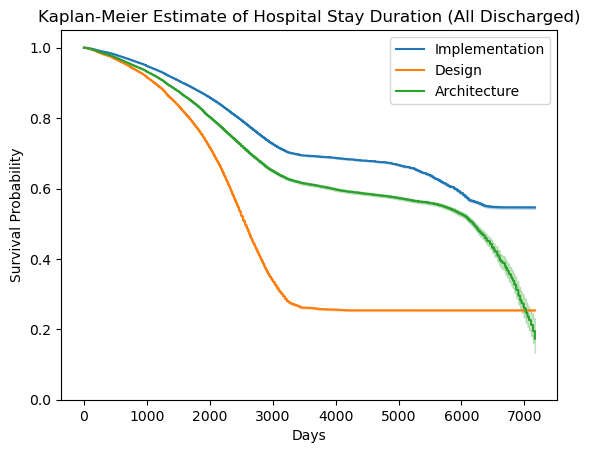

In [13]:
import pandas as pd
from lifelines import KaplanMeierFitter
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# imp_agg = pd.read_csv('imp-agg-trad.csv')
# des_agg = pd.read_csv('des-agg-trad.csv')
# arch_agg = pd.read_csv('arch-agg-trad.csv')

imp_agg['start'] = pd.to_datetime(imp_agg['start'], utc=True)
imp_agg['end'] = pd.to_datetime(imp_agg['end'], utc=True)

imp_agg['time_diff'] = imp_agg['end'] - imp_agg['start']
imp_agg['days'] = abs(imp_agg['time_diff'].dt.days)


des_agg['start'] = pd.to_datetime(des_agg['start'], utc=True)
des_agg['end'] = pd.to_datetime(des_agg['end'], utc=True)

des_agg['time_diff'] = des_agg['end'] - des_agg['start']
des_agg['days'] = abs(des_agg['time_diff'].dt.days)

arch_agg['start'] = pd.to_datetime(arch_agg['start'], utc=True)
arch_agg['end'] = pd.to_datetime(arch_agg['end'], utc=True)

arch_agg['time_diff'] = arch_agg['end'] - arch_agg['start']
arch_agg['days'] = abs(arch_agg['time_diff'].dt.days)

# Initialize the KaplanMeierFitter
kmf_imp = KaplanMeierFitter()
kmf_des = KaplanMeierFitter()
kmf_arch = KaplanMeierFitter()

# Fit the data into the model
kmf_imp.fit(durations=imp_agg['days'], event_observed=imp_agg['removed'], label='Implementation')
kmf_des.fit(durations=des_agg['days'], event_observed=des_agg['removed'], label='Design')
kmf_arch.fit(durations=arch_agg['days'], event_observed=arch_agg['removed'], label='Architecture')

# Plot the Kaplan-Meier estimate

kmf_imp.plot_survival_function()
kmf_des.plot_survival_function()
kmf_arch.plot_survival_function()

plt.title('Kaplan-Meier Estimate of Hospital Stay Duration (All Discharged)')
plt.xlabel('Days')
plt.ylabel('Survival Probability')
plt.ylim([0,1.05])

plt.show()

In [62]:
imp_smells = ['Long Statement', 'Magic Number', 'Complex Method',
       'Missing default', 'Long Identifier', 'Empty catch clause',
       'Long Method', 'Complex Conditional', 'Long Parameter List',
       'Abstract Function Call From Constructor']
des_smells = ['Unutilized Abstraction', 'Broken Hierarchy',
       'Broken Modularization', 'Feature Envy', 'Deficient Encapsulation',
       'Insufficient Modularization', 'Imperative Abstraction',
       'Multifaceted Abstraction', 'Cyclically-dependent Modularization',
       'Cyclic Hierarchy', 'Missing Hierarchy', 'Rebellious Hierarchy',
       'Wide Hierarchy', 'Unexploited Encapsulation',
       'Multipath Hierarchy']
arch_smells = ['Feature Concentration', 'Scattered Functionality',
       'Cyclic Dependency', 'Unstable Dependency', 'Dense Structure',
       'God Component']

In [63]:
bloaters = ['Long Parameter List', 'Long Statement','Long Method', 'Long Identifier']
oop_abusers = ['Abstract Function Call From Constructor', 'Broken Hierarchy','Imperative Abstraction', 'Unutilized Abstraction','Wide Hierarchy','Rebellious Hierarchy','Missing Hierarchy', 'Cyclic Hierarchy','Multipath Hierarchy','Multifaceted Abstraction']
c_preventers = ['Cyclic Dependency','Unstable Dependency']
dispensables = ['Empty catch clause', 'Magic Number','Unexploited Encapsulation']
couplers = ['Scattered Functionality', 'Missing Hierarchy', 'Deficient Encapsulation', 'Feature Envy']

In [64]:
'complex method''Missing default''Complex Conditional''Broken Modularization'


'complex methodMissing defaultComplex ConditionalBroken Modularization'

In [65]:
import pandas as pd
imp_agg = pd.read_csv('imp-agg.csv')
des_agg = pd.read_csv('des-agg.csv')
arch_agg = pd.read_csv('arch-agg.csv')

imp_agg = imp_agg[imp_agg['Smell'].isin(imp_smells)]
des_agg = des_agg[des_agg['Smell'].isin(des_smells)]
arch_agg = arch_agg[arch_agg['Smell'].isin(arch_smells)]

sim_agg = pd.concat([imp_agg, des_agg, arch_agg], ignore_index=True)
# sim_agg = sim_agg.drop_duplicates()
sim_agg = sim_agg.drop(['Type', 'Method'], axis=1)
sim_agg

,Unnamed: 0,Project,Package,Smell,start,end,removed
0,0,adf-sample-agent-java,adf.sample.algorithm.clustering,Long Parameter List,2015-12-02 13:42:29+09:00,2015-12-02 13:42:29+09:00,0
1,3,adf-sample-agent-java,adf.sample.algorithm.clustering,Long Statement,2015-12-02 13:42:29+09:00,2015-12-02 13:42:29+09:00,0
2,4,adf-sample-agent-java,adf.sample.algorithm.clustering,Long Statement,2015-12-02 13:42:29+09:00,2015-12-02 13:42:29+09:00,0
3,6,adf-sample-agent-java,adf.sample.algorithm.clustering,Complex Method,2015-12-02 13:42:29+09:00,2015-12-02 13:42:29+09:00,0
4,7,adf-sample-agent-java,adf.sample.algorithm.clustering,Long Statement,2015-12-02 13:42:29+09:00,2015-12-02 13:42:29+09:00,0
...,...,...,...,...,...,...,...
3234634,30,varsim,com.bina.varsim.types.variant,Scattered Functionality,2012-01-22 22:50:26-05:00,2012-01-22 22:50:26-05:00,0
3234635,31,varsim,com.bina.varsim.util,Cyclic Dependency,2012-01-22 22:50:26-05:00,2012-01-22 22:50:26-05:00,0
3234636,34,varsim,com.bina.varsim.util,Unstable Dependency,2012-01-22 22:50:26-05:00,2012-01-22 22:50:26-05:00,0
3234637,35,varsim,com.bina.varsim.util,Feature Concentration,2012-01-22 22:50:26-05:00,2012-01-22 22:50:26-05:00,0


In [66]:
imp_agg = pd.read_csv('imp-agg-trad.csv')
des_agg = pd.read_csv('des-agg-trad.csv')
arch_agg = pd.read_csv('arch-agg-trad.csv')

imp_agg = imp_agg[imp_agg['Smell'].isin(imp_smells)]
des_agg = des_agg[des_agg['Smell'].isin(des_smells)]
arch_agg = arch_agg[arch_agg['Smell'].isin(arch_smells)]

trad_agg = pd.concat([imp_agg, des_agg, arch_agg], ignore_index=True)
# trad_agg = trad_agg.drop_duplicates()
trad_agg = trad_agg.drop(['Type', 'Method'], axis=1)
trad_agg

,Unnamed: 0,Project,Package,Smell,start,end,removed
0,0,Android-WebMonkey,com.github.warren_bank.webmonkey,Empty catch clause,2020-09-11 23:28:59-07:00,2020-09-11 23:28:59-07:00,0
1,1,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-11 23:28:59-07:00,2020-09-11 23:28:59-07:00,0
2,3,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-11 23:28:59-07:00,2020-09-11 23:28:59-07:00,0
3,4,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-11 23:28:59-07:00,2020-09-11 23:28:59-07:00,0
4,5,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-11 23:28:59-07:00,2020-09-11 23:28:59-07:00,0
...,...,...,...,...,...,...,...
9782534,21,KISS-Desktop,fr.neamar.kiss.searcher,Feature Concentration,2022-08-15 19:13:58+08:00,2022-08-15 19:13:58+08:00,0
9782535,122,KISS-Desktop,fr.neamar.kiss.ui,Cyclic Dependency,2022-08-15 19:13:58+08:00,2022-08-15 19:13:58+08:00,0
9782536,125,KISS-Desktop,fr.neamar.kiss.utils,Cyclic Dependency,2022-08-15 19:13:58+08:00,2022-08-15 19:13:58+08:00,0
9782537,128,KISS-Desktop,fr.neamar.kiss.utils,Unstable Dependency,2022-08-15 19:13:58+08:00,2022-08-15 19:13:58+08:00,0


In [67]:
import math
sim_agg['start'] = pd.to_datetime(sim_agg['start'], utc=True)
sim_agg['end'] = pd.to_datetime(sim_agg['end'], utc=True)

sim_agg['time_diff'] = sim_agg['end'] - sim_agg['start']
sim_agg['days'] = abs(sim_agg['time_diff'].dt.days)
sim_agg['weeks'] = (sim_agg['days']/28).astype(int)

trad_agg['start'] = pd.to_datetime(trad_agg['start'], utc=True)
trad_agg['end'] = pd.to_datetime(trad_agg['end'], utc=True)

trad_agg['time_diff'] = trad_agg['end'] - trad_agg['start']
trad_agg['days'] = abs(trad_agg['time_diff'].dt.days)
trad_agg['weeks'] = (trad_agg['days']/28).astype(int)

sim_agg.loc[:, 'removed'] = pd.to_numeric(sim_agg['removed'])
trad_agg.loc[:, 'removed'] = pd.to_numeric(trad_agg['removed'])

In [68]:
sim_agg['start'].min() - sim_agg['end'].max()

Timedelta('-4949 days +03:39:57')

In [69]:
trad_agg['start'].min() - trad_agg['end'].max()

Timedelta('-6300 days +17:13:55')

In [70]:
min_day = max(sim_agg['start'].min(), trad_agg['start'].min())
max_day = min(sim_agg['end'].max(), trad_agg['end'].max())

In [71]:
trad_agg = trad_agg[trad_agg['start'] >= min_day]
trad_agg = trad_agg[trad_agg['end'] <= max_day]
trad_agg

,Unnamed: 0,Project,Package,Smell,start,end,removed,time_diff,days,weeks
0,0,Android-WebMonkey,com.github.warren_bank.webmonkey,Empty catch clause,2020-09-12 06:28:59+00:00,2020-09-12 06:28:59+00:00,0,0 days,0,0
1,1,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-12 06:28:59+00:00,2020-09-12 06:28:59+00:00,0,0 days,0,0
2,3,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-12 06:28:59+00:00,2020-09-12 06:28:59+00:00,0,0 days,0,0
3,4,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-12 06:28:59+00:00,2020-09-12 06:28:59+00:00,0,0 days,0,0
4,5,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-12 06:28:59+00:00,2020-09-12 06:28:59+00:00,0,0 days,0,0
...,...,...,...,...,...,...,...,...,...,...
9782534,21,KISS-Desktop,fr.neamar.kiss.searcher,Feature Concentration,2022-08-15 11:13:58+00:00,2022-08-15 11:13:58+00:00,0,0 days,0,0
9782535,122,KISS-Desktop,fr.neamar.kiss.ui,Cyclic Dependency,2022-08-15 11:13:58+00:00,2022-08-15 11:13:58+00:00,0,0 days,0,0
9782536,125,KISS-Desktop,fr.neamar.kiss.utils,Cyclic Dependency,2022-08-15 11:13:58+00:00,2022-08-15 11:13:58+00:00,0,0 days,0,0
9782537,128,KISS-Desktop,fr.neamar.kiss.utils,Unstable Dependency,2022-08-15 11:13:58+00:00,2022-08-15 11:13:58+00:00,0,0 days,0,0


In [72]:
sim_agg = sim_agg[sim_agg['start'] >= min_day]
sim_agg = sim_agg[sim_agg['end'] <= max_day]
sim_agg

,Unnamed: 0,Project,Package,Smell,start,end,removed,time_diff,days,weeks
0,0,adf-sample-agent-java,adf.sample.algorithm.clustering,Long Parameter List,2015-12-02 04:42:29+00:00,2015-12-02 04:42:29+00:00,0,0 days,0,0
1,3,adf-sample-agent-java,adf.sample.algorithm.clustering,Long Statement,2015-12-02 04:42:29+00:00,2015-12-02 04:42:29+00:00,0,0 days,0,0
2,4,adf-sample-agent-java,adf.sample.algorithm.clustering,Long Statement,2015-12-02 04:42:29+00:00,2015-12-02 04:42:29+00:00,0,0 days,0,0
3,6,adf-sample-agent-java,adf.sample.algorithm.clustering,Complex Method,2015-12-02 04:42:29+00:00,2015-12-02 04:42:29+00:00,0,0 days,0,0
4,7,adf-sample-agent-java,adf.sample.algorithm.clustering,Long Statement,2015-12-02 04:42:29+00:00,2015-12-02 04:42:29+00:00,0,0 days,0,0
...,...,...,...,...,...,...,...,...,...,...
3234634,30,varsim,com.bina.varsim.types.variant,Scattered Functionality,2012-01-23 03:50:26+00:00,2012-01-23 03:50:26+00:00,0,0 days,0,0
3234635,31,varsim,com.bina.varsim.util,Cyclic Dependency,2012-01-23 03:50:26+00:00,2012-01-23 03:50:26+00:00,0,0 days,0,0
3234636,34,varsim,com.bina.varsim.util,Unstable Dependency,2012-01-23 03:50:26+00:00,2012-01-23 03:50:26+00:00,0,0 days,0,0
3234637,35,varsim,com.bina.varsim.util,Feature Concentration,2012-01-23 03:50:26+00:00,2012-01-23 03:50:26+00:00,0,0 days,0,0


In [73]:
print(len(sim_agg))
print(len(trad_agg))

3234639
9652449


In [74]:
sim_agg = sim_agg[sim_agg['days']!=0]
trad_agg = trad_agg[trad_agg['days']!=0]
trad_agg

,Unnamed: 0,Project,Package,Smell,start,end,removed,time_diff,days,weeks
24,0,Android-WebMonkey,com.github.warren_bank.webmonkey,Empty catch clause,2020-09-12 06:28:59+00:00,2020-10-11 21:27:35+00:00,0,29 days 14:58:36,29,1
25,1,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-12 06:28:59+00:00,2020-10-11 21:27:35+00:00,0,29 days 14:58:36,29,1
26,3,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-12 06:28:59+00:00,2020-10-11 21:27:35+00:00,0,29 days 14:58:36,29,1
27,4,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-12 06:28:59+00:00,2020-10-11 21:27:35+00:00,0,29 days 14:58:36,29,1
28,5,Android-WebMonkey,com.github.warren_bank.webmonkey,Magic Number,2020-09-12 06:28:59+00:00,2020-10-11 21:27:35+00:00,0,29 days 14:58:36,29,1
...,...,...,...,...,...,...,...,...,...,...
9782528,21,KISS-Desktop,fr.neamar.kiss.searcher,Feature Concentration,2022-07-15 13:19:24+00:00,2022-08-15 11:13:58+00:00,0,30 days 21:54:34,30,1
9782529,122,KISS-Desktop,fr.neamar.kiss.ui,Cyclic Dependency,2022-07-15 13:19:24+00:00,2022-08-15 11:13:58+00:00,0,30 days 21:54:34,30,1
9782530,125,KISS-Desktop,fr.neamar.kiss.utils,Cyclic Dependency,2022-07-15 13:19:24+00:00,2022-08-15 11:13:58+00:00,0,30 days 21:54:34,30,1
9782531,128,KISS-Desktop,fr.neamar.kiss.utils,Unstable Dependency,2022-07-15 13:19:24+00:00,2022-08-15 11:13:58+00:00,0,30 days 21:54:34,30,1


In [75]:
print(len(sim_agg))
print(len(trad_agg))

2874761
9005654


In [77]:
print(sim_agg.isna().any(axis=1).sum())
print(trad_agg.isna().any(axis=1).sum())

print(sim_agg.columns[sim_agg.isnull().any()].tolist())
print(trad_agg.columns[trad_agg.isnull().any()].tolist())

sim_agg.dropna(inplace=True)
trad_agg.dropna(inplace=True)

print(sim_agg.isna().any(axis=1).sum())
print(trad_agg.isna().any(axis=1).sum())

print(sim_agg.columns[sim_agg.isnull().any()].tolist())
print(trad_agg.columns[trad_agg.isnull().any()].tolist())

0
0
[]
[]


C:\Users\riasa\AppData\Local\Temp\ipykernel_34476\3343731950.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_agg.dropna(inplace=True)
C:\Users\riasa\AppData\Local\Temp\ipykernel_34476\3343731950.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trad_agg.dropna(inplace=True)


0
0
[]
[]


[(3, 459), (9, 76), (20, 1), (26, 519), (27, 781), (28, 19913), (29, 12226), (30, 9023), (31, 5607), (32, 2991), (33, 2724), (34, 2971), (35, 2457), (36, 2060), (37, 1064), (38, 560), (39, 1421), (40, 712), (41, 673), (42, 943), (43, 927), (44, 506), (45, 784), (46, 163), (47, 743), (48, 466), (49, 685), (50, 386), (51, 217), (52, 194), (53, 283), (54, 1169), (55, 177), (56, 5318), (57, 7788), (58, 7034), (59, 5797), (60, 3056), (61, 5479), (62, 2927), (63, 2827), (64, 1993), (65, 1678), (66, 3724), (67, 2605), (68, 1976), (69, 1567), (70, 1678), (71, 1630), (72, 271), (73, 752), (74, 2141), (75, 1753), (76, 507), (77, 366), (78, 590), (79, 1116), (80, 506), (81, 306), (82, 1501), (83, 1127), (84, 2096), (85, 3527), (86, 2056), (87, 5414), (88, 6015), (89, 2892), (90, 2371), (91, 3572), (92, 3214), (93, 2837), (94, 2558), (95, 2543), (96, 2175), (97, 2960), (98, 2666), (99, 2002), (100, 1044), (101, 1665), (102, 1818), (103, 4132), (104, 1329), (105, 1521), (106, 586), (107, 367), (108

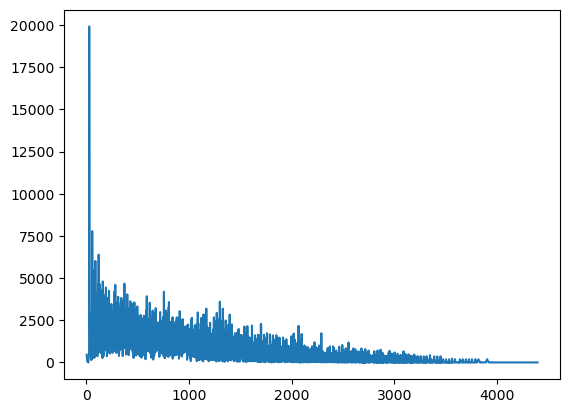

In [78]:
import matplotlib.pyplot as plt
import numpy as np

values_sim = sim_agg[sim_agg['Smell'].isin(des_smells)]['days'].value_counts()
values_trad = trad_agg[trad_agg['Smell'].isin(des_smells)]['days'].value_counts()

lists =  sorted(values_trad.items())
print(lists)
x,y = zip(*lists)
# plt.plot(values_sim.keys().tolist(), values_sim.values)
plt.plot(x, y)
plt.show()


[(14, 5), (21, 7), (23, 6), (26, 6), (27, 19), (28, 6378), (29, 2771), (30, 2061), (31, 1127), (32, 941), (33, 1147), (34, 1409), (35, 820), (36, 636), (37, 366), (38, 343), (39, 325), (40, 220), (41, 593), (42, 696), (43, 429), (44, 429), (45, 327), (46, 102), (47, 183), (48, 166), (49, 113), (50, 94), (51, 20), (52, 46), (53, 18), (54, 43), (55, 260), (56, 2819), (57, 1783), (58, 964), (59, 1173), (60, 1557), (61, 908), (62, 518), (63, 1467), (64, 1090), (65, 990), (66, 680), (67, 531), (68, 616), (69, 756), (70, 446), (71, 238), (72, 585), (73, 643), (74, 204), (75, 576), (76, 386), (77, 919), (78, 140), (79, 148), (80, 168), (81, 20), (82, 587), (83, 161), (84, 1119), (85, 975), (86, 707), (87, 1098), (88, 1225), (89, 1042), (90, 1100), (91, 981), (92, 348), (93, 935), (94, 891), (95, 271), (96, 1277), (97, 767), (98, 788), (99, 268), (100, 574), (101, 532), (102, 259), (103, 163), (104, 598), (105, 798), (106, 930), (107, 162), (108, 221), (109, 662), (110, 624), (111, 366), (112,

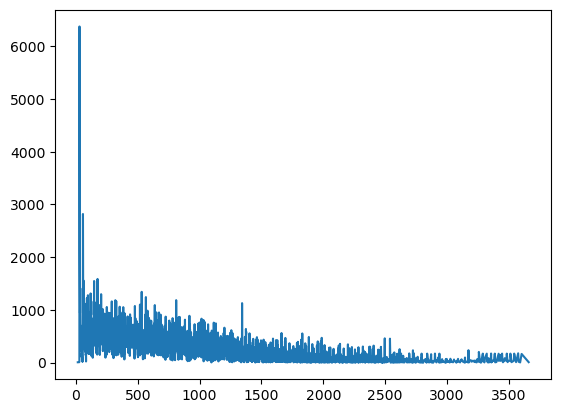

In [79]:
import matplotlib.pyplot as plt
import numpy as np

values_sim = sim_agg[sim_agg['Smell'].isin(des_smells)]['days'].value_counts()
values_trad = trad_agg[trad_agg['Smell'].isin(des_smells)]['days'].value_counts()

lists =  sorted(values_sim.items())
print(sorted(values_sim.items()))
x,y = zip(*lists)
# plt.plot(values_sim.keys().tolist(), values_sim.values)
plt.plot(x, y)
plt.show()

In [80]:
# def remove_outliers(df, columns):
#     Q1 = df[columns].quantile(0.25)
#     Q3 = df[columns].quantile(0.75)
#     IQR = Q3 - Q1
#     is_not_outlier = ~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)
#     return df[is_not_outlier]

In [81]:
# def remove_outliers(df, column, z_thresh=3):
#     mean_col = df[column].mean()
#     std_col = df[column].std()
#     df['z_score'] = (df[column] - mean_col) / std_col

#     filtered_df = df[df['z_score'].abs() <= z_thresh]

#     filtered_df = filtered_df.drop(columns=['z_score'])

#     return filtered_df

In [82]:
# print(len(sim_agg))
# print(len(trad_agg))

# sim_agg = remove_outliers(sim_agg, ['days'])
# trad_agg = remove_outliers(trad_agg, ['days'])

# print(len(sim_agg))
# print(len(trad_agg))

In [83]:
# def scale_days(group):
#     max_duration = group['days'].max()
#     group['days'] = group['days'] / max_duration
#     return group

# sim_agg = sim_agg.groupby('Project').apply(scale_days)
# trad_agg = trad_agg.groupby('Project').apply(scale_days)

In [84]:
# import numpy as np

# print(len(sim_agg['Project'].unique()))
# print(len(trad_agg['Project'].unique()))

# # np.random.seed(2441139)
# unique_projects = trad_agg['Project'].unique()
# random_subsample = np.random.choice(unique_projects, size=len(sim_agg['Project'].unique()), replace=False)

# trad_agg = trad_agg[trad_agg['Project'].isin(random_subsample)]

# print(len(sim_agg['Project'].unique()))
# print(len(trad_agg['Project'].unique()))

In [85]:
# no_inf = ['Long Parameter List', 'Abstract Function Call From Constructor', 'Unutilized Abstraction', 'Deficient Encapsulation', 'Insufficient Modularization', 'Broken Modularization', 'Imperative Abstraction', 'Broken Hierarchy', 'Feature Envy', 'Missing Hierarchy', 'Unexploited Encapsulation', 'Feature Concentration', 'Cyclic Dependency', 'Unstable Dependency', 'Scattered Functionality']
# sim_agg = sim_agg[sim_agg['Smell'].isin(no_inf)]
# trad_agg = trad_agg[trad_agg['Smell'].isin(no_inf)]

## Kaplan Meiyer Analysis

Simulation Vs Traditioinal
0.0


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
       10474.37 <0.005       inf

Simulation median survival  3513.0
Traditional median survival  2698.0
Difference median survival  815.0


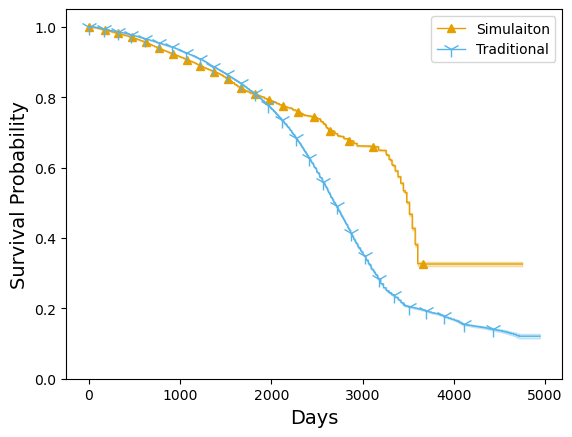

In [111]:
import pandas as pd
from lifelines import KaplanMeierFitter
from lifelines.statistics import multivariate_logrank_test, logrank_test
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from scipy.integrate import trapz

kmf_sim = KaplanMeierFitter()
kmf_trad = KaplanMeierFitter()

kmf_sim.fit(durations=sim_agg['days'], event_observed=sim_agg['removed'], label='Simulaiton')
kmf_trad.fit(durations=trad_agg['days'], event_observed=trad_agg['removed'], label='Traditional')

colors =  ['#E69F00', '#56B4E9']
kmf_sim.plot_survival_function(color = colors[0], marker='^',markersize=6, markevery=150, linewidth=1)
kmf_trad.plot_survival_function(color = colors[1],marker='1',markersize=12, markevery=150, linewidth=1)


results_AB = logrank_test(sim_agg['days'], trad_agg['days'], event_observed_A=sim_agg['removed'], event_observed_B=trad_agg['removed'])
print("Simulation Vs Traditioinal")
print(results_AB.p_value)
results_AB.print_summary()

print("Simulation median survival ", kmf_sim.median_survival_time_)
print("Traditional median survival ", kmf_trad.median_survival_time_)
print("Difference median survival ", kmf_sim.median_survival_time_-kmf_trad.median_survival_time_)


plt.xlabel('Days', fontsize=14)
plt.ylabel('Survival Probability', fontsize=14)
plt.ylim([0,1.05])
plt.savefig('kaplan-all.png')

plt.show()

Implementation median survival  3513.0
Design median survival  3418.0
Architecture median survival  3169.0


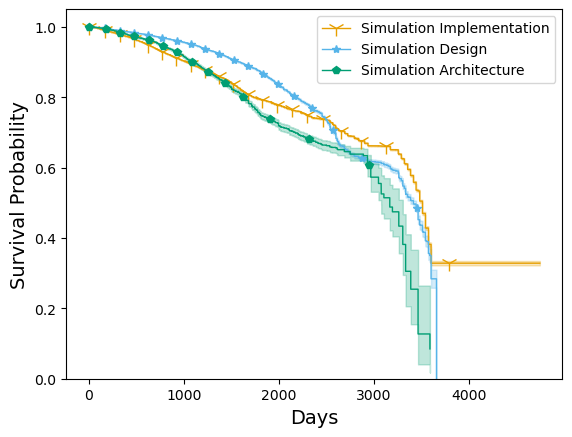

In [110]:
import pandas as pd
from lifelines import KaplanMeierFitter
from lifelines.statistics import multivariate_logrank_test, logrank_test
import matplotlib.pyplot as plt
from datetime import datetime, timedelta


# Simulation Smells
simp_agg = sim_agg[sim_agg['Smell'].isin(imp_smells)]
sdes_agg = sim_agg[sim_agg['Smell'].isin(des_smells)]
sarch_agg = sim_agg[sim_agg['Smell'].isin(arch_smells)]

skmf_imp = KaplanMeierFitter()
skmf_des = KaplanMeierFitter()
skmf_arch = KaplanMeierFitter()

skmf_imp.fit(durations=simp_agg['days'], event_observed=simp_agg['removed'], label='Simulation Implementation')
skmf_des.fit(durations=sdes_agg['days'], event_observed=sdes_agg['removed'], label='Simulation Design')
skmf_arch.fit(durations=sarch_agg['days'], event_observed=sarch_agg['removed'], label='Simulation Architecture')

colors= ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7']
skmf_imp.plot_survival_function(color = colors[0], marker='1',markersize=12, markevery=150, linewidth=1)
skmf_des.plot_survival_function(color = colors[1], marker='*',markersize=6, markevery=150, linewidth=1)
skmf_arch.plot_survival_function(color = colors[2], marker='p',markersize=6, markevery=150, linewidth=1)

print("Implementation median survival ", skmf_imp.median_survival_time_)
print("Design median survival ", skmf_des.median_survival_time_)
print("Architecture median survival ", skmf_arch.median_survival_time_)


plt.xlabel('Days', fontsize=14)
plt.ylabel('Survival Probability', fontsize=14)
plt.ylim([0,1.05])
plt.savefig('kaplan-break.png')

plt.show()


Bloaters
0.27654807882514804
Bloaters  median survival  3513.0
---------------------------
Object Oriented Abusers
0.16856881641739876
Object Oriented Abusers  median survival  3336.0
---------------------------
Dispensables
0.3393852341920631
Dispensables  median survival  3484.0
---------------------------
Couplers
0.0
Couplers  median survival  3484.0
---------------------------
Change Preventers
0.24588705885480983
Change Preventers  median survival  3169.0
---------------------------


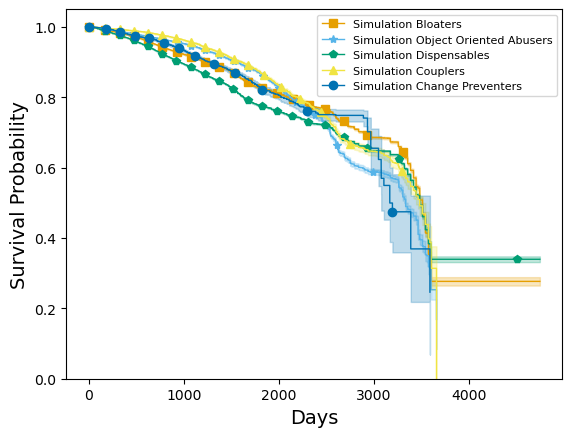

In [109]:
import pandas as pd
from lifelines import KaplanMeierFitter
from lifelines.statistics import multivariate_logrank_test, logrank_test
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

smell_list = ['Magic Number','Long Statement','Long Parameter List', 'Unutilized Abstraction','Broken Modularization','Feature Concentration']
smell_dict = {'Bloaters': bloaters, 'Object Oriented Abusers': oop_abusers, 'Dispensables': dispensables, 'Couplers':couplers, 'Change Preventers': c_preventers}

results_sim = {}
kmfs_sim = {}
kmfs_trad = {}
p_values = {}

colors= ['#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#D55E00', '#CC79A7']
merkers = ['s', "*", "p", "^", "o"]
for smell_grp in smell_dict.keys():
    kmfs_sim[smell_grp] = KaplanMeierFitter()
#     kmfs_trad[smell_grp] = KaplanMeierFitter()

for smell_grp in smell_dict.keys():
    sim_smell = sim_agg[sim_agg['Smell'].isin(smell_dict[smell_grp])]
    trad_smell = trad_agg[trad_agg['Smell'].isin(smell_dict[smell_grp])]
    
#     res = logrank_test(sim_smell['days'], trad_smell['days'], event_observed_A=sim_smell['removed'], event_observed_B=trad_smell['removed'])
#     p_values[smell_grp] = res.p_value
    
    kmfs_sim[smell_grp].fit(durations=sim_smell['days'], event_observed=sim_smell['removed'], label="Simulation "+ smell_grp)
#     kmfs_trad[smell_grp].fit(durations=trad_smell['days'], event_observed=trad_smell['removed'], label="Tradtional "+smell_grp)  
    
for smell_grp in smell_dict.keys():
#         print(smell_grp, " -------> ", p_values[smell_grp])
        kmfs_sim[smell_grp].plot_survival_function(color = colors[list(smell_dict.keys()).index(smell_grp)], marker=merkers[list(smell_dict.keys()).index(smell_grp)],markersize=6, markevery=150, linewidth=1)
        print(smell_grp)
        print(kmfs_sim[smell_grp].survival_function_["Simulation "+ smell_grp].tolist()[-1])
#         kmfs_trad[smell_grp].plot_survival_function()
        
        print(smell_grp , " median survival ", kmfs_sim[smell_grp].median_survival_time_)
#         print(smell_grp, "median survival ", kmfs_trad[smell_grp].median_survival_time_)
#         print("Difference median survival ", kmfs_sim[smell_grp].median_survival_time_-kmfs_trad[smell_grp].median_survival_time_)
        print("---------------------------")

plt.legend(prop={'size': 8})
plt.xlabel('Days', fontsize=14)
plt.ylabel('Survival Probability', fontsize=14)
plt.ylim([0,1.05])
plt.savefig('kaplan-change.png')

plt.show()

['Long Statement', 'Magic Number', 'Complex Method', 'Missing default', 'Long Identifier', 'Empty catch clause', 'Long Method', 'Complex Conditional', 'Long Parameter List', 'Abstract Function Call From Constructor']
['Unutilized Abstraction', 'Broken Hierarchy', 'Broken Modularization', 'Feature Envy', 'Deficient Encapsulation', 'Insufficient Modularization', 'Imperative Abstraction', 'Multifaceted Abstraction', 'Cyclically-dependent Modularization', 'Cyclic Hierarchy', 'Missing Hierarchy', 'Rebellious Hierarchy', 'Wide Hierarchy', 'Unexploited Encapsulation', 'Multipath Hierarchy']
['Feature Concentration', 'Scattered Functionality', 'Cyclic Dependency', 'Unstable Dependency', 'Dense Structure', 'God Component']
Implementation  median survival  3513.0
Implementation median survival  2853.0
Difference median survival  660.0
---------------------------
Design  median survival  3418.0
Design median survival  2432.0
Difference median survival  986.0
---------------------------
Architectu

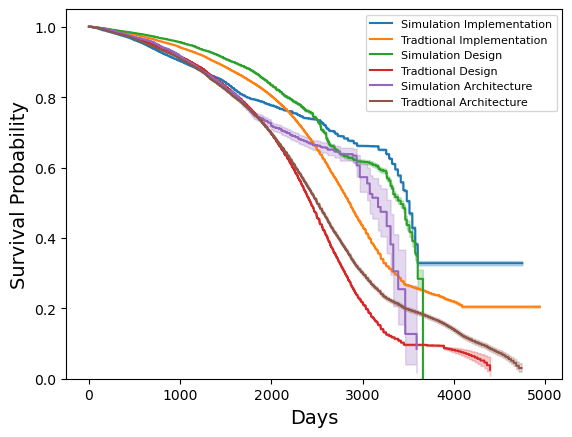

In [46]:
import pandas as pd
from lifelines import KaplanMeierFitter
from lifelines.statistics import multivariate_logrank_test, logrank_test
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

smell_list = ['Magic Number','Long Statement','Long Parameter List', 'Unutilized Abstraction','Broken Modularization','Feature Concentration']
smell_dict = {'Implementation': imp_smells, 'Design': des_smells, 'Architecture': arch_smells}

results_sim = {}
kmfs_sim = {}
kmfs_trad = {}
p_values = {}

for smell_grp in smell_dict.keys():
    kmfs_sim[smell_grp] = KaplanMeierFitter()
    kmfs_trad[smell_grp] = KaplanMeierFitter()

for smell_grp in smell_dict.keys():
    print(smell_dict[smell_grp])
    sim_smell = sim_agg[sim_agg['Smell'].isin(smell_dict[smell_grp])]
    trad_smell = trad_agg[trad_agg['Smell'].isin(smell_dict[smell_grp])]
    
    res = logrank_test(sim_smell['days'], trad_smell['days'], event_observed_A=sim_smell['removed'], event_observed_B=trad_smell['removed'])
    p_values[smell_grp] = res.p_value
    
    if res.p_value <0.05:
        kmfs_sim[smell_grp].fit(durations=sim_smell['days'], event_observed=sim_smell['removed'], label="Simulation "+ smell_grp)
        kmfs_trad[smell_grp].fit(durations=trad_smell['days'], event_observed=trad_smell['removed'], label="Tradtional "+smell_grp)  
    
for smell_grp in smell_dict.keys():
    if p_values[smell_grp] < 0.05:
#         print(smell_grp, " -------> ", p_values[smell_grp])
        kmfs_sim[smell_grp].plot_survival_function()
        kmfs_trad[smell_grp].plot_survival_function()
        
        print(smell_grp , " median survival ", kmfs_sim[smell_grp].median_survival_time_)
        print(smell_grp, "median survival ", kmfs_trad[smell_grp].median_survival_time_)
        print("Difference median survival ", kmfs_sim[smell_grp].median_survival_time_-kmfs_trad[smell_grp].median_survival_time_)
        print("---------------------------")

plt.legend(prop={'size': 8})
plt.xlabel('Days', fontsize=14)
plt.ylabel('Survival Probability', fontsize=14)
plt.ylim([0,1.05])
plt.savefig('kaplan-change.png')

plt.show()

Long Parameter List  median survival  3513.0
---------------------------
Long Statement  median survival  3467.0
---------------------------
Complex Method  median survival  3513.0
---------------------------
Magic Number  median survival  3484.0
---------------------------
Complex Conditional  median survival  3513.0
---------------------------
Long Method  median survival  3604.0
---------------------------
Missing default  median survival  inf
---------------------------
Empty catch clause  median survival  3322.0
---------------------------
Long Identifier  median survival  3576.0
---------------------------
Abstract Function Call From Constructor  median survival  1733.0
---------------------------
Unutilized Abstraction  median survival  3336.0
---------------------------
Deficient Encapsulation  median survival  3513.0
---------------------------
Insufficient Modularization  median survival  3604.0
---------------------------
Broken Modularization  median survival  3107.0
------

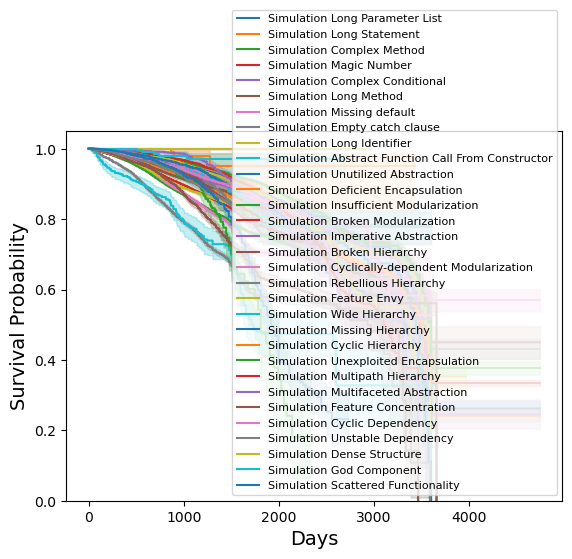

[]


In [47]:
import pandas as pd
from lifelines import KaplanMeierFitter
from lifelines.statistics import multivariate_logrank_test, logrank_test
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import numpy as np

no_inf = []
smell_list = sim_agg['Smell'].unique().tolist()
# smell_dict = {'Bloaters': bloaters, 'Object Oriented Abusers': oop_abusers, 'Dispensables': dispensables, 'Couplers':couplers, 'Change Preventers': c_preventers}

results_sim = {}
kmfs_sim = {}
kmfs_trad = {}
p_values = {}

median_days = {}
for smell in smell_list:
    kmfs_sim[smell] = KaplanMeierFitter()
#     kmfs_trad[smell] = KaplanMeierFitter()

for smell in smell_list:
    sim_smell = sim_agg[sim_agg['Smell'] == smell]
    trad_smell = trad_agg[trad_agg['Smell'] == smell]
    
#     res = logrank_test(sim_smell['days'], trad_smell['days'], event_observed_A=sim_smell['removed'], event_observed_B=trad_smell['removed'])
#     p_values[smell] = res.p_value
    
    kmfs_sim[smell].fit(durations=sim_smell['days'], event_observed=sim_smell['removed'], label="Simulation "+ smell)
#     kmfs_trad[smell].fit(durations=trad_smell['days'], event_observed=trad_smell['removed'], label="Tradtional "+smell)  
    
for smell in smell_list:
#     print(smell, " -------> ", p_values[smell])
#     no_inf.append(smell)
    kmfs_sim[smell].plot_survival_function()
#         kmfs_trad[smell].plot_survival_function()
    
    median_days[smell] = kmfs_sim[smell].median_survival_time_
    print(smell , " median survival ", kmfs_sim[smell].median_survival_time_)
#         print(smell, "median survival ", kmfs_trad[smell].median_survival_time_)
#         print("Difference median survival ", kmfs_sim[smell].median_survival_time_-kmfs_trad[smell].median_survival_time_)
    print("---------------------------")


plt.legend(prop={'size': 8})
plt.xlabel('Days', fontsize=14)
plt.ylabel('Survival Probability', fontsize=14)
plt.ylim([0,1.05])
plt.savefig('kaplan-change.png')

plt.show()
print(no_inf)

In [168]:
median_days

df = pd.DataFrame(list(median_days.items()), columns=['Key', 'Value'])

# Convert the DataFrame to a LaTeX table
latex_table = df.to_latex(index=False, caption='Your Table Caption', label='tab:your_label', column_format='|c|c|', escape=False)

# Print the LaTeX table string
print(latex_table)

\begin{table}
\caption{Your Table Caption}
\label{tab:your_label}
\begin{tabular}{|c|c|}
\toprule
Key & Value \\
\midrule
Long Parameter List & 3513.000000 \\
Long Statement & 3467.000000 \\
Complex Method & 3513.000000 \\
Magic Number & 3484.000000 \\
Complex Conditional & 3513.000000 \\
Long Method & 3604.000000 \\
Missing default & inf \\
Empty catch clause & 3322.000000 \\
Long Identifier & 3576.000000 \\
Abstract Function Call From Constructor & 1733.000000 \\
Unutilized Abstraction & 3336.000000 \\
Deficient Encapsulation & 3513.000000 \\
Insufficient Modularization & 3604.000000 \\
Broken Modularization & 3107.000000 \\
Imperative Abstraction & 3306.000000 \\
Broken Hierarchy & 3661.000000 \\
Cyclically-dependent Modularization & inf \\
Rebellious Hierarchy & inf \\
Feature Envy & 3390.000000 \\
Wide Hierarchy & inf \\
Missing Hierarchy & 3446.000000 \\
Cyclic Hierarchy & inf \\
Unexploited Encapsulation & 1809.000000 \\
Multipath Hierarchy & inf \\
Multifaceted Abstraction & in

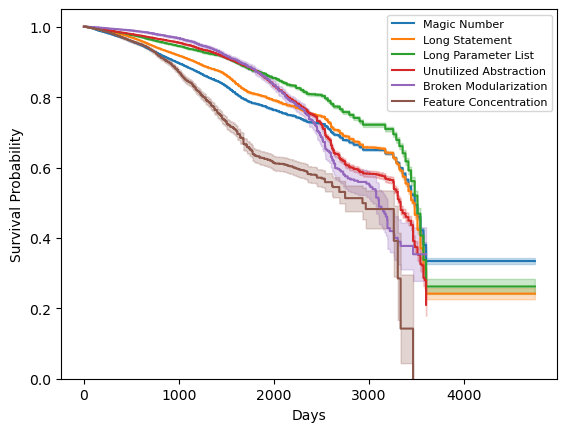

In [150]:
import pandas as pd
from lifelines import KaplanMeierFitter
from lifelines.statistics import multivariate_logrank_test, logrank_test
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

smell_list = ['Magic Number','Long Statement','Long Parameter List', 'Unutilized Abstraction','Broken Modularization','Feature Concentration']
# smell_list = imp_smells

results_sim = {}
kmfs_sim = KaplanMeierFitter()

for smell in smell_list:
    sim_smell = sim_agg[sim_agg['Smell'] == smell]
    kmfs_sim.fit(durations=sim_smell['days'], event_observed=sim_smell['removed'], label=smell)
    kmfs_sim.plot_survival_function()
        
plt.legend(prop={'size': 8})
plt.xlabel('Days')
plt.ylabel('Survival Probability')
plt.ylim([0,1.05])
plt.savefig('kaplan-des.png')

plt.show()

In [151]:
import pandas as pd
from lifelines import KaplanMeierFitter
from lifelines.statistics import multivariate_logrank_test, logrank_test
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

smell_list = ['Magic Number','Long Statement','Long Parameter List']

results_sim = {}
kmfs_sim = {}
kmfs_trad = {}
for smell in (smell_list):
    kmfs_sim[smell] = KaplanMeierFitter()
    kmfs_trad[smell] = KaplanMeierFitter()

for smell in smell_list:
    sim_smell = sim_agg[sim_agg['Smell'] == smell]
    kmfs_sim[smell].fit(durations=sim_smell['days'], event_observed=sim_smell['removed'], label="Simulation "+ smell)
    
    results_sim[smell] = logrank_test(sarch_agg['days'], tarch_agg['days'], event_observed_A=sarch_agg['removed'], event_observed_B=tarch_agg['removed'])
    print("Architecture Simulation vs Traditional")
    results_BC.print_summary()

    trad_smell = trad_agg[trad_agg['Smell'] == smell]
    kmfs_trad[smell].fit(durations=trad_smell['days'], event_observed=trad_smell['removed'], label="Tradtional "+smell)

for smell in (smell_list):
    kmfs_sim[smell].plot_survival_function()
    kmfs_trad[smell].plot_survival_function()

plt.legend(prop={'size': 8})
plt.xlabel('Days')
plt.ylabel('Survival Probability')
plt.ylim([0,1.05])
plt.savefig('kaplan-break.png')

plt.show()

NameError: name 'tarch_agg' is not defined